**Ahmed Kamal & Dhruv Joshi**

Fall 2019

CS343: Neural Networks

Project 3: Convolutional Neural Networks

In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt

plt.style.use(['seaborn-colorblind', 'seaborn-darkgrid'])
plt.rcParams.update({'font.size': 20})

np.set_printoptions(suppress=True, precision=3)

# Automatically reload external modules
%load_ext autoreload
%autoreload 2

## Task 1: 2D Convolution

As the name suggests, a critical component of a convolution neural network is the convolution operation. We're going to start by implementing a function in `filter_ops.py` that convolves an image with a filter. We will make use of this function when we built the convolutional net. We'll make several versions of the function to help with the debugging, gradually adding complexity.

First, implement `conv2_gray` according to the specifications in the comments. Run the following code to test your implementation

### a. Grayscale image with a multiple filters

In [2]:
from filter_ops import conv2_gray
import scipy.signal as sp
from PIL import Image

#### Test: Single kernel, odd image size

In [3]:
# Create test 'staircase' pattern 0-10 across the column dimension and replicate across rows
test_num_cols = 7
test_img = np.tile(1 + np.arange(0, test_num_cols), (test_num_cols, 1))

# Single uniform (normalized) averaging kernel
test_ker_sz = 2
test_ker = np.ones([1, test_ker_sz, test_ker_sz])
test_ker /= test_ker.sum()
print(f'test img shape is {test_img.shape} and test ker shape is {test_ker.shape}')
print(f'test img looks like:\n{test_img}\nand test ker looks like\n{test_ker}')

test img shape is (7, 7) and test ker shape is (1, 2, 2)
test img looks like:
[[1 2 3 4 5 6 7]
 [1 2 3 4 5 6 7]
 [1 2 3 4 5 6 7]
 [1 2 3 4 5 6 7]
 [1 2 3 4 5 6 7]
 [1 2 3 4 5 6 7]
 [1 2 3 4 5 6 7]]
and test ker looks like
[[[0.25 0.25]
  [0.25 0.25]]]


In [4]:
test_out_img = conv2_gray(test_img, test_ker, verbose=True)
print(f'Your filtered image shape is {test_out_img.shape} and it should be (1, 7, 7)')
print(f'Here is your filtered image:')
print('------------------------------------')
print(test_out_img[0])
print('------------------------------------')
print(f'Here is what it should look like:')
print('------------------------------------')
print(sp.convolve2d(test_img, test_ker[0], mode='same'))
print('------------------------------------')

Your filtered image shape is (1, 7, 7) and it should be (1, 7, 7)
Here is your filtered image:
------------------------------------
[[0.25 0.75 1.25 1.75 2.25 2.75 3.25]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]]
------------------------------------
Here is what it should look like:
------------------------------------
[[0.25 0.75 1.25 1.75 2.25 2.75 3.25]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5 ]]
------------------------------------


#### Test: Single kernel, even image size

In [5]:
# Create test 'staircase' pattern 0-10 across the column dimension and replicate across rows
test_num_cols = 8
test_img = np.tile(1 + np.arange(0, test_num_cols), (test_num_cols, 1))
print(f'test img shape is {test_img.shape} and test ker shape is {test_ker.shape}')
print(f'test img looks like:\n{test_img}\nand test ker looks like\n{test_ker}')

test img shape is (8, 8) and test ker shape is (1, 2, 2)
test img looks like:
[[1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]]
and test ker looks like
[[[0.25 0.25]
  [0.25 0.25]]]


In [6]:
test_out_img = conv2_gray(test_img, test_ker, verbose=True)
print(f'Your filtered image shape is {test_out_img.shape} and it should be (1, 8, 8)')
print(f'Here is your filtered image:')
print('------------------------------------')
print(test_out_img[0])
print('------------------------------------')
print(f'Here is what it should look like:')
print('------------------------------------')
print(sp.convolve2d(test_img, test_ker[0], mode='same'))
print('------------------------------------')

Your filtered image shape is (1, 8, 8) and it should be (1, 8, 8)
Here is your filtered image:
------------------------------------
[[0.25 0.75 1.25 1.75 2.25 2.75 3.25 3.75]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]]
------------------------------------
Here is what it should look like:
------------------------------------
[[0.25 0.75 1.25 1.75 2.25 2.75 3.25 3.75]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]
 [0.5  1.5  2.5  3.5  4.5  5.5  6.5  7.5 ]]
------------------------------------


#### Test: Single kernel (odd shape), even image size

In [7]:
# Create test 'staircase' pattern 0-10 across the column dimension and replicate across rows
test_num_cols = 8
test_img = np.tile(1 + np.arange(0, test_num_cols), (test_num_cols+2, 1))

test_ker2_sz = 5
test_ker2 = np.ones([1, test_ker2_sz, test_ker2_sz])
test_ker2 /= test_ker2.sum()
print(f'test img shape is {test_img.shape} and test ker shape is {test_ker2.shape}')
print(f'test img looks like:\n{test_img}\nand test ker looks like\n{test_ker2}')

test img shape is (10, 8) and test ker shape is (1, 5, 5)
test img looks like:
[[1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]
 [1 2 3 4 5 6 7 8]]
and test ker looks like
[[[0.04 0.04 0.04 0.04 0.04]
  [0.04 0.04 0.04 0.04 0.04]
  [0.04 0.04 0.04 0.04 0.04]
  [0.04 0.04 0.04 0.04 0.04]
  [0.04 0.04 0.04 0.04 0.04]]]


In [8]:
test_out_img = conv2_gray(test_img, test_ker2, verbose=True)
print(f'Your filtered image shape is {test_out_img.shape} and it should be (1, 10, 8)')
print(f'Here is your filtered image:')
print('------------------------------------')
print(test_out_img[0])
print('------------------------------------')
print(f'Here is what it should look like:')
print('------------------------------------')
print(sp.convolve2d(test_img, test_ker2[0], mode='same'))
print('------------------------------------')

Your filtered image shape is (1, 10, 8) and it should be (1, 10, 8)
Here is your filtered image:
------------------------------------
[[0.72 1.2  1.8  2.4  3.   3.6  3.12 2.52]
 [0.96 1.6  2.4  3.2  4.   4.8  4.16 3.36]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [0.96 1.6  2.4  3.2  4.   4.8  4.16 3.36]
 [0.72 1.2  1.8  2.4  3.   3.6  3.12 2.52]]
------------------------------------
Here is what it should look like:
------------------------------------
[[0.72 1.2  1.8  2.4  3.   3.6  3.12 2.52]
 [0.96 1.6  2.4  3.2  4.   4.8  4.16 3.36]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.   6.   5.2  4.2 ]
 [1.2  2.   3.   4.   5.  

#### Test: Actual grayscale image with multiple filters

Now you're ready to test your convolution function on an actual image!

Download the image of the clown fish from the project website (`clownfish.png`). Put it in a folder called `images/` in your project working directory

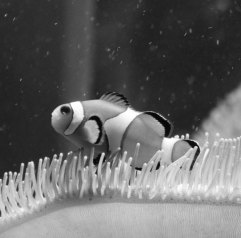

In [9]:
# Load in the clownfish image then convert to grayscale for testing
clownfish = Image.open('images/clownfish.png', 'r')
clownfish_gray = clownfish.convert('L')  # convert to grayscale
clownfish_gray

Define Gabor filters to test out the convolution. Gabor filters are a broad class of kernels, and the following function generates those that approximate the receptive field of certain neurons (**simple cells**) in an area of the brain called primary visual cortex (V1). The equation comes from an analysis of the neurophysiological data by Lee (1996): 

http://leelab.cnbc.cmu.edu/publication/assets/links/ImageRepre.pdf

In [10]:
def gabor(filter_sz_xy, w, theta, K=np.pi):
    ''' Generates a simple cell-like Gabor filter.
    
    Parameters:
    -----------
    filter_sz_xy: tuple. shape=(filter width, filter height)
    w: float. spatial frequency of the filter
    theta: float. Angular direction of the filter in radians
    K: float. Angular phase of the filter in radians
    '''
    rad_x, rad_y = filter_sz_xy
    rad_x, rad_y = int(rad_x/2), int(rad_y/2)
    [x, y] = np.meshgrid(np.arange(-rad_x, rad_x+1), np.arange(-rad_y, rad_y+1))

    x_p = x*np.cos(theta) + y*np.sin(theta)
    y_p = -x*np.sin(theta) + y*np.cos(theta)
    
    # Take the real part of the filter
    gauss = w**2 / (4*np.pi*K**2) * np.exp(-(w**2/(8*K**2)) * (4*x_p**2 + y_p**2))
    sinusoid = np.cos(w*x_p) * np.exp(K**2/2)
    gabor = gauss * sinusoid
    return gabor


def plot_image_panel(imgs):
    fig, axes = plt.subplots(ncols=len(imgs), figsize=(3*len(imgs),6))
    if len(imgs) == 1:
        axes.imshow(imgs[0])
        axes.set_xticks([])
        axes.set_yticks([])
    else:
        for ax, img in zip(axes, imgs):
            ax.imshow(img)
            ax.set_xticks([])
            ax.set_yticks([])
    plt.show()

Plot some Simple cell like Gabor filters

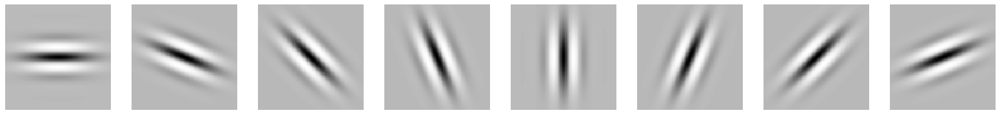

In [11]:
gabor_kers = []
for th in np.arange(-np.pi/2, np.pi/2, np.pi/8):
    gabor_kers.append(gabor(filter_sz_xy=[121, 121], w=0.25, theta=th))
plot_image_panel(gabor_kers)

These filters look nice, but their 121x121 size adds needless computation time (especially just to test your convolution function!).

**TODO:** Write code below that generates 4 Gabor filters that differ span $90^{\circ}$ and $45^{\circ}$ directions with spatial frequency 2 and filter size (21,21). Convert the list to a numpy array (shape = (4, 21, 21)).

Note: the `gabor` function assumes the angles are in radians, not degrees

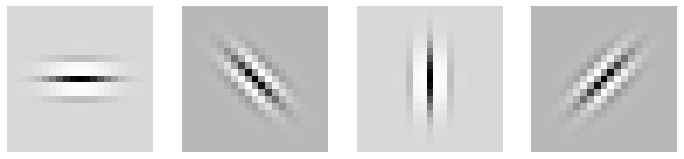

Test kernels have shape (4, 21, 21) and it should be (4, 21, 21)


In [12]:
# Add your code to make the 4 Gabor filters here. Leave the following code to plot them
# convert to ndarray, and print out the expected shape.
gabor_kers = []
for th in np.arange(-np.pi/2, np.pi/2, np.pi/4):
    gabor_kers.append(gabor(filter_sz_xy=[21, 21], w=2, theta=th))

gabor_kers = np.asarray(gabor_kers)

plot_image_panel(gabor_kers)
gabor_kers = np.array(gabor_kers)

print(f'Test kernels have shape {gabor_kers.shape} and it should be (4, 21, 21)')

#### The following code should produce two images that look like the clown fish but on a gray background.

**Question 1:** What is each filter picking up in the image? How does each filter relate the the receptive fields of V1 neurons?

Your filtered clown fish shape is (4, 238, 241) and it should be (4, 238, 241)


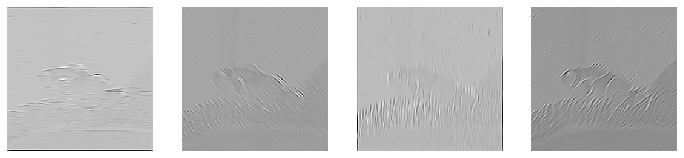

In [13]:
clownfish_gray_np = np.array(clownfish_gray)
clownfish_gray_out = conv2_gray(clownfish_gray_np, gabor_kers)
print(f'Your filtered clown fish shape is {clownfish_gray_out.shape} and it should be (4, 238, 241)')
plot_image_panel(clownfish_gray_out)

### b. Images with RGB color channels

Once you have your grayscale convolution working, copy-and-paste your code into the more general function `conv2`.

The difference with this new function is that the `img` input has a leading dimension for color channel. For example, (3, 200, 200) for a color image and (1, 200, 200) for grayscale. 

It shouldn't take a great deal of work to modify your `conv2_gray` code for this new case. See the function header for some hints.

In [14]:
from filter_ops import conv2

#### Test: Simple box filter

Raw color clown fish image is (3, 238, 241) and should be (3, 238, 241)


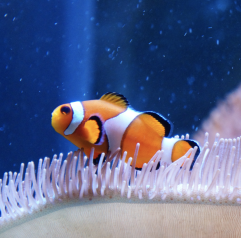

In [15]:
clownfish_np = np.array(clownfish)
clownfish_np = clownfish_np[:,:, :3]  # strip out alpha channel so its just RGB
clownfish_np = np.transpose(clownfish_np, (2, 0, 1))  # permute dims so that channel is leading
print(f'Raw color clown fish image is {clownfish_np.shape} and should be (3, 238, 241)')
clownfish

- **TODO:** Make a 11x11 box filter, with constant, identical positive values normalized so that the entire filter sums to 1.
- **TODO:** Add a leading singleton dimension so shape is (1, 11, 11)

In [16]:
# Add your code for the above TODOs here...
box_ker = np.ones((11, 11))
box_ker = box_ker/np.product(box_ker.shape)

box_ker = box_ker[np.newaxis,:,:]

print(f'Test kernels shape is {box_ker.shape} and should be (1, 11, 11)')
print(f'box ker looks like\n{box_ker}')

Test kernels shape is (1, 11, 11) and should be (1, 11, 11)
box ker looks like
[[[0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]
  [0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008 0.008]]]


In [17]:
clownfish_out = conv2(clownfish_np, box_ker)
print(f'Your filtered clown fish shape is {clownfish_out.shape} and it should be (1, 3, 238, 241)')

Your filtered clown fish shape is (1, 3, 238, 241) and it should be (1, 3, 238, 241)


**TODO**: Visualize output of RGB box filter convolution of clownfish image. In the cell below:

- Convert the convolution output to uint8.
- Permute the dimensions for visualization so that they are: `n_kers, img_y, img_x, n_chans` = (1, 238, 241, 3).
- Visualize using the `plot_image_panel` function, defined above.

If all goes well, you should see a blurrier version of the input image (seemingly smaller because of the way we're plotting it, but the colors should look right).

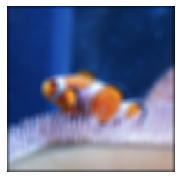

In [18]:
clownfish_out = np.transpose(clownfish_out, (0, 2, 3, 1))
clownfish_out = clownfish_out.astype(np.uint8)
plot_image_panel(clownfish_out)

**Question 2:** Do you notice anything else (other than the blurriness) that is different about this filtered image compared to the original?

#### Test: Gabor filters

Finally, we'll test your color convolution function with the gabor filters

In [19]:
clownfish_out = conv2(clownfish_np, gabor_kers)
print(f'Your filtered clown fish shape is {clownfish_out.shape} and it should be (4, 3, 238, 241)')

Your filtered clown fish shape is (4, 3, 238, 241) and it should be (4, 3, 238, 241)


**TODO**: Visualize output of RGB Gabor filter convolution of clownfish image. In the cell below:

- Normalize the convolution output based on the **dynamic range** of the image (the "CS251 way"). Do this normalization within each RGB channel independently. Using `keepdims` might be useful here too.
- Scale the output to the range 0-255 within each color channel — i.e. the max of each RGB channel should be (255, 255, 255) for (R, G, B). 
- Permute the dimensions for visualization so that they are: `n_kers, img_y, img_x, n_chans`. The ultimate shape after your operations is `(4, 238, 241, 3)`
- Convert the output to uint8.
- Visualize using the `plot_image_panel` function, defined above.

If everything goes well, you should see a similar pattern as in your grayscale filtered images, but now with watercolor/stained glass-like psychedelic colors!

(4, 238, 241, 3)


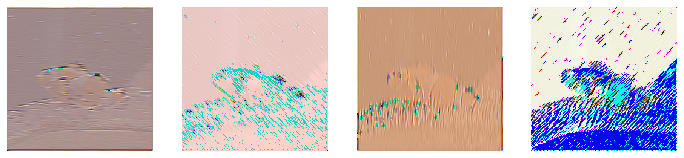

In [20]:


clownfish_out = 255 * (clownfish_out - np.min(clownfish_out, axis=(2,3), keepdims = True))/np.max(clownfish_out, axis=(2,3), keepdims = True)


clownfish_out = np.transpose(clownfish_out, (0, 2, 3, 1))
print(clownfish_out.shape)
clownfish_out = clownfish_out.astype(np.uint8)
plot_image_panel(clownfish_out)

### c. Neural net convolution

Now you're ready to implement the convolution function that we'll use in our convolutional neural network. Copy-and-paste your `conv2` code into `conv2nn` within `filter_ops.py` and make the modifications specified in the docstring.

In [21]:
from filter_ops import conv2nn

#### Test: Multiple images and Gabor filters

This test is simply to pass two copies of the clown fish image to `conv2nn`. The corresponding filtered images should look identical

In [22]:
imgs = np.stack([clownfish_np, clownfish_np])
bias = np.zeros(len(gabor_kers))
print(f'Test img shape is {imgs.shape}')

Test img shape is (2, 3, 238, 241)


In [23]:
# Make a new axis for color channel and replicate the Gabors across that channel so that each RGB channel
# is filtered by the same filters
gabor_kers_chans = np.tile(gabor_kers[:, np.newaxis, :, :], (3, 1, 1, ))
print(f'Test gabor filter shape is {gabor_kers_chans.shape}')

Test gabor filter shape is (4, 3, 21, 21)


Your filtered clown fish shape is (2, 4, 238, 241) and it should be (2, 4, 238, 241)
Your filter maps are identical as expected!


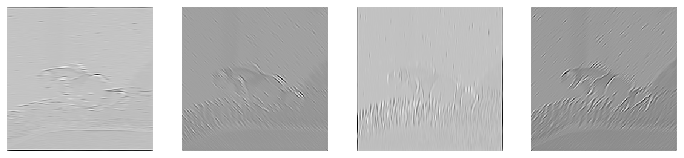

In [24]:
clownfish_imgs_out = conv2nn(imgs, gabor_kers_chans, bias)
print(f'Your filtered clown fish shape is {clownfish_imgs_out.shape} and it should be (2, 4, 238, 241)')
if np.all(clownfish_imgs_out[0] == clownfish_imgs_out[1]):
    print('Your filter maps are identical as expected!')
else:
    print('Your filter maps are not the same :(')

plot_image_panel(clownfish_imgs_out[0])

#### Test: Multiple images and Gabor filters with a different bias term

In [25]:
bias = 10*np.ones(len(gabor_kers_chans))
clownfish_imgs_out = conv2nn(imgs, gabor_kers_chans, bias)
print(f'Your filtered clown fish shape is {clownfish_imgs_out.shape} and it should be (2, 4, 238, 241)')
if np.all(clownfish_imgs_out[0] == clownfish_imgs_out[1]):
    print('Your filter maps are identical as expected!')
else:
    print('Your filter maps are not the same :(')
print(f'(bias test) The minimum value in your filtered images is {clownfish_imgs_out.min():.2f} and it should be -6560.38')

Your filtered clown fish shape is (2, 4, 238, 241) and it should be (2, 4, 238, 241)
Your filter maps are identical as expected!
(bias test) The minimum value in your filtered images is -6560.38 and it should be -6560.38


## Task 2: 2D max pooling

We took care to preserve the spatial dimensions of the input image in our convolution operation. Convolutional networks often have a 'pyramid' shape, where the spatial dimensions reduce in size as you go deeper up the net. This is usually achieved with a pooling operation (usually max, like you will implement here, or mean), which complements the convolution. Convolution and pooling operations are often interdigitated layer-to-layer.

We will implement this function in two stages to help with the debugging.

### a. In `filter_ops.py` implement the `max_pool` function, then run the following test code.

In [26]:
from filter_ops import max_pool

#### Testing: Even checkerboard

In [27]:
# Create simple checkerboard pattern for testing.
# NOTE: We're creating an extra singleton dimension 
grid = np.tile(np.stack([np.array([1, 0]*5), np.array([0, 0]*5)]), (3, 1))
print(f'Image shape is {grid.shape}')
print(f'The checkerboard image looks like\n{grid}')

Image shape is (6, 10)
The checkerboard image looks like
[[1 0 1 0 1 0 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0]
 [1 0 1 0 1 0 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0]
 [1 0 1 0 1 0 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0]]


In [28]:
grid_pooled = max_pool(grid)
print(f'Pooled image shape is {grid_pooled.shape} and it should be (5, 9)')
print(f'Here is your max filtered checkerboard. It should contain all ones:\n{grid_pooled}')

Max pooling: Img of shape (6,10), with a pooling window of 2 and stride of 1 will result in an output of size (5,9)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (1,0)
Output at (0,2) gets info from a max pool with top left at (2,0)
Output at (0,3) gets info from a max pool with top left at (3,0)
Output at (0,4) gets info from a max pool with top left at (4,0)
Output at (0,5) gets info from a max pool with top left at (5,0)
Output at (0,6) gets info from a max pool with top left at (6,0)
Output at (0,7) gets info from a max pool with top left at (7,0)
Output at (0,8) gets info from a max pool with top left at (8,0)
Output at (1,0) gets info from a max pool with top left at (0,1)
Output at (1,1) gets info from a max pool with top left at (1,1)
Output at (1,2) gets info from a max pool with top left at (2,1)
Output at (1,3) gets info from a max pool with top left at (3,1)
Output at (1,4) gets info from a max po

Testing stride:

In [29]:
grid_pooled = max_pool(grid, strides=2)
print(f'Pooled image shape is {grid_pooled.shape} and it should be (3, 5)')
print(f'Here is your max filtered checkerboard. It should contain all ones:\n{grid_pooled}')

Max pooling: Img of shape (6,10), with a pooling window of 2 and stride of 2 will result in an output of size (3,5)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (2,0)
Output at (0,2) gets info from a max pool with top left at (4,0)
Output at (0,3) gets info from a max pool with top left at (6,0)
Output at (0,4) gets info from a max pool with top left at (8,0)
Output at (1,0) gets info from a max pool with top left at (0,2)
Output at (1,1) gets info from a max pool with top left at (2,2)
Output at (1,2) gets info from a max pool with top left at (4,2)
Output at (1,3) gets info from a max pool with top left at (6,2)
Output at (1,4) gets info from a max pool with top left at (8,2)
Output at (2,0) gets info from a max pool with top left at (0,4)
Output at (2,1) gets info from a max pool with top left at (2,4)
Output at (2,2) gets info from a max pool with top left at (4,4)
Output at (2,3) gets info from a max po

#### Testing: Odd checkerboard

In [30]:
# Create simple checkerboard pattern for testing
grid_odd = np.tile(np.stack([np.array([1, 0]*2), np.array([0, 0]*2), np.array([1, 0]*2)]), (3, 1))
print(f'Image shape is {grid_odd.shape}')
print(f'The odd checkerboard image looks like\n{grid_odd}')

Image shape is (9, 4)
The odd checkerboard image looks like
[[1 0 1 0]
 [0 0 0 0]
 [1 0 1 0]
 [1 0 1 0]
 [0 0 0 0]
 [1 0 1 0]
 [1 0 1 0]
 [0 0 0 0]
 [1 0 1 0]]


In [31]:
grid_pooled = max_pool(grid_odd)
print(f'Pooled image shape is {grid_pooled.shape} and it should be (8, 3)')
print('Here is your max filtered checkerboard. It should contain all ones:')
print(f'Here is your odd max filtered checkerboard. It should contain all ones:\n{grid_pooled}')

Max pooling: Img of shape (9,4), with a pooling window of 2 and stride of 1 will result in an output of size (8,3)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (1,0)
Output at (0,2) gets info from a max pool with top left at (2,0)
Output at (1,0) gets info from a max pool with top left at (0,1)
Output at (1,1) gets info from a max pool with top left at (1,1)
Output at (1,2) gets info from a max pool with top left at (2,1)
Output at (2,0) gets info from a max pool with top left at (0,2)
Output at (2,1) gets info from a max pool with top left at (1,2)
Output at (2,2) gets info from a max pool with top left at (2,2)
Output at (3,0) gets info from a max pool with top left at (0,3)
Output at (3,1) gets info from a max pool with top left at (1,3)
Output at (3,2) gets info from a max pool with top left at (2,3)
Output at (4,0) gets info from a max pool with top left at (0,4)
Output at (4,1) gets info from a max poo

Testing stride:

In [32]:
grid_pooled = max_pool(grid_odd, strides=2)
print(f'Pooled image shape is {grid_pooled.shape} and it should be (4, 2)')
print(f'Here is your max filtered checkerboard. It should contain all ones:\n{grid_pooled}')

Max pooling: Img of shape (9,4), with a pooling window of 2 and stride of 2 will result in an output of size (4,2)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (2,0)
Output at (1,0) gets info from a max pool with top left at (0,2)
Output at (1,1) gets info from a max pool with top left at (2,2)
Output at (2,0) gets info from a max pool with top left at (0,4)
Output at (2,1) gets info from a max pool with top left at (2,4)
Output at (3,0) gets info from a max pool with top left at (0,6)
Output at (3,1) gets info from a max pool with top left at (2,6)
Pooled image shape is (4, 2) and it should be (4, 2)
Here is your max filtered checkerboard. It should contain all ones:
[[1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]]


#### Testing: bars

In [33]:
# Create simple bar pattern for testing
bars = np.tile(np.stack([np.array([1]*10), np.array([0]*10), np.array([0]*10), np.array([0]*10)]), (3, 1))
print(f'Image shape is {bars.shape}')
print(f'Here are your bar inputs:\n{bars}')

Image shape is (12, 10)
Here are your bar inputs:
[[1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]


In [34]:
bars_pooled = max_pool(bars)
print(f'Pooled image shape is {bars_pooled.shape} and it should be (11, 9)')
print(f'Here are your max filtered bars:\n{bars_pooled}')

Max pooling: Img of shape (12,10), with a pooling window of 2 and stride of 1 will result in an output of size (11,9)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (1,0)
Output at (0,2) gets info from a max pool with top left at (2,0)
Output at (0,3) gets info from a max pool with top left at (3,0)
Output at (0,4) gets info from a max pool with top left at (4,0)
Output at (0,5) gets info from a max pool with top left at (5,0)
Output at (0,6) gets info from a max pool with top left at (6,0)
Output at (0,7) gets info from a max pool with top left at (7,0)
Output at (0,8) gets info from a max pool with top left at (8,0)
Output at (1,0) gets info from a max pool with top left at (0,1)
Output at (1,1) gets info from a max pool with top left at (1,1)
Output at (1,2) gets info from a max pool with top left at (2,1)
Output at (1,3) gets info from a max pool with top left at (3,1)
Output at (1,4) gets info from a max 

Here is what it should look like:

    [[1. 1. 1. 1. 1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0. 0. 0. 0. 0.]
     [0. 0. 0. 0. 0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1. 1. 1. 1. 1.]
     [1. 1. 1. 1. 1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0. 0. 0. 0. 0.]
     [0. 0. 0. 0. 0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1. 1. 1. 1. 1.]
     [1. 1. 1. 1. 1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0. 0. 0. 0. 0.]
     [0. 0. 0. 0. 0. 0. 0. 0. 0.]]

Testing stride of 2:

In [35]:
bars_pooled = max_pool(bars, strides=2)
print(f'Pooled image shape is {bars_pooled.shape} and it should be (6, 5)')
print(f'Here are your max filtered bars:\n{bars_pooled}')

Max pooling: Img of shape (12,10), with a pooling window of 2 and stride of 2 will result in an output of size (6,5)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (2,0)
Output at (0,2) gets info from a max pool with top left at (4,0)
Output at (0,3) gets info from a max pool with top left at (6,0)
Output at (0,4) gets info from a max pool with top left at (8,0)
Output at (1,0) gets info from a max pool with top left at (0,2)
Output at (1,1) gets info from a max pool with top left at (2,2)
Output at (1,2) gets info from a max pool with top left at (4,2)
Output at (1,3) gets info from a max pool with top left at (6,2)
Output at (1,4) gets info from a max pool with top left at (8,2)
Output at (2,0) gets info from a max pool with top left at (0,4)
Output at (2,1) gets info from a max pool with top left at (2,4)
Output at (2,2) gets info from a max pool with top left at (4,4)
Output at (2,3) gets info from a max p

Here is what it should look like:

    [[1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0.]]

Testing stride of 3:

In [36]:
bars_pooled = max_pool(bars, strides=3)
print(f'Pooled image shape is {bars_pooled.shape} and it should be (4, 3)')
print(f'Here are your max filtered bars:\n{bars_pooled}')

Max pooling: Img of shape (12,10), with a pooling window of 2 and stride of 3 will result in an output of size (4,3)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (3,0)
Output at (0,2) gets info from a max pool with top left at (6,0)
Output at (1,0) gets info from a max pool with top left at (0,3)
Output at (1,1) gets info from a max pool with top left at (3,3)
Output at (1,2) gets info from a max pool with top left at (6,3)
Output at (2,0) gets info from a max pool with top left at (0,6)
Output at (2,1) gets info from a max pool with top left at (3,6)
Output at (2,2) gets info from a max pool with top left at (6,6)
Output at (3,0) gets info from a max pool with top left at (0,9)
Output at (3,1) gets info from a max pool with top left at (3,9)
Output at (3,2) gets info from a max pool with top left at (6,9)
Pooled image shape is (4, 3) and it should be (4, 3)
Here are your max filtered bars:
[[1. 1. 1.]
 [1. 

Here is what it should look like:

    [[1. 1. 1.]
     [1. 1. 1.]
     [0. 0. 0.]
     [0. 0. 0.]]

Testing pooling size of 3:

In [37]:
bars_pooled = max_pool(bars, pool_size=3)
print(f'Pooled image shape is {bars_pooled.shape} and it should be (10, 8)')
print(f'Here are your max filtered bars:\n{bars_pooled}')

Max pooling: Img of shape (12,10), with a pooling window of 3 and stride of 1 will result in an output of size (10,8)
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (1,0)
Output at (0,2) gets info from a max pool with top left at (2,0)
Output at (0,3) gets info from a max pool with top left at (3,0)
Output at (0,4) gets info from a max pool with top left at (4,0)
Output at (0,5) gets info from a max pool with top left at (5,0)
Output at (0,6) gets info from a max pool with top left at (6,0)
Output at (0,7) gets info from a max pool with top left at (7,0)
Output at (1,0) gets info from a max pool with top left at (0,1)
Output at (1,1) gets info from a max pool with top left at (1,1)
Output at (1,2) gets info from a max pool with top left at (2,1)
Output at (1,3) gets info from a max pool with top left at (3,1)
Output at (1,4) gets info from a max pool with top left at (4,1)
Output at (1,5) gets info from a max 

Here is what it should look like:

    [[1. 1. 1. 1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1. 1. 1. 1.]
     [1. 1. 1. 1. 1. 1. 1. 1.]
     [1. 1. 1. 1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1. 1. 1. 1.]
     [1. 1. 1. 1. 1. 1. 1. 1.]
     [1. 1. 1. 1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0. 0. 0. 0.]]

### b. Implement `max_poolnn`

We will add mini-batch and color channel support to your `max_pool` function. Copy-and-paste your code into `max_poolnn` to get started. Check your implementation with the following test code.

In [38]:
from filter_ops import max_poolnn

#### Test: Simple bars

Testing pooling size of 2 and stride 2

In [39]:
# Create simple bar pattern for testing
bars_batch = np.tile(np.stack([np.array([1]*10), np.array([0]*10), np.array([0]*10), np.array([0]*10)]), (1, 1, 3, 1))
print(f'Image shape is {bars_batch.shape}')
print(f'Here are your bar inputs:\n{bars_batch[0,0]}')

Image shape is (1, 1, 12, 10)
Here are your bar inputs:
[[1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]


In [40]:
bars_batch_pooled = max_poolnn(bars_batch, strides=2, pool_size=2)
print(f'Pooled image shape is {bars_batch_pooled.shape} and it should be (1, 1, 6, 5)')
print(f'Here are your max filtered bars:\n{bars_batch_pooled[0,0]}')

Max pooling: Img of shape (12,10), with a pooling window of 2 and stride of 2 will result in an output of size (6,5)
All 1 channels will be preserved
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (2,0)
Output at (0,2) gets info from a max pool with top left at (4,0)
Output at (0,3) gets info from a max pool with top left at (6,0)
Output at (0,4) gets info from a max pool with top left at (8,0)
Output at (1,0) gets info from a max pool with top left at (0,2)
Output at (1,1) gets info from a max pool with top left at (2,2)
Output at (1,2) gets info from a max pool with top left at (4,2)
Output at (1,3) gets info from a max pool with top left at (6,2)
Output at (1,4) gets info from a max pool with top left at (8,2)
Output at (2,0) gets info from a max pool with top left at (0,4)
Output at (2,1) gets info from a max pool with top left at (2,4)
Output at (2,2) gets info from a max pool with top left at (4,4)
Outpu

Here is what it should look like:

    [[1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0.]
     [1. 1. 1. 1. 1.]
     [0. 0. 0. 0. 0.]]

#### Test on real image

Shape of clownfish image is (1, 3, 238, 241)


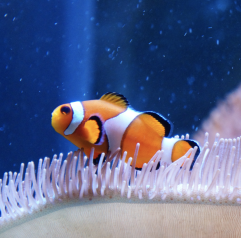

In [41]:
# Load in the clownfish image then convert to grayscale for testing
clownfish = Image.open('images/clownfish.png', 'r')
clownfish_np = np.array(clownfish)
clownfish_np = clownfish_np[:,:, :3]  # strip out alpha channel so its just RGB
clownfish_np = np.transpose(clownfish_np, (2, 0, 1))  # permute dims so that channel is leading
clownfish_np = clownfish_np[np.newaxis, :, :, :]  # add dummy batch dimension
print(f'Shape of clownfish image is {clownfish_np.shape}')
clownfish

In [42]:
img_pooled = max_poolnn(clownfish_np, pool_size=8)
print(f'Pooled image shape is {img_pooled.shape} and it should be (1, 3, 231, 234)')

Max pooling: Img of shape (238,241), with a pooling window of 8 and stride of 1 will result in an output of size (231,234)
All 3 channels will be preserved
Output at (0,0) gets info from a max pool with top left at (0,0)
Output at (0,1) gets info from a max pool with top left at (1,0)
Output at (0,2) gets info from a max pool with top left at (2,0)
Output at (0,3) gets info from a max pool with top left at (3,0)
Output at (0,4) gets info from a max pool with top left at (4,0)
Output at (0,5) gets info from a max pool with top left at (5,0)
Output at (0,6) gets info from a max pool with top left at (6,0)
Output at (0,7) gets info from a max pool with top left at (7,0)
Output at (0,8) gets info from a max pool with top left at (8,0)
Output at (0,9) gets info from a max pool with top left at (9,0)
Output at (0,10) gets info from a max pool with top left at (10,0)
Output at (0,11) gets info from a max pool with top left at (11,0)
Output at (0,12) gets info from a max pool with top left at 

Output at (1,105) gets info from a max pool with top left at (105,1)
Output at (1,106) gets info from a max pool with top left at (106,1)
Output at (1,107) gets info from a max pool with top left at (107,1)
Output at (1,108) gets info from a max pool with top left at (108,1)
Output at (1,109) gets info from a max pool with top left at (109,1)
Output at (1,110) gets info from a max pool with top left at (110,1)
Output at (1,111) gets info from a max pool with top left at (111,1)
Output at (1,112) gets info from a max pool with top left at (112,1)
Output at (1,113) gets info from a max pool with top left at (113,1)
Output at (1,114) gets info from a max pool with top left at (114,1)
Output at (1,115) gets info from a max pool with top left at (115,1)
Output at (1,116) gets info from a max pool with top left at (116,1)
Output at (1,117) gets info from a max pool with top left at (117,1)
Output at (1,118) gets info from a max pool with top left at (118,1)
Output at (1,119) gets info from a

Output at (2,117) gets info from a max pool with top left at (117,2)
Output at (2,118) gets info from a max pool with top left at (118,2)
Output at (2,119) gets info from a max pool with top left at (119,2)
Output at (2,120) gets info from a max pool with top left at (120,2)
Output at (2,121) gets info from a max pool with top left at (121,2)
Output at (2,122) gets info from a max pool with top left at (122,2)
Output at (2,123) gets info from a max pool with top left at (123,2)
Output at (2,124) gets info from a max pool with top left at (124,2)
Output at (2,125) gets info from a max pool with top left at (125,2)
Output at (2,126) gets info from a max pool with top left at (126,2)
Output at (2,127) gets info from a max pool with top left at (127,2)
Output at (2,128) gets info from a max pool with top left at (128,2)
Output at (2,129) gets info from a max pool with top left at (129,2)
Output at (2,130) gets info from a max pool with top left at (130,2)
Output at (2,131) gets info from a

Output at (4,55) gets info from a max pool with top left at (55,4)
Output at (4,56) gets info from a max pool with top left at (56,4)
Output at (4,57) gets info from a max pool with top left at (57,4)
Output at (4,58) gets info from a max pool with top left at (58,4)
Output at (4,59) gets info from a max pool with top left at (59,4)
Output at (4,60) gets info from a max pool with top left at (60,4)
Output at (4,61) gets info from a max pool with top left at (61,4)
Output at (4,62) gets info from a max pool with top left at (62,4)
Output at (4,63) gets info from a max pool with top left at (63,4)
Output at (4,64) gets info from a max pool with top left at (64,4)
Output at (4,65) gets info from a max pool with top left at (65,4)
Output at (4,66) gets info from a max pool with top left at (66,4)
Output at (4,67) gets info from a max pool with top left at (67,4)
Output at (4,68) gets info from a max pool with top left at (68,4)
Output at (4,69) gets info from a max pool with top left at (6

Output at (7,97) gets info from a max pool with top left at (97,7)
Output at (7,98) gets info from a max pool with top left at (98,7)
Output at (7,99) gets info from a max pool with top left at (99,7)
Output at (7,100) gets info from a max pool with top left at (100,7)
Output at (7,101) gets info from a max pool with top left at (101,7)
Output at (7,102) gets info from a max pool with top left at (102,7)
Output at (7,103) gets info from a max pool with top left at (103,7)
Output at (7,104) gets info from a max pool with top left at (104,7)
Output at (7,105) gets info from a max pool with top left at (105,7)
Output at (7,106) gets info from a max pool with top left at (106,7)
Output at (7,107) gets info from a max pool with top left at (107,7)
Output at (7,108) gets info from a max pool with top left at (108,7)
Output at (7,109) gets info from a max pool with top left at (109,7)
Output at (7,110) gets info from a max pool with top left at (110,7)
Output at (7,111) gets info from a max p

Output at (9,105) gets info from a max pool with top left at (105,9)
Output at (9,106) gets info from a max pool with top left at (106,9)
Output at (9,107) gets info from a max pool with top left at (107,9)
Output at (9,108) gets info from a max pool with top left at (108,9)
Output at (9,109) gets info from a max pool with top left at (109,9)
Output at (9,110) gets info from a max pool with top left at (110,9)
Output at (9,111) gets info from a max pool with top left at (111,9)
Output at (9,112) gets info from a max pool with top left at (112,9)
Output at (9,113) gets info from a max pool with top left at (113,9)
Output at (9,114) gets info from a max pool with top left at (114,9)
Output at (9,115) gets info from a max pool with top left at (115,9)
Output at (9,116) gets info from a max pool with top left at (116,9)
Output at (9,117) gets info from a max pool with top left at (117,9)
Output at (9,118) gets info from a max pool with top left at (118,9)
Output at (9,119) gets info from a

Output at (10,195) gets info from a max pool with top left at (195,10)
Output at (10,196) gets info from a max pool with top left at (196,10)
Output at (10,197) gets info from a max pool with top left at (197,10)
Output at (10,198) gets info from a max pool with top left at (198,10)
Output at (10,199) gets info from a max pool with top left at (199,10)
Output at (10,200) gets info from a max pool with top left at (200,10)
Output at (10,201) gets info from a max pool with top left at (201,10)
Output at (10,202) gets info from a max pool with top left at (202,10)
Output at (10,203) gets info from a max pool with top left at (203,10)
Output at (10,204) gets info from a max pool with top left at (204,10)
Output at (10,205) gets info from a max pool with top left at (205,10)
Output at (10,206) gets info from a max pool with top left at (206,10)
Output at (10,207) gets info from a max pool with top left at (207,10)
Output at (10,208) gets info from a max pool with top left at (208,10)
Output

Output at (12,123) gets info from a max pool with top left at (123,12)
Output at (12,124) gets info from a max pool with top left at (124,12)
Output at (12,125) gets info from a max pool with top left at (125,12)
Output at (12,126) gets info from a max pool with top left at (126,12)
Output at (12,127) gets info from a max pool with top left at (127,12)
Output at (12,128) gets info from a max pool with top left at (128,12)
Output at (12,129) gets info from a max pool with top left at (129,12)
Output at (12,130) gets info from a max pool with top left at (130,12)
Output at (12,131) gets info from a max pool with top left at (131,12)
Output at (12,132) gets info from a max pool with top left at (132,12)
Output at (12,133) gets info from a max pool with top left at (133,12)
Output at (12,134) gets info from a max pool with top left at (134,12)
Output at (12,135) gets info from a max pool with top left at (135,12)
Output at (12,136) gets info from a max pool with top left at (136,12)
Output

Output at (16,70) gets info from a max pool with top left at (70,16)
Output at (16,71) gets info from a max pool with top left at (71,16)
Output at (16,72) gets info from a max pool with top left at (72,16)
Output at (16,73) gets info from a max pool with top left at (73,16)
Output at (16,74) gets info from a max pool with top left at (74,16)
Output at (16,75) gets info from a max pool with top left at (75,16)
Output at (16,76) gets info from a max pool with top left at (76,16)
Output at (16,77) gets info from a max pool with top left at (77,16)
Output at (16,78) gets info from a max pool with top left at (78,16)
Output at (16,79) gets info from a max pool with top left at (79,16)
Output at (16,80) gets info from a max pool with top left at (80,16)
Output at (16,81) gets info from a max pool with top left at (81,16)
Output at (16,82) gets info from a max pool with top left at (82,16)
Output at (16,83) gets info from a max pool with top left at (83,16)
Output at (16,84) gets info from a

Output at (18,18) gets info from a max pool with top left at (18,18)
Output at (18,19) gets info from a max pool with top left at (19,18)
Output at (18,20) gets info from a max pool with top left at (20,18)
Output at (18,21) gets info from a max pool with top left at (21,18)
Output at (18,22) gets info from a max pool with top left at (22,18)
Output at (18,23) gets info from a max pool with top left at (23,18)
Output at (18,24) gets info from a max pool with top left at (24,18)
Output at (18,25) gets info from a max pool with top left at (25,18)
Output at (18,26) gets info from a max pool with top left at (26,18)
Output at (18,27) gets info from a max pool with top left at (27,18)
Output at (18,28) gets info from a max pool with top left at (28,18)
Output at (18,29) gets info from a max pool with top left at (29,18)
Output at (18,30) gets info from a max pool with top left at (30,18)
Output at (18,31) gets info from a max pool with top left at (31,18)
Output at (18,32) gets info from a

Output at (19,41) gets info from a max pool with top left at (41,19)
Output at (19,42) gets info from a max pool with top left at (42,19)
Output at (19,43) gets info from a max pool with top left at (43,19)
Output at (19,44) gets info from a max pool with top left at (44,19)
Output at (19,45) gets info from a max pool with top left at (45,19)
Output at (19,46) gets info from a max pool with top left at (46,19)
Output at (19,47) gets info from a max pool with top left at (47,19)
Output at (19,48) gets info from a max pool with top left at (48,19)
Output at (19,49) gets info from a max pool with top left at (49,19)
Output at (19,50) gets info from a max pool with top left at (50,19)
Output at (19,51) gets info from a max pool with top left at (51,19)
Output at (19,52) gets info from a max pool with top left at (52,19)
Output at (19,53) gets info from a max pool with top left at (53,19)
Output at (19,54) gets info from a max pool with top left at (54,19)
Output at (19,55) gets info from a

Output at (21,28) gets info from a max pool with top left at (28,21)
Output at (21,29) gets info from a max pool with top left at (29,21)
Output at (21,30) gets info from a max pool with top left at (30,21)
Output at (21,31) gets info from a max pool with top left at (31,21)
Output at (21,32) gets info from a max pool with top left at (32,21)
Output at (21,33) gets info from a max pool with top left at (33,21)
Output at (21,34) gets info from a max pool with top left at (34,21)
Output at (21,35) gets info from a max pool with top left at (35,21)
Output at (21,36) gets info from a max pool with top left at (36,21)
Output at (21,37) gets info from a max pool with top left at (37,21)
Output at (21,38) gets info from a max pool with top left at (38,21)
Output at (21,39) gets info from a max pool with top left at (39,21)
Output at (21,40) gets info from a max pool with top left at (40,21)
Output at (21,41) gets info from a max pool with top left at (41,21)
Output at (21,42) gets info from a

Output at (24,132) gets info from a max pool with top left at (132,24)
Output at (24,133) gets info from a max pool with top left at (133,24)
Output at (24,134) gets info from a max pool with top left at (134,24)
Output at (24,135) gets info from a max pool with top left at (135,24)
Output at (24,136) gets info from a max pool with top left at (136,24)
Output at (24,137) gets info from a max pool with top left at (137,24)
Output at (24,138) gets info from a max pool with top left at (138,24)
Output at (24,139) gets info from a max pool with top left at (139,24)
Output at (24,140) gets info from a max pool with top left at (140,24)
Output at (24,141) gets info from a max pool with top left at (141,24)
Output at (24,142) gets info from a max pool with top left at (142,24)
Output at (24,143) gets info from a max pool with top left at (143,24)
Output at (24,144) gets info from a max pool with top left at (144,24)
Output at (24,145) gets info from a max pool with top left at (145,24)
Output

Output at (26,151) gets info from a max pool with top left at (151,26)
Output at (26,152) gets info from a max pool with top left at (152,26)
Output at (26,153) gets info from a max pool with top left at (153,26)
Output at (26,154) gets info from a max pool with top left at (154,26)
Output at (26,155) gets info from a max pool with top left at (155,26)
Output at (26,156) gets info from a max pool with top left at (156,26)
Output at (26,157) gets info from a max pool with top left at (157,26)
Output at (26,158) gets info from a max pool with top left at (158,26)
Output at (26,159) gets info from a max pool with top left at (159,26)
Output at (26,160) gets info from a max pool with top left at (160,26)
Output at (26,161) gets info from a max pool with top left at (161,26)
Output at (26,162) gets info from a max pool with top left at (162,26)
Output at (26,163) gets info from a max pool with top left at (163,26)
Output at (26,164) gets info from a max pool with top left at (164,26)
Output

Output at (28,109) gets info from a max pool with top left at (109,28)
Output at (28,110) gets info from a max pool with top left at (110,28)
Output at (28,111) gets info from a max pool with top left at (111,28)
Output at (28,112) gets info from a max pool with top left at (112,28)
Output at (28,113) gets info from a max pool with top left at (113,28)
Output at (28,114) gets info from a max pool with top left at (114,28)
Output at (28,115) gets info from a max pool with top left at (115,28)
Output at (28,116) gets info from a max pool with top left at (116,28)
Output at (28,117) gets info from a max pool with top left at (117,28)
Output at (28,118) gets info from a max pool with top left at (118,28)
Output at (28,119) gets info from a max pool with top left at (119,28)
Output at (28,120) gets info from a max pool with top left at (120,28)
Output at (28,121) gets info from a max pool with top left at (121,28)
Output at (28,122) gets info from a max pool with top left at (122,28)
Output

Output at (29,162) gets info from a max pool with top left at (162,29)
Output at (29,163) gets info from a max pool with top left at (163,29)
Output at (29,164) gets info from a max pool with top left at (164,29)
Output at (29,165) gets info from a max pool with top left at (165,29)
Output at (29,166) gets info from a max pool with top left at (166,29)
Output at (29,167) gets info from a max pool with top left at (167,29)
Output at (29,168) gets info from a max pool with top left at (168,29)
Output at (29,169) gets info from a max pool with top left at (169,29)
Output at (29,170) gets info from a max pool with top left at (170,29)
Output at (29,171) gets info from a max pool with top left at (171,29)
Output at (29,172) gets info from a max pool with top left at (172,29)
Output at (29,173) gets info from a max pool with top left at (173,29)
Output at (29,174) gets info from a max pool with top left at (174,29)
Output at (29,175) gets info from a max pool with top left at (175,29)
Output

Output at (34,36) gets info from a max pool with top left at (36,34)
Output at (34,37) gets info from a max pool with top left at (37,34)
Output at (34,38) gets info from a max pool with top left at (38,34)
Output at (34,39) gets info from a max pool with top left at (39,34)
Output at (34,40) gets info from a max pool with top left at (40,34)
Output at (34,41) gets info from a max pool with top left at (41,34)
Output at (34,42) gets info from a max pool with top left at (42,34)
Output at (34,43) gets info from a max pool with top left at (43,34)
Output at (34,44) gets info from a max pool with top left at (44,34)
Output at (34,45) gets info from a max pool with top left at (45,34)
Output at (34,46) gets info from a max pool with top left at (46,34)
Output at (34,47) gets info from a max pool with top left at (47,34)
Output at (34,48) gets info from a max pool with top left at (48,34)
Output at (34,49) gets info from a max pool with top left at (49,34)
Output at (34,50) gets info from a

Output at (34,211) gets info from a max pool with top left at (211,34)
Output at (34,212) gets info from a max pool with top left at (212,34)
Output at (34,213) gets info from a max pool with top left at (213,34)
Output at (34,214) gets info from a max pool with top left at (214,34)
Output at (34,215) gets info from a max pool with top left at (215,34)
Output at (34,216) gets info from a max pool with top left at (216,34)
Output at (34,217) gets info from a max pool with top left at (217,34)
Output at (34,218) gets info from a max pool with top left at (218,34)
Output at (34,219) gets info from a max pool with top left at (219,34)
Output at (34,220) gets info from a max pool with top left at (220,34)
Output at (34,221) gets info from a max pool with top left at (221,34)
Output at (34,222) gets info from a max pool with top left at (222,34)
Output at (34,223) gets info from a max pool with top left at (223,34)
Output at (34,224) gets info from a max pool with top left at (224,34)
Output

Output at (36,25) gets info from a max pool with top left at (25,36)
Output at (36,26) gets info from a max pool with top left at (26,36)
Output at (36,27) gets info from a max pool with top left at (27,36)
Output at (36,28) gets info from a max pool with top left at (28,36)
Output at (36,29) gets info from a max pool with top left at (29,36)
Output at (36,30) gets info from a max pool with top left at (30,36)
Output at (36,31) gets info from a max pool with top left at (31,36)
Output at (36,32) gets info from a max pool with top left at (32,36)
Output at (36,33) gets info from a max pool with top left at (33,36)
Output at (36,34) gets info from a max pool with top left at (34,36)
Output at (36,35) gets info from a max pool with top left at (35,36)
Output at (36,36) gets info from a max pool with top left at (36,36)
Output at (36,37) gets info from a max pool with top left at (37,36)
Output at (36,38) gets info from a max pool with top left at (38,36)
Output at (36,39) gets info from a

Output at (37,109) gets info from a max pool with top left at (109,37)
Output at (37,110) gets info from a max pool with top left at (110,37)
Output at (37,111) gets info from a max pool with top left at (111,37)
Output at (37,112) gets info from a max pool with top left at (112,37)
Output at (37,113) gets info from a max pool with top left at (113,37)
Output at (37,114) gets info from a max pool with top left at (114,37)
Output at (37,115) gets info from a max pool with top left at (115,37)
Output at (37,116) gets info from a max pool with top left at (116,37)
Output at (37,117) gets info from a max pool with top left at (117,37)
Output at (37,118) gets info from a max pool with top left at (118,37)
Output at (37,119) gets info from a max pool with top left at (119,37)
Output at (37,120) gets info from a max pool with top left at (120,37)
Output at (37,121) gets info from a max pool with top left at (121,37)
Output at (37,122) gets info from a max pool with top left at (122,37)
Output

Output at (41,27) gets info from a max pool with top left at (27,41)
Output at (41,28) gets info from a max pool with top left at (28,41)
Output at (41,29) gets info from a max pool with top left at (29,41)
Output at (41,30) gets info from a max pool with top left at (30,41)
Output at (41,31) gets info from a max pool with top left at (31,41)
Output at (41,32) gets info from a max pool with top left at (32,41)
Output at (41,33) gets info from a max pool with top left at (33,41)
Output at (41,34) gets info from a max pool with top left at (34,41)
Output at (41,35) gets info from a max pool with top left at (35,41)
Output at (41,36) gets info from a max pool with top left at (36,41)
Output at (41,37) gets info from a max pool with top left at (37,41)
Output at (41,38) gets info from a max pool with top left at (38,41)
Output at (41,39) gets info from a max pool with top left at (39,41)
Output at (41,40) gets info from a max pool with top left at (40,41)
Output at (41,41) gets info from a

Output at (43,14) gets info from a max pool with top left at (14,43)
Output at (43,15) gets info from a max pool with top left at (15,43)
Output at (43,16) gets info from a max pool with top left at (16,43)
Output at (43,17) gets info from a max pool with top left at (17,43)
Output at (43,18) gets info from a max pool with top left at (18,43)
Output at (43,19) gets info from a max pool with top left at (19,43)
Output at (43,20) gets info from a max pool with top left at (20,43)
Output at (43,21) gets info from a max pool with top left at (21,43)
Output at (43,22) gets info from a max pool with top left at (22,43)
Output at (43,23) gets info from a max pool with top left at (23,43)
Output at (43,24) gets info from a max pool with top left at (24,43)
Output at (43,25) gets info from a max pool with top left at (25,43)
Output at (43,26) gets info from a max pool with top left at (26,43)
Output at (43,27) gets info from a max pool with top left at (27,43)
Output at (43,28) gets info from a

Output at (44,70) gets info from a max pool with top left at (70,44)
Output at (44,71) gets info from a max pool with top left at (71,44)
Output at (44,72) gets info from a max pool with top left at (72,44)
Output at (44,73) gets info from a max pool with top left at (73,44)
Output at (44,74) gets info from a max pool with top left at (74,44)
Output at (44,75) gets info from a max pool with top left at (75,44)
Output at (44,76) gets info from a max pool with top left at (76,44)
Output at (44,77) gets info from a max pool with top left at (77,44)
Output at (44,78) gets info from a max pool with top left at (78,44)
Output at (44,79) gets info from a max pool with top left at (79,44)
Output at (44,80) gets info from a max pool with top left at (80,44)
Output at (44,81) gets info from a max pool with top left at (81,44)
Output at (44,82) gets info from a max pool with top left at (82,44)
Output at (44,83) gets info from a max pool with top left at (83,44)
Output at (44,84) gets info from a

Output at (45,158) gets info from a max pool with top left at (158,45)
Output at (45,159) gets info from a max pool with top left at (159,45)
Output at (45,160) gets info from a max pool with top left at (160,45)
Output at (45,161) gets info from a max pool with top left at (161,45)
Output at (45,162) gets info from a max pool with top left at (162,45)
Output at (45,163) gets info from a max pool with top left at (163,45)
Output at (45,164) gets info from a max pool with top left at (164,45)
Output at (45,165) gets info from a max pool with top left at (165,45)
Output at (45,166) gets info from a max pool with top left at (166,45)
Output at (45,167) gets info from a max pool with top left at (167,45)
Output at (45,168) gets info from a max pool with top left at (168,45)
Output at (45,169) gets info from a max pool with top left at (169,45)
Output at (45,170) gets info from a max pool with top left at (170,45)
Output at (45,171) gets info from a max pool with top left at (171,45)
Output

Output at (49,41) gets info from a max pool with top left at (41,49)
Output at (49,42) gets info from a max pool with top left at (42,49)
Output at (49,43) gets info from a max pool with top left at (43,49)
Output at (49,44) gets info from a max pool with top left at (44,49)
Output at (49,45) gets info from a max pool with top left at (45,49)
Output at (49,46) gets info from a max pool with top left at (46,49)
Output at (49,47) gets info from a max pool with top left at (47,49)
Output at (49,48) gets info from a max pool with top left at (48,49)
Output at (49,49) gets info from a max pool with top left at (49,49)
Output at (49,50) gets info from a max pool with top left at (50,49)
Output at (49,51) gets info from a max pool with top left at (51,49)
Output at (49,52) gets info from a max pool with top left at (52,49)
Output at (49,53) gets info from a max pool with top left at (53,49)
Output at (49,54) gets info from a max pool with top left at (54,49)
Output at (49,55) gets info from a

Output at (51,3) gets info from a max pool with top left at (3,51)
Output at (51,4) gets info from a max pool with top left at (4,51)
Output at (51,5) gets info from a max pool with top left at (5,51)
Output at (51,6) gets info from a max pool with top left at (6,51)
Output at (51,7) gets info from a max pool with top left at (7,51)
Output at (51,8) gets info from a max pool with top left at (8,51)
Output at (51,9) gets info from a max pool with top left at (9,51)
Output at (51,10) gets info from a max pool with top left at (10,51)
Output at (51,11) gets info from a max pool with top left at (11,51)
Output at (51,12) gets info from a max pool with top left at (12,51)
Output at (51,13) gets info from a max pool with top left at (13,51)
Output at (51,14) gets info from a max pool with top left at (14,51)
Output at (51,15) gets info from a max pool with top left at (15,51)
Output at (51,16) gets info from a max pool with top left at (16,51)
Output at (51,17) gets info from a max pool with

Output at (52,41) gets info from a max pool with top left at (41,52)
Output at (52,42) gets info from a max pool with top left at (42,52)
Output at (52,43) gets info from a max pool with top left at (43,52)
Output at (52,44) gets info from a max pool with top left at (44,52)
Output at (52,45) gets info from a max pool with top left at (45,52)
Output at (52,46) gets info from a max pool with top left at (46,52)
Output at (52,47) gets info from a max pool with top left at (47,52)
Output at (52,48) gets info from a max pool with top left at (48,52)
Output at (52,49) gets info from a max pool with top left at (49,52)
Output at (52,50) gets info from a max pool with top left at (50,52)
Output at (52,51) gets info from a max pool with top left at (51,52)
Output at (52,52) gets info from a max pool with top left at (52,52)
Output at (52,53) gets info from a max pool with top left at (53,52)
Output at (52,54) gets info from a max pool with top left at (54,52)
Output at (52,55) gets info from a

Output at (53,166) gets info from a max pool with top left at (166,53)
Output at (53,167) gets info from a max pool with top left at (167,53)
Output at (53,168) gets info from a max pool with top left at (168,53)
Output at (53,169) gets info from a max pool with top left at (169,53)
Output at (53,170) gets info from a max pool with top left at (170,53)
Output at (53,171) gets info from a max pool with top left at (171,53)
Output at (53,172) gets info from a max pool with top left at (172,53)
Output at (53,173) gets info from a max pool with top left at (173,53)
Output at (53,174) gets info from a max pool with top left at (174,53)
Output at (53,175) gets info from a max pool with top left at (175,53)
Output at (53,176) gets info from a max pool with top left at (176,53)
Output at (53,177) gets info from a max pool with top left at (177,53)
Output at (53,178) gets info from a max pool with top left at (178,53)
Output at (53,179) gets info from a max pool with top left at (179,53)
Output

Output at (58,76) gets info from a max pool with top left at (76,58)
Output at (58,77) gets info from a max pool with top left at (77,58)
Output at (58,78) gets info from a max pool with top left at (78,58)
Output at (58,79) gets info from a max pool with top left at (79,58)
Output at (58,80) gets info from a max pool with top left at (80,58)
Output at (58,81) gets info from a max pool with top left at (81,58)
Output at (58,82) gets info from a max pool with top left at (82,58)
Output at (58,83) gets info from a max pool with top left at (83,58)
Output at (58,84) gets info from a max pool with top left at (84,58)
Output at (58,85) gets info from a max pool with top left at (85,58)
Output at (58,86) gets info from a max pool with top left at (86,58)
Output at (58,87) gets info from a max pool with top left at (87,58)
Output at (58,88) gets info from a max pool with top left at (88,58)
Output at (58,89) gets info from a max pool with top left at (89,58)
Output at (58,90) gets info from a

Output at (59,138) gets info from a max pool with top left at (138,59)
Output at (59,139) gets info from a max pool with top left at (139,59)
Output at (59,140) gets info from a max pool with top left at (140,59)
Output at (59,141) gets info from a max pool with top left at (141,59)
Output at (59,142) gets info from a max pool with top left at (142,59)
Output at (59,143) gets info from a max pool with top left at (143,59)
Output at (59,144) gets info from a max pool with top left at (144,59)
Output at (59,145) gets info from a max pool with top left at (145,59)
Output at (59,146) gets info from a max pool with top left at (146,59)
Output at (59,147) gets info from a max pool with top left at (147,59)
Output at (59,148) gets info from a max pool with top left at (148,59)
Output at (59,149) gets info from a max pool with top left at (149,59)
Output at (59,150) gets info from a max pool with top left at (150,59)
Output at (59,151) gets info from a max pool with top left at (151,59)
Output

Output at (60,148) gets info from a max pool with top left at (148,60)
Output at (60,149) gets info from a max pool with top left at (149,60)
Output at (60,150) gets info from a max pool with top left at (150,60)
Output at (60,151) gets info from a max pool with top left at (151,60)
Output at (60,152) gets info from a max pool with top left at (152,60)
Output at (60,153) gets info from a max pool with top left at (153,60)
Output at (60,154) gets info from a max pool with top left at (154,60)
Output at (60,155) gets info from a max pool with top left at (155,60)
Output at (60,156) gets info from a max pool with top left at (156,60)
Output at (60,157) gets info from a max pool with top left at (157,60)
Output at (60,158) gets info from a max pool with top left at (158,60)
Output at (60,159) gets info from a max pool with top left at (159,60)
Output at (60,160) gets info from a max pool with top left at (160,60)
Output at (60,161) gets info from a max pool with top left at (161,60)
Output

Output at (62,35) gets info from a max pool with top left at (35,62)
Output at (62,36) gets info from a max pool with top left at (36,62)
Output at (62,37) gets info from a max pool with top left at (37,62)
Output at (62,38) gets info from a max pool with top left at (38,62)
Output at (62,39) gets info from a max pool with top left at (39,62)
Output at (62,40) gets info from a max pool with top left at (40,62)
Output at (62,41) gets info from a max pool with top left at (41,62)
Output at (62,42) gets info from a max pool with top left at (42,62)
Output at (62,43) gets info from a max pool with top left at (43,62)
Output at (62,44) gets info from a max pool with top left at (44,62)
Output at (62,45) gets info from a max pool with top left at (45,62)
Output at (62,46) gets info from a max pool with top left at (46,62)
Output at (62,47) gets info from a max pool with top left at (47,62)
Output at (62,48) gets info from a max pool with top left at (48,62)
Output at (62,49) gets info from a

Output at (65,204) gets info from a max pool with top left at (204,65)
Output at (65,205) gets info from a max pool with top left at (205,65)
Output at (65,206) gets info from a max pool with top left at (206,65)
Output at (65,207) gets info from a max pool with top left at (207,65)
Output at (65,208) gets info from a max pool with top left at (208,65)
Output at (65,209) gets info from a max pool with top left at (209,65)
Output at (65,210) gets info from a max pool with top left at (210,65)
Output at (65,211) gets info from a max pool with top left at (211,65)
Output at (65,212) gets info from a max pool with top left at (212,65)
Output at (65,213) gets info from a max pool with top left at (213,65)
Output at (65,214) gets info from a max pool with top left at (214,65)
Output at (65,215) gets info from a max pool with top left at (215,65)
Output at (65,216) gets info from a max pool with top left at (216,65)
Output at (65,217) gets info from a max pool with top left at (217,65)
Output

Output at (67,160) gets info from a max pool with top left at (160,67)
Output at (67,161) gets info from a max pool with top left at (161,67)
Output at (67,162) gets info from a max pool with top left at (162,67)
Output at (67,163) gets info from a max pool with top left at (163,67)
Output at (67,164) gets info from a max pool with top left at (164,67)
Output at (67,165) gets info from a max pool with top left at (165,67)
Output at (67,166) gets info from a max pool with top left at (166,67)
Output at (67,167) gets info from a max pool with top left at (167,67)
Output at (67,168) gets info from a max pool with top left at (168,67)
Output at (67,169) gets info from a max pool with top left at (169,67)
Output at (67,170) gets info from a max pool with top left at (170,67)
Output at (67,171) gets info from a max pool with top left at (171,67)
Output at (67,172) gets info from a max pool with top left at (172,67)
Output at (67,173) gets info from a max pool with top left at (173,67)
Output

Output at (69,8) gets info from a max pool with top left at (8,69)
Output at (69,9) gets info from a max pool with top left at (9,69)
Output at (69,10) gets info from a max pool with top left at (10,69)
Output at (69,11) gets info from a max pool with top left at (11,69)
Output at (69,12) gets info from a max pool with top left at (12,69)
Output at (69,13) gets info from a max pool with top left at (13,69)
Output at (69,14) gets info from a max pool with top left at (14,69)
Output at (69,15) gets info from a max pool with top left at (15,69)
Output at (69,16) gets info from a max pool with top left at (16,69)
Output at (69,17) gets info from a max pool with top left at (17,69)
Output at (69,18) gets info from a max pool with top left at (18,69)
Output at (69,19) gets info from a max pool with top left at (19,69)
Output at (69,20) gets info from a max pool with top left at (20,69)
Output at (69,21) gets info from a max pool with top left at (21,69)
Output at (69,22) gets info from a max

Output at (70,174) gets info from a max pool with top left at (174,70)
Output at (70,175) gets info from a max pool with top left at (175,70)
Output at (70,176) gets info from a max pool with top left at (176,70)
Output at (70,177) gets info from a max pool with top left at (177,70)
Output at (70,178) gets info from a max pool with top left at (178,70)
Output at (70,179) gets info from a max pool with top left at (179,70)
Output at (70,180) gets info from a max pool with top left at (180,70)
Output at (70,181) gets info from a max pool with top left at (181,70)
Output at (70,182) gets info from a max pool with top left at (182,70)
Output at (70,183) gets info from a max pool with top left at (183,70)
Output at (70,184) gets info from a max pool with top left at (184,70)
Output at (70,185) gets info from a max pool with top left at (185,70)
Output at (70,186) gets info from a max pool with top left at (186,70)
Output at (70,187) gets info from a max pool with top left at (187,70)
Output

Output at (74,21) gets info from a max pool with top left at (21,74)
Output at (74,22) gets info from a max pool with top left at (22,74)
Output at (74,23) gets info from a max pool with top left at (23,74)
Output at (74,24) gets info from a max pool with top left at (24,74)
Output at (74,25) gets info from a max pool with top left at (25,74)
Output at (74,26) gets info from a max pool with top left at (26,74)
Output at (74,27) gets info from a max pool with top left at (27,74)
Output at (74,28) gets info from a max pool with top left at (28,74)
Output at (74,29) gets info from a max pool with top left at (29,74)
Output at (74,30) gets info from a max pool with top left at (30,74)
Output at (74,31) gets info from a max pool with top left at (31,74)
Output at (74,32) gets info from a max pool with top left at (32,74)
Output at (74,33) gets info from a max pool with top left at (33,74)
Output at (74,34) gets info from a max pool with top left at (34,74)
Output at (74,35) gets info from a

Output at (75,211) gets info from a max pool with top left at (211,75)
Output at (75,212) gets info from a max pool with top left at (212,75)
Output at (75,213) gets info from a max pool with top left at (213,75)
Output at (75,214) gets info from a max pool with top left at (214,75)
Output at (75,215) gets info from a max pool with top left at (215,75)
Output at (75,216) gets info from a max pool with top left at (216,75)
Output at (75,217) gets info from a max pool with top left at (217,75)
Output at (75,218) gets info from a max pool with top left at (218,75)
Output at (75,219) gets info from a max pool with top left at (219,75)
Output at (75,220) gets info from a max pool with top left at (220,75)
Output at (75,221) gets info from a max pool with top left at (221,75)
Output at (75,222) gets info from a max pool with top left at (222,75)
Output at (75,223) gets info from a max pool with top left at (223,75)
Output at (75,224) gets info from a max pool with top left at (224,75)
Output

Output at (77,46) gets info from a max pool with top left at (46,77)
Output at (77,47) gets info from a max pool with top left at (47,77)
Output at (77,48) gets info from a max pool with top left at (48,77)
Output at (77,49) gets info from a max pool with top left at (49,77)
Output at (77,50) gets info from a max pool with top left at (50,77)
Output at (77,51) gets info from a max pool with top left at (51,77)
Output at (77,52) gets info from a max pool with top left at (52,77)
Output at (77,53) gets info from a max pool with top left at (53,77)
Output at (77,54) gets info from a max pool with top left at (54,77)
Output at (77,55) gets info from a max pool with top left at (55,77)
Output at (77,56) gets info from a max pool with top left at (56,77)
Output at (77,57) gets info from a max pool with top left at (57,77)
Output at (77,58) gets info from a max pool with top left at (58,77)
Output at (77,59) gets info from a max pool with top left at (59,77)
Output at (77,60) gets info from a

Output at (78,148) gets info from a max pool with top left at (148,78)
Output at (78,149) gets info from a max pool with top left at (149,78)
Output at (78,150) gets info from a max pool with top left at (150,78)
Output at (78,151) gets info from a max pool with top left at (151,78)
Output at (78,152) gets info from a max pool with top left at (152,78)
Output at (78,153) gets info from a max pool with top left at (153,78)
Output at (78,154) gets info from a max pool with top left at (154,78)
Output at (78,155) gets info from a max pool with top left at (155,78)
Output at (78,156) gets info from a max pool with top left at (156,78)
Output at (78,157) gets info from a max pool with top left at (157,78)
Output at (78,158) gets info from a max pool with top left at (158,78)
Output at (78,159) gets info from a max pool with top left at (159,78)
Output at (78,160) gets info from a max pool with top left at (160,78)
Output at (78,161) gets info from a max pool with top left at (161,78)
Output

Output at (81,131) gets info from a max pool with top left at (131,81)
Output at (81,132) gets info from a max pool with top left at (132,81)
Output at (81,133) gets info from a max pool with top left at (133,81)
Output at (81,134) gets info from a max pool with top left at (134,81)
Output at (81,135) gets info from a max pool with top left at (135,81)
Output at (81,136) gets info from a max pool with top left at (136,81)
Output at (81,137) gets info from a max pool with top left at (137,81)
Output at (81,138) gets info from a max pool with top left at (138,81)
Output at (81,139) gets info from a max pool with top left at (139,81)
Output at (81,140) gets info from a max pool with top left at (140,81)
Output at (81,141) gets info from a max pool with top left at (141,81)
Output at (81,142) gets info from a max pool with top left at (142,81)
Output at (81,143) gets info from a max pool with top left at (143,81)
Output at (81,144) gets info from a max pool with top left at (144,81)
Output

Output at (83,166) gets info from a max pool with top left at (166,83)
Output at (83,167) gets info from a max pool with top left at (167,83)
Output at (83,168) gets info from a max pool with top left at (168,83)
Output at (83,169) gets info from a max pool with top left at (169,83)
Output at (83,170) gets info from a max pool with top left at (170,83)
Output at (83,171) gets info from a max pool with top left at (171,83)
Output at (83,172) gets info from a max pool with top left at (172,83)
Output at (83,173) gets info from a max pool with top left at (173,83)
Output at (83,174) gets info from a max pool with top left at (174,83)
Output at (83,175) gets info from a max pool with top left at (175,83)
Output at (83,176) gets info from a max pool with top left at (176,83)
Output at (83,177) gets info from a max pool with top left at (177,83)
Output at (83,178) gets info from a max pool with top left at (178,83)
Output at (83,179) gets info from a max pool with top left at (179,83)
Output

Output at (85,60) gets info from a max pool with top left at (60,85)
Output at (85,61) gets info from a max pool with top left at (61,85)
Output at (85,62) gets info from a max pool with top left at (62,85)
Output at (85,63) gets info from a max pool with top left at (63,85)
Output at (85,64) gets info from a max pool with top left at (64,85)
Output at (85,65) gets info from a max pool with top left at (65,85)
Output at (85,66) gets info from a max pool with top left at (66,85)
Output at (85,67) gets info from a max pool with top left at (67,85)
Output at (85,68) gets info from a max pool with top left at (68,85)
Output at (85,69) gets info from a max pool with top left at (69,85)
Output at (85,70) gets info from a max pool with top left at (70,85)
Output at (85,71) gets info from a max pool with top left at (71,85)
Output at (85,72) gets info from a max pool with top left at (72,85)
Output at (85,73) gets info from a max pool with top left at (73,85)
Output at (85,74) gets info from a

Output at (86,146) gets info from a max pool with top left at (146,86)
Output at (86,147) gets info from a max pool with top left at (147,86)
Output at (86,148) gets info from a max pool with top left at (148,86)
Output at (86,149) gets info from a max pool with top left at (149,86)
Output at (86,150) gets info from a max pool with top left at (150,86)
Output at (86,151) gets info from a max pool with top left at (151,86)
Output at (86,152) gets info from a max pool with top left at (152,86)
Output at (86,153) gets info from a max pool with top left at (153,86)
Output at (86,154) gets info from a max pool with top left at (154,86)
Output at (86,155) gets info from a max pool with top left at (155,86)
Output at (86,156) gets info from a max pool with top left at (156,86)
Output at (86,157) gets info from a max pool with top left at (157,86)
Output at (86,158) gets info from a max pool with top left at (158,86)
Output at (86,159) gets info from a max pool with top left at (159,86)
Output

Output at (90,23) gets info from a max pool with top left at (23,90)
Output at (90,24) gets info from a max pool with top left at (24,90)
Output at (90,25) gets info from a max pool with top left at (25,90)
Output at (90,26) gets info from a max pool with top left at (26,90)
Output at (90,27) gets info from a max pool with top left at (27,90)
Output at (90,28) gets info from a max pool with top left at (28,90)
Output at (90,29) gets info from a max pool with top left at (29,90)
Output at (90,30) gets info from a max pool with top left at (30,90)
Output at (90,31) gets info from a max pool with top left at (31,90)
Output at (90,32) gets info from a max pool with top left at (32,90)
Output at (90,33) gets info from a max pool with top left at (33,90)
Output at (90,34) gets info from a max pool with top left at (34,90)
Output at (90,35) gets info from a max pool with top left at (35,90)
Output at (90,36) gets info from a max pool with top left at (36,90)
Output at (90,37) gets info from a

Output at (92,37) gets info from a max pool with top left at (37,92)
Output at (92,38) gets info from a max pool with top left at (38,92)
Output at (92,39) gets info from a max pool with top left at (39,92)
Output at (92,40) gets info from a max pool with top left at (40,92)
Output at (92,41) gets info from a max pool with top left at (41,92)
Output at (92,42) gets info from a max pool with top left at (42,92)
Output at (92,43) gets info from a max pool with top left at (43,92)
Output at (92,44) gets info from a max pool with top left at (44,92)
Output at (92,45) gets info from a max pool with top left at (45,92)
Output at (92,46) gets info from a max pool with top left at (46,92)
Output at (92,47) gets info from a max pool with top left at (47,92)
Output at (92,48) gets info from a max pool with top left at (48,92)
Output at (92,49) gets info from a max pool with top left at (49,92)
Output at (92,50) gets info from a max pool with top left at (50,92)
Output at (92,51) gets info from a

Output at (93,105) gets info from a max pool with top left at (105,93)
Output at (93,106) gets info from a max pool with top left at (106,93)
Output at (93,107) gets info from a max pool with top left at (107,93)
Output at (93,108) gets info from a max pool with top left at (108,93)
Output at (93,109) gets info from a max pool with top left at (109,93)
Output at (93,110) gets info from a max pool with top left at (110,93)
Output at (93,111) gets info from a max pool with top left at (111,93)
Output at (93,112) gets info from a max pool with top left at (112,93)
Output at (93,113) gets info from a max pool with top left at (113,93)
Output at (93,114) gets info from a max pool with top left at (114,93)
Output at (93,115) gets info from a max pool with top left at (115,93)
Output at (93,116) gets info from a max pool with top left at (116,93)
Output at (93,117) gets info from a max pool with top left at (117,93)
Output at (93,118) gets info from a max pool with top left at (118,93)
Output

Output at (94,215) gets info from a max pool with top left at (215,94)
Output at (94,216) gets info from a max pool with top left at (216,94)
Output at (94,217) gets info from a max pool with top left at (217,94)
Output at (94,218) gets info from a max pool with top left at (218,94)
Output at (94,219) gets info from a max pool with top left at (219,94)
Output at (94,220) gets info from a max pool with top left at (220,94)
Output at (94,221) gets info from a max pool with top left at (221,94)
Output at (94,222) gets info from a max pool with top left at (222,94)
Output at (94,223) gets info from a max pool with top left at (223,94)
Output at (94,224) gets info from a max pool with top left at (224,94)
Output at (94,225) gets info from a max pool with top left at (225,94)
Output at (94,226) gets info from a max pool with top left at (226,94)
Output at (94,227) gets info from a max pool with top left at (227,94)
Output at (94,228) gets info from a max pool with top left at (228,94)
Output

Output at (98,43) gets info from a max pool with top left at (43,98)
Output at (98,44) gets info from a max pool with top left at (44,98)
Output at (98,45) gets info from a max pool with top left at (45,98)
Output at (98,46) gets info from a max pool with top left at (46,98)
Output at (98,47) gets info from a max pool with top left at (47,98)
Output at (98,48) gets info from a max pool with top left at (48,98)
Output at (98,49) gets info from a max pool with top left at (49,98)
Output at (98,50) gets info from a max pool with top left at (50,98)
Output at (98,51) gets info from a max pool with top left at (51,98)
Output at (98,52) gets info from a max pool with top left at (52,98)
Output at (98,53) gets info from a max pool with top left at (53,98)
Output at (98,54) gets info from a max pool with top left at (54,98)
Output at (98,55) gets info from a max pool with top left at (55,98)
Output at (98,56) gets info from a max pool with top left at (56,98)
Output at (98,57) gets info from a

Output at (100,86) gets info from a max pool with top left at (86,100)
Output at (100,87) gets info from a max pool with top left at (87,100)
Output at (100,88) gets info from a max pool with top left at (88,100)
Output at (100,89) gets info from a max pool with top left at (89,100)
Output at (100,90) gets info from a max pool with top left at (90,100)
Output at (100,91) gets info from a max pool with top left at (91,100)
Output at (100,92) gets info from a max pool with top left at (92,100)
Output at (100,93) gets info from a max pool with top left at (93,100)
Output at (100,94) gets info from a max pool with top left at (94,100)
Output at (100,95) gets info from a max pool with top left at (95,100)
Output at (100,96) gets info from a max pool with top left at (96,100)
Output at (100,97) gets info from a max pool with top left at (97,100)
Output at (100,98) gets info from a max pool with top left at (98,100)
Output at (100,99) gets info from a max pool with top left at (99,100)
Output

Output at (101,190) gets info from a max pool with top left at (190,101)
Output at (101,191) gets info from a max pool with top left at (191,101)
Output at (101,192) gets info from a max pool with top left at (192,101)
Output at (101,193) gets info from a max pool with top left at (193,101)
Output at (101,194) gets info from a max pool with top left at (194,101)
Output at (101,195) gets info from a max pool with top left at (195,101)
Output at (101,196) gets info from a max pool with top left at (196,101)
Output at (101,197) gets info from a max pool with top left at (197,101)
Output at (101,198) gets info from a max pool with top left at (198,101)
Output at (101,199) gets info from a max pool with top left at (199,101)
Output at (101,200) gets info from a max pool with top left at (200,101)
Output at (101,201) gets info from a max pool with top left at (201,101)
Output at (101,202) gets info from a max pool with top left at (202,101)
Output at (101,203) gets info from a max pool with 

Output at (103,12) gets info from a max pool with top left at (12,103)
Output at (103,13) gets info from a max pool with top left at (13,103)
Output at (103,14) gets info from a max pool with top left at (14,103)
Output at (103,15) gets info from a max pool with top left at (15,103)
Output at (103,16) gets info from a max pool with top left at (16,103)
Output at (103,17) gets info from a max pool with top left at (17,103)
Output at (103,18) gets info from a max pool with top left at (18,103)
Output at (103,19) gets info from a max pool with top left at (19,103)
Output at (103,20) gets info from a max pool with top left at (20,103)
Output at (103,21) gets info from a max pool with top left at (21,103)
Output at (103,22) gets info from a max pool with top left at (22,103)
Output at (103,23) gets info from a max pool with top left at (23,103)
Output at (103,24) gets info from a max pool with top left at (24,103)
Output at (103,25) gets info from a max pool with top left at (25,103)
Output

Output at (106,70) gets info from a max pool with top left at (70,106)
Output at (106,71) gets info from a max pool with top left at (71,106)
Output at (106,72) gets info from a max pool with top left at (72,106)
Output at (106,73) gets info from a max pool with top left at (73,106)
Output at (106,74) gets info from a max pool with top left at (74,106)
Output at (106,75) gets info from a max pool with top left at (75,106)
Output at (106,76) gets info from a max pool with top left at (76,106)
Output at (106,77) gets info from a max pool with top left at (77,106)
Output at (106,78) gets info from a max pool with top left at (78,106)
Output at (106,79) gets info from a max pool with top left at (79,106)
Output at (106,80) gets info from a max pool with top left at (80,106)
Output at (106,81) gets info from a max pool with top left at (81,106)
Output at (106,82) gets info from a max pool with top left at (82,106)
Output at (106,83) gets info from a max pool with top left at (83,106)
Output

Output at (108,71) gets info from a max pool with top left at (71,108)
Output at (108,72) gets info from a max pool with top left at (72,108)
Output at (108,73) gets info from a max pool with top left at (73,108)
Output at (108,74) gets info from a max pool with top left at (74,108)
Output at (108,75) gets info from a max pool with top left at (75,108)
Output at (108,76) gets info from a max pool with top left at (76,108)
Output at (108,77) gets info from a max pool with top left at (77,108)
Output at (108,78) gets info from a max pool with top left at (78,108)
Output at (108,79) gets info from a max pool with top left at (79,108)
Output at (108,80) gets info from a max pool with top left at (80,108)
Output at (108,81) gets info from a max pool with top left at (81,108)
Output at (108,82) gets info from a max pool with top left at (82,108)
Output at (108,83) gets info from a max pool with top left at (83,108)
Output at (108,84) gets info from a max pool with top left at (84,108)
Output

Output at (109,185) gets info from a max pool with top left at (185,109)
Output at (109,186) gets info from a max pool with top left at (186,109)
Output at (109,187) gets info from a max pool with top left at (187,109)
Output at (109,188) gets info from a max pool with top left at (188,109)
Output at (109,189) gets info from a max pool with top left at (189,109)
Output at (109,190) gets info from a max pool with top left at (190,109)
Output at (109,191) gets info from a max pool with top left at (191,109)
Output at (109,192) gets info from a max pool with top left at (192,109)
Output at (109,193) gets info from a max pool with top left at (193,109)
Output at (109,194) gets info from a max pool with top left at (194,109)
Output at (109,195) gets info from a max pool with top left at (195,109)
Output at (109,196) gets info from a max pool with top left at (196,109)
Output at (109,197) gets info from a max pool with top left at (197,109)
Output at (109,198) gets info from a max pool with 

Output at (111,105) gets info from a max pool with top left at (105,111)
Output at (111,106) gets info from a max pool with top left at (106,111)
Output at (111,107) gets info from a max pool with top left at (107,111)
Output at (111,108) gets info from a max pool with top left at (108,111)
Output at (111,109) gets info from a max pool with top left at (109,111)
Output at (111,110) gets info from a max pool with top left at (110,111)
Output at (111,111) gets info from a max pool with top left at (111,111)
Output at (111,112) gets info from a max pool with top left at (112,111)
Output at (111,113) gets info from a max pool with top left at (113,111)
Output at (111,114) gets info from a max pool with top left at (114,111)
Output at (111,115) gets info from a max pool with top left at (115,111)
Output at (111,116) gets info from a max pool with top left at (116,111)
Output at (111,117) gets info from a max pool with top left at (117,111)
Output at (111,118) gets info from a max pool with 

Output at (113,229) gets info from a max pool with top left at (229,113)
Output at (113,230) gets info from a max pool with top left at (230,113)
Output at (113,231) gets info from a max pool with top left at (231,113)
Output at (113,232) gets info from a max pool with top left at (232,113)
Output at (113,233) gets info from a max pool with top left at (233,113)
Output at (114,0) gets info from a max pool with top left at (0,114)
Output at (114,1) gets info from a max pool with top left at (1,114)
Output at (114,2) gets info from a max pool with top left at (2,114)
Output at (114,3) gets info from a max pool with top left at (3,114)
Output at (114,4) gets info from a max pool with top left at (4,114)
Output at (114,5) gets info from a max pool with top left at (5,114)
Output at (114,6) gets info from a max pool with top left at (6,114)
Output at (114,7) gets info from a max pool with top left at (7,114)
Output at (114,8) gets info from a max pool with top left at (8,114)
Output at (114

Output at (115,228) gets info from a max pool with top left at (228,115)
Output at (115,229) gets info from a max pool with top left at (229,115)
Output at (115,230) gets info from a max pool with top left at (230,115)
Output at (115,231) gets info from a max pool with top left at (231,115)
Output at (115,232) gets info from a max pool with top left at (232,115)
Output at (115,233) gets info from a max pool with top left at (233,115)
Output at (116,0) gets info from a max pool with top left at (0,116)
Output at (116,1) gets info from a max pool with top left at (1,116)
Output at (116,2) gets info from a max pool with top left at (2,116)
Output at (116,3) gets info from a max pool with top left at (3,116)
Output at (116,4) gets info from a max pool with top left at (4,116)
Output at (116,5) gets info from a max pool with top left at (5,116)
Output at (116,6) gets info from a max pool with top left at (6,116)
Output at (116,7) gets info from a max pool with top left at (7,116)
Output at 

Output at (117,168) gets info from a max pool with top left at (168,117)
Output at (117,169) gets info from a max pool with top left at (169,117)
Output at (117,170) gets info from a max pool with top left at (170,117)
Output at (117,171) gets info from a max pool with top left at (171,117)
Output at (117,172) gets info from a max pool with top left at (172,117)
Output at (117,173) gets info from a max pool with top left at (173,117)
Output at (117,174) gets info from a max pool with top left at (174,117)
Output at (117,175) gets info from a max pool with top left at (175,117)
Output at (117,176) gets info from a max pool with top left at (176,117)
Output at (117,177) gets info from a max pool with top left at (177,117)
Output at (117,178) gets info from a max pool with top left at (178,117)
Output at (117,179) gets info from a max pool with top left at (179,117)
Output at (117,180) gets info from a max pool with top left at (180,117)
Output at (117,181) gets info from a max pool with 

Output at (119,31) gets info from a max pool with top left at (31,119)
Output at (119,32) gets info from a max pool with top left at (32,119)
Output at (119,33) gets info from a max pool with top left at (33,119)
Output at (119,34) gets info from a max pool with top left at (34,119)
Output at (119,35) gets info from a max pool with top left at (35,119)
Output at (119,36) gets info from a max pool with top left at (36,119)
Output at (119,37) gets info from a max pool with top left at (37,119)
Output at (119,38) gets info from a max pool with top left at (38,119)
Output at (119,39) gets info from a max pool with top left at (39,119)
Output at (119,40) gets info from a max pool with top left at (40,119)
Output at (119,41) gets info from a max pool with top left at (41,119)
Output at (119,42) gets info from a max pool with top left at (42,119)
Output at (119,43) gets info from a max pool with top left at (43,119)
Output at (119,44) gets info from a max pool with top left at (44,119)
Output

Output at (123,32) gets info from a max pool with top left at (32,123)
Output at (123,33) gets info from a max pool with top left at (33,123)
Output at (123,34) gets info from a max pool with top left at (34,123)
Output at (123,35) gets info from a max pool with top left at (35,123)
Output at (123,36) gets info from a max pool with top left at (36,123)
Output at (123,37) gets info from a max pool with top left at (37,123)
Output at (123,38) gets info from a max pool with top left at (38,123)
Output at (123,39) gets info from a max pool with top left at (39,123)
Output at (123,40) gets info from a max pool with top left at (40,123)
Output at (123,41) gets info from a max pool with top left at (41,123)
Output at (123,42) gets info from a max pool with top left at (42,123)
Output at (123,43) gets info from a max pool with top left at (43,123)
Output at (123,44) gets info from a max pool with top left at (44,123)
Output at (123,45) gets info from a max pool with top left at (45,123)
Output

Output at (124,126) gets info from a max pool with top left at (126,124)
Output at (124,127) gets info from a max pool with top left at (127,124)
Output at (124,128) gets info from a max pool with top left at (128,124)
Output at (124,129) gets info from a max pool with top left at (129,124)
Output at (124,130) gets info from a max pool with top left at (130,124)
Output at (124,131) gets info from a max pool with top left at (131,124)
Output at (124,132) gets info from a max pool with top left at (132,124)
Output at (124,133) gets info from a max pool with top left at (133,124)
Output at (124,134) gets info from a max pool with top left at (134,124)
Output at (124,135) gets info from a max pool with top left at (135,124)
Output at (124,136) gets info from a max pool with top left at (136,124)
Output at (124,137) gets info from a max pool with top left at (137,124)
Output at (124,138) gets info from a max pool with top left at (138,124)
Output at (124,139) gets info from a max pool with 

Output at (126,100) gets info from a max pool with top left at (100,126)
Output at (126,101) gets info from a max pool with top left at (101,126)
Output at (126,102) gets info from a max pool with top left at (102,126)
Output at (126,103) gets info from a max pool with top left at (103,126)
Output at (126,104) gets info from a max pool with top left at (104,126)
Output at (126,105) gets info from a max pool with top left at (105,126)
Output at (126,106) gets info from a max pool with top left at (106,126)
Output at (126,107) gets info from a max pool with top left at (107,126)
Output at (126,108) gets info from a max pool with top left at (108,126)
Output at (126,109) gets info from a max pool with top left at (109,126)
Output at (126,110) gets info from a max pool with top left at (110,126)
Output at (126,111) gets info from a max pool with top left at (111,126)
Output at (126,112) gets info from a max pool with top left at (112,126)
Output at (126,113) gets info from a max pool with 

Output at (127,147) gets info from a max pool with top left at (147,127)
Output at (127,148) gets info from a max pool with top left at (148,127)
Output at (127,149) gets info from a max pool with top left at (149,127)
Output at (127,150) gets info from a max pool with top left at (150,127)
Output at (127,151) gets info from a max pool with top left at (151,127)
Output at (127,152) gets info from a max pool with top left at (152,127)
Output at (127,153) gets info from a max pool with top left at (153,127)
Output at (127,154) gets info from a max pool with top left at (154,127)
Output at (127,155) gets info from a max pool with top left at (155,127)
Output at (127,156) gets info from a max pool with top left at (156,127)
Output at (127,157) gets info from a max pool with top left at (157,127)
Output at (127,158) gets info from a max pool with top left at (158,127)
Output at (127,159) gets info from a max pool with top left at (159,127)
Output at (127,160) gets info from a max pool with 

Output at (130,156) gets info from a max pool with top left at (156,130)
Output at (130,157) gets info from a max pool with top left at (157,130)
Output at (130,158) gets info from a max pool with top left at (158,130)
Output at (130,159) gets info from a max pool with top left at (159,130)
Output at (130,160) gets info from a max pool with top left at (160,130)
Output at (130,161) gets info from a max pool with top left at (161,130)
Output at (130,162) gets info from a max pool with top left at (162,130)
Output at (130,163) gets info from a max pool with top left at (163,130)
Output at (130,164) gets info from a max pool with top left at (164,130)
Output at (130,165) gets info from a max pool with top left at (165,130)
Output at (130,166) gets info from a max pool with top left at (166,130)
Output at (130,167) gets info from a max pool with top left at (167,130)
Output at (130,168) gets info from a max pool with top left at (168,130)
Output at (130,169) gets info from a max pool with 

Output at (132,11) gets info from a max pool with top left at (11,132)
Output at (132,12) gets info from a max pool with top left at (12,132)
Output at (132,13) gets info from a max pool with top left at (13,132)
Output at (132,14) gets info from a max pool with top left at (14,132)
Output at (132,15) gets info from a max pool with top left at (15,132)
Output at (132,16) gets info from a max pool with top left at (16,132)
Output at (132,17) gets info from a max pool with top left at (17,132)
Output at (132,18) gets info from a max pool with top left at (18,132)
Output at (132,19) gets info from a max pool with top left at (19,132)
Output at (132,20) gets info from a max pool with top left at (20,132)
Output at (132,21) gets info from a max pool with top left at (21,132)
Output at (132,22) gets info from a max pool with top left at (22,132)
Output at (132,23) gets info from a max pool with top left at (23,132)
Output at (132,24) gets info from a max pool with top left at (24,132)
Output

Output at (133,163) gets info from a max pool with top left at (163,133)
Output at (133,164) gets info from a max pool with top left at (164,133)
Output at (133,165) gets info from a max pool with top left at (165,133)
Output at (133,166) gets info from a max pool with top left at (166,133)
Output at (133,167) gets info from a max pool with top left at (167,133)
Output at (133,168) gets info from a max pool with top left at (168,133)
Output at (133,169) gets info from a max pool with top left at (169,133)
Output at (133,170) gets info from a max pool with top left at (170,133)
Output at (133,171) gets info from a max pool with top left at (171,133)
Output at (133,172) gets info from a max pool with top left at (172,133)
Output at (133,173) gets info from a max pool with top left at (173,133)
Output at (133,174) gets info from a max pool with top left at (174,133)
Output at (133,175) gets info from a max pool with top left at (175,133)
Output at (133,176) gets info from a max pool with 

Output at (135,117) gets info from a max pool with top left at (117,135)
Output at (135,118) gets info from a max pool with top left at (118,135)
Output at (135,119) gets info from a max pool with top left at (119,135)
Output at (135,120) gets info from a max pool with top left at (120,135)
Output at (135,121) gets info from a max pool with top left at (121,135)
Output at (135,122) gets info from a max pool with top left at (122,135)
Output at (135,123) gets info from a max pool with top left at (123,135)
Output at (135,124) gets info from a max pool with top left at (124,135)
Output at (135,125) gets info from a max pool with top left at (125,135)
Output at (135,126) gets info from a max pool with top left at (126,135)
Output at (135,127) gets info from a max pool with top left at (127,135)
Output at (135,128) gets info from a max pool with top left at (128,135)
Output at (135,129) gets info from a max pool with top left at (129,135)
Output at (135,130) gets info from a max pool with 

Output at (138,84) gets info from a max pool with top left at (84,138)
Output at (138,85) gets info from a max pool with top left at (85,138)
Output at (138,86) gets info from a max pool with top left at (86,138)
Output at (138,87) gets info from a max pool with top left at (87,138)
Output at (138,88) gets info from a max pool with top left at (88,138)
Output at (138,89) gets info from a max pool with top left at (89,138)
Output at (138,90) gets info from a max pool with top left at (90,138)
Output at (138,91) gets info from a max pool with top left at (91,138)
Output at (138,92) gets info from a max pool with top left at (92,138)
Output at (138,93) gets info from a max pool with top left at (93,138)
Output at (138,94) gets info from a max pool with top left at (94,138)
Output at (138,95) gets info from a max pool with top left at (95,138)
Output at (138,96) gets info from a max pool with top left at (96,138)
Output at (138,97) gets info from a max pool with top left at (97,138)
Output

Output at (140,155) gets info from a max pool with top left at (155,140)
Output at (140,156) gets info from a max pool with top left at (156,140)
Output at (140,157) gets info from a max pool with top left at (157,140)
Output at (140,158) gets info from a max pool with top left at (158,140)
Output at (140,159) gets info from a max pool with top left at (159,140)
Output at (140,160) gets info from a max pool with top left at (160,140)
Output at (140,161) gets info from a max pool with top left at (161,140)
Output at (140,162) gets info from a max pool with top left at (162,140)
Output at (140,163) gets info from a max pool with top left at (163,140)
Output at (140,164) gets info from a max pool with top left at (164,140)
Output at (140,165) gets info from a max pool with top left at (165,140)
Output at (140,166) gets info from a max pool with top left at (166,140)
Output at (140,167) gets info from a max pool with top left at (167,140)
Output at (140,168) gets info from a max pool with 

Output at (142,11) gets info from a max pool with top left at (11,142)
Output at (142,12) gets info from a max pool with top left at (12,142)
Output at (142,13) gets info from a max pool with top left at (13,142)
Output at (142,14) gets info from a max pool with top left at (14,142)
Output at (142,15) gets info from a max pool with top left at (15,142)
Output at (142,16) gets info from a max pool with top left at (16,142)
Output at (142,17) gets info from a max pool with top left at (17,142)
Output at (142,18) gets info from a max pool with top left at (18,142)
Output at (142,19) gets info from a max pool with top left at (19,142)
Output at (142,20) gets info from a max pool with top left at (20,142)
Output at (142,21) gets info from a max pool with top left at (21,142)
Output at (142,22) gets info from a max pool with top left at (22,142)
Output at (142,23) gets info from a max pool with top left at (23,142)
Output at (142,24) gets info from a max pool with top left at (24,142)
Output

Output at (143,147) gets info from a max pool with top left at (147,143)
Output at (143,148) gets info from a max pool with top left at (148,143)
Output at (143,149) gets info from a max pool with top left at (149,143)
Output at (143,150) gets info from a max pool with top left at (150,143)
Output at (143,151) gets info from a max pool with top left at (151,143)
Output at (143,152) gets info from a max pool with top left at (152,143)
Output at (143,153) gets info from a max pool with top left at (153,143)
Output at (143,154) gets info from a max pool with top left at (154,143)
Output at (143,155) gets info from a max pool with top left at (155,143)
Output at (143,156) gets info from a max pool with top left at (156,143)
Output at (143,157) gets info from a max pool with top left at (157,143)
Output at (143,158) gets info from a max pool with top left at (158,143)
Output at (143,159) gets info from a max pool with top left at (159,143)
Output at (143,160) gets info from a max pool with 

Output at (146,125) gets info from a max pool with top left at (125,146)
Output at (146,126) gets info from a max pool with top left at (126,146)
Output at (146,127) gets info from a max pool with top left at (127,146)
Output at (146,128) gets info from a max pool with top left at (128,146)
Output at (146,129) gets info from a max pool with top left at (129,146)
Output at (146,130) gets info from a max pool with top left at (130,146)
Output at (146,131) gets info from a max pool with top left at (131,146)
Output at (146,132) gets info from a max pool with top left at (132,146)
Output at (146,133) gets info from a max pool with top left at (133,146)
Output at (146,134) gets info from a max pool with top left at (134,146)
Output at (146,135) gets info from a max pool with top left at (135,146)
Output at (146,136) gets info from a max pool with top left at (136,146)
Output at (146,137) gets info from a max pool with top left at (137,146)
Output at (146,138) gets info from a max pool with 

Output at (148,188) gets info from a max pool with top left at (188,148)
Output at (148,189) gets info from a max pool with top left at (189,148)
Output at (148,190) gets info from a max pool with top left at (190,148)
Output at (148,191) gets info from a max pool with top left at (191,148)
Output at (148,192) gets info from a max pool with top left at (192,148)
Output at (148,193) gets info from a max pool with top left at (193,148)
Output at (148,194) gets info from a max pool with top left at (194,148)
Output at (148,195) gets info from a max pool with top left at (195,148)
Output at (148,196) gets info from a max pool with top left at (196,148)
Output at (148,197) gets info from a max pool with top left at (197,148)
Output at (148,198) gets info from a max pool with top left at (198,148)
Output at (148,199) gets info from a max pool with top left at (199,148)
Output at (148,200) gets info from a max pool with top left at (200,148)
Output at (148,201) gets info from a max pool with 

Output at (150,107) gets info from a max pool with top left at (107,150)
Output at (150,108) gets info from a max pool with top left at (108,150)
Output at (150,109) gets info from a max pool with top left at (109,150)
Output at (150,110) gets info from a max pool with top left at (110,150)
Output at (150,111) gets info from a max pool with top left at (111,150)
Output at (150,112) gets info from a max pool with top left at (112,150)
Output at (150,113) gets info from a max pool with top left at (113,150)
Output at (150,114) gets info from a max pool with top left at (114,150)
Output at (150,115) gets info from a max pool with top left at (115,150)
Output at (150,116) gets info from a max pool with top left at (116,150)
Output at (150,117) gets info from a max pool with top left at (117,150)
Output at (150,118) gets info from a max pool with top left at (118,150)
Output at (150,119) gets info from a max pool with top left at (119,150)
Output at (150,120) gets info from a max pool with 

Output at (152,10) gets info from a max pool with top left at (10,152)
Output at (152,11) gets info from a max pool with top left at (11,152)
Output at (152,12) gets info from a max pool with top left at (12,152)
Output at (152,13) gets info from a max pool with top left at (13,152)
Output at (152,14) gets info from a max pool with top left at (14,152)
Output at (152,15) gets info from a max pool with top left at (15,152)
Output at (152,16) gets info from a max pool with top left at (16,152)
Output at (152,17) gets info from a max pool with top left at (17,152)
Output at (152,18) gets info from a max pool with top left at (18,152)
Output at (152,19) gets info from a max pool with top left at (19,152)
Output at (152,20) gets info from a max pool with top left at (20,152)
Output at (152,21) gets info from a max pool with top left at (21,152)
Output at (152,22) gets info from a max pool with top left at (22,152)
Output at (152,23) gets info from a max pool with top left at (23,152)
Output

Output at (155,34) gets info from a max pool with top left at (34,155)
Output at (155,35) gets info from a max pool with top left at (35,155)
Output at (155,36) gets info from a max pool with top left at (36,155)
Output at (155,37) gets info from a max pool with top left at (37,155)
Output at (155,38) gets info from a max pool with top left at (38,155)
Output at (155,39) gets info from a max pool with top left at (39,155)
Output at (155,40) gets info from a max pool with top left at (40,155)
Output at (155,41) gets info from a max pool with top left at (41,155)
Output at (155,42) gets info from a max pool with top left at (42,155)
Output at (155,43) gets info from a max pool with top left at (43,155)
Output at (155,44) gets info from a max pool with top left at (44,155)
Output at (155,45) gets info from a max pool with top left at (45,155)
Output at (155,46) gets info from a max pool with top left at (46,155)
Output at (155,47) gets info from a max pool with top left at (47,155)
Output

Output at (156,168) gets info from a max pool with top left at (168,156)
Output at (156,169) gets info from a max pool with top left at (169,156)
Output at (156,170) gets info from a max pool with top left at (170,156)
Output at (156,171) gets info from a max pool with top left at (171,156)
Output at (156,172) gets info from a max pool with top left at (172,156)
Output at (156,173) gets info from a max pool with top left at (173,156)
Output at (156,174) gets info from a max pool with top left at (174,156)
Output at (156,175) gets info from a max pool with top left at (175,156)
Output at (156,176) gets info from a max pool with top left at (176,156)
Output at (156,177) gets info from a max pool with top left at (177,156)
Output at (156,178) gets info from a max pool with top left at (178,156)
Output at (156,179) gets info from a max pool with top left at (179,156)
Output at (156,180) gets info from a max pool with top left at (180,156)
Output at (156,181) gets info from a max pool with 

Output at (158,157) gets info from a max pool with top left at (157,158)
Output at (158,158) gets info from a max pool with top left at (158,158)
Output at (158,159) gets info from a max pool with top left at (159,158)
Output at (158,160) gets info from a max pool with top left at (160,158)
Output at (158,161) gets info from a max pool with top left at (161,158)
Output at (158,162) gets info from a max pool with top left at (162,158)
Output at (158,163) gets info from a max pool with top left at (163,158)
Output at (158,164) gets info from a max pool with top left at (164,158)
Output at (158,165) gets info from a max pool with top left at (165,158)
Output at (158,166) gets info from a max pool with top left at (166,158)
Output at (158,167) gets info from a max pool with top left at (167,158)
Output at (158,168) gets info from a max pool with top left at (168,158)
Output at (158,169) gets info from a max pool with top left at (169,158)
Output at (158,170) gets info from a max pool with 

Output at (160,10) gets info from a max pool with top left at (10,160)
Output at (160,11) gets info from a max pool with top left at (11,160)
Output at (160,12) gets info from a max pool with top left at (12,160)
Output at (160,13) gets info from a max pool with top left at (13,160)
Output at (160,14) gets info from a max pool with top left at (14,160)
Output at (160,15) gets info from a max pool with top left at (15,160)
Output at (160,16) gets info from a max pool with top left at (16,160)
Output at (160,17) gets info from a max pool with top left at (17,160)
Output at (160,18) gets info from a max pool with top left at (18,160)
Output at (160,19) gets info from a max pool with top left at (19,160)
Output at (160,20) gets info from a max pool with top left at (20,160)
Output at (160,21) gets info from a max pool with top left at (21,160)
Output at (160,22) gets info from a max pool with top left at (22,160)
Output at (160,23) gets info from a max pool with top left at (23,160)
Output

Output at (163,62) gets info from a max pool with top left at (62,163)
Output at (163,63) gets info from a max pool with top left at (63,163)
Output at (163,64) gets info from a max pool with top left at (64,163)
Output at (163,65) gets info from a max pool with top left at (65,163)
Output at (163,66) gets info from a max pool with top left at (66,163)
Output at (163,67) gets info from a max pool with top left at (67,163)
Output at (163,68) gets info from a max pool with top left at (68,163)
Output at (163,69) gets info from a max pool with top left at (69,163)
Output at (163,70) gets info from a max pool with top left at (70,163)
Output at (163,71) gets info from a max pool with top left at (71,163)
Output at (163,72) gets info from a max pool with top left at (72,163)
Output at (163,73) gets info from a max pool with top left at (73,163)
Output at (163,74) gets info from a max pool with top left at (74,163)
Output at (163,75) gets info from a max pool with top left at (75,163)
Output

Output at (165,12) gets info from a max pool with top left at (12,165)
Output at (165,13) gets info from a max pool with top left at (13,165)
Output at (165,14) gets info from a max pool with top left at (14,165)
Output at (165,15) gets info from a max pool with top left at (15,165)
Output at (165,16) gets info from a max pool with top left at (16,165)
Output at (165,17) gets info from a max pool with top left at (17,165)
Output at (165,18) gets info from a max pool with top left at (18,165)
Output at (165,19) gets info from a max pool with top left at (19,165)
Output at (165,20) gets info from a max pool with top left at (20,165)
Output at (165,21) gets info from a max pool with top left at (21,165)
Output at (165,22) gets info from a max pool with top left at (22,165)
Output at (165,23) gets info from a max pool with top left at (23,165)
Output at (165,24) gets info from a max pool with top left at (24,165)
Output at (165,25) gets info from a max pool with top left at (25,165)
Output

Output at (167,1) gets info from a max pool with top left at (1,167)
Output at (167,2) gets info from a max pool with top left at (2,167)
Output at (167,3) gets info from a max pool with top left at (3,167)
Output at (167,4) gets info from a max pool with top left at (4,167)
Output at (167,5) gets info from a max pool with top left at (5,167)
Output at (167,6) gets info from a max pool with top left at (6,167)
Output at (167,7) gets info from a max pool with top left at (7,167)
Output at (167,8) gets info from a max pool with top left at (8,167)
Output at (167,9) gets info from a max pool with top left at (9,167)
Output at (167,10) gets info from a max pool with top left at (10,167)
Output at (167,11) gets info from a max pool with top left at (11,167)
Output at (167,12) gets info from a max pool with top left at (12,167)
Output at (167,13) gets info from a max pool with top left at (13,167)
Output at (167,14) gets info from a max pool with top left at (14,167)
Output at (167,15) gets 

Output at (168,46) gets info from a max pool with top left at (46,168)
Output at (168,47) gets info from a max pool with top left at (47,168)
Output at (168,48) gets info from a max pool with top left at (48,168)
Output at (168,49) gets info from a max pool with top left at (49,168)
Output at (168,50) gets info from a max pool with top left at (50,168)
Output at (168,51) gets info from a max pool with top left at (51,168)
Output at (168,52) gets info from a max pool with top left at (52,168)
Output at (168,53) gets info from a max pool with top left at (53,168)
Output at (168,54) gets info from a max pool with top left at (54,168)
Output at (168,55) gets info from a max pool with top left at (55,168)
Output at (168,56) gets info from a max pool with top left at (56,168)
Output at (168,57) gets info from a max pool with top left at (57,168)
Output at (168,58) gets info from a max pool with top left at (58,168)
Output at (168,59) gets info from a max pool with top left at (59,168)
Output

Output at (171,158) gets info from a max pool with top left at (158,171)
Output at (171,159) gets info from a max pool with top left at (159,171)
Output at (171,160) gets info from a max pool with top left at (160,171)
Output at (171,161) gets info from a max pool with top left at (161,171)
Output at (171,162) gets info from a max pool with top left at (162,171)
Output at (171,163) gets info from a max pool with top left at (163,171)
Output at (171,164) gets info from a max pool with top left at (164,171)
Output at (171,165) gets info from a max pool with top left at (165,171)
Output at (171,166) gets info from a max pool with top left at (166,171)
Output at (171,167) gets info from a max pool with top left at (167,171)
Output at (171,168) gets info from a max pool with top left at (168,171)
Output at (171,169) gets info from a max pool with top left at (169,171)
Output at (171,170) gets info from a max pool with top left at (170,171)
Output at (171,171) gets info from a max pool with 

Output at (173,103) gets info from a max pool with top left at (103,173)
Output at (173,104) gets info from a max pool with top left at (104,173)
Output at (173,105) gets info from a max pool with top left at (105,173)
Output at (173,106) gets info from a max pool with top left at (106,173)
Output at (173,107) gets info from a max pool with top left at (107,173)
Output at (173,108) gets info from a max pool with top left at (108,173)
Output at (173,109) gets info from a max pool with top left at (109,173)
Output at (173,110) gets info from a max pool with top left at (110,173)
Output at (173,111) gets info from a max pool with top left at (111,173)
Output at (173,112) gets info from a max pool with top left at (112,173)
Output at (173,113) gets info from a max pool with top left at (113,173)
Output at (173,114) gets info from a max pool with top left at (114,173)
Output at (173,115) gets info from a max pool with top left at (115,173)
Output at (173,116) gets info from a max pool with 

Output at (175,84) gets info from a max pool with top left at (84,175)
Output at (175,85) gets info from a max pool with top left at (85,175)
Output at (175,86) gets info from a max pool with top left at (86,175)
Output at (175,87) gets info from a max pool with top left at (87,175)
Output at (175,88) gets info from a max pool with top left at (88,175)
Output at (175,89) gets info from a max pool with top left at (89,175)
Output at (175,90) gets info from a max pool with top left at (90,175)
Output at (175,91) gets info from a max pool with top left at (91,175)
Output at (175,92) gets info from a max pool with top left at (92,175)
Output at (175,93) gets info from a max pool with top left at (93,175)
Output at (175,94) gets info from a max pool with top left at (94,175)
Output at (175,95) gets info from a max pool with top left at (95,175)
Output at (175,96) gets info from a max pool with top left at (96,175)
Output at (175,97) gets info from a max pool with top left at (97,175)
Output

Output at (177,5) gets info from a max pool with top left at (5,177)
Output at (177,6) gets info from a max pool with top left at (6,177)
Output at (177,7) gets info from a max pool with top left at (7,177)
Output at (177,8) gets info from a max pool with top left at (8,177)
Output at (177,9) gets info from a max pool with top left at (9,177)
Output at (177,10) gets info from a max pool with top left at (10,177)
Output at (177,11) gets info from a max pool with top left at (11,177)
Output at (177,12) gets info from a max pool with top left at (12,177)
Output at (177,13) gets info from a max pool with top left at (13,177)
Output at (177,14) gets info from a max pool with top left at (14,177)
Output at (177,15) gets info from a max pool with top left at (15,177)
Output at (177,16) gets info from a max pool with top left at (16,177)
Output at (177,17) gets info from a max pool with top left at (17,177)
Output at (177,18) gets info from a max pool with top left at (18,177)
Output at (177,1

Output at (179,220) gets info from a max pool with top left at (220,179)
Output at (179,221) gets info from a max pool with top left at (221,179)
Output at (179,222) gets info from a max pool with top left at (222,179)
Output at (179,223) gets info from a max pool with top left at (223,179)
Output at (179,224) gets info from a max pool with top left at (224,179)
Output at (179,225) gets info from a max pool with top left at (225,179)
Output at (179,226) gets info from a max pool with top left at (226,179)
Output at (179,227) gets info from a max pool with top left at (227,179)
Output at (179,228) gets info from a max pool with top left at (228,179)
Output at (179,229) gets info from a max pool with top left at (229,179)
Output at (179,230) gets info from a max pool with top left at (230,179)
Output at (179,231) gets info from a max pool with top left at (231,179)
Output at (179,232) gets info from a max pool with top left at (232,179)
Output at (179,233) gets info from a max pool with 

Output at (182,53) gets info from a max pool with top left at (53,182)
Output at (182,54) gets info from a max pool with top left at (54,182)
Output at (182,55) gets info from a max pool with top left at (55,182)
Output at (182,56) gets info from a max pool with top left at (56,182)
Output at (182,57) gets info from a max pool with top left at (57,182)
Output at (182,58) gets info from a max pool with top left at (58,182)
Output at (182,59) gets info from a max pool with top left at (59,182)
Output at (182,60) gets info from a max pool with top left at (60,182)
Output at (182,61) gets info from a max pool with top left at (61,182)
Output at (182,62) gets info from a max pool with top left at (62,182)
Output at (182,63) gets info from a max pool with top left at (63,182)
Output at (182,64) gets info from a max pool with top left at (64,182)
Output at (182,65) gets info from a max pool with top left at (65,182)
Output at (182,66) gets info from a max pool with top left at (66,182)
Output

Output at (184,56) gets info from a max pool with top left at (56,184)
Output at (184,57) gets info from a max pool with top left at (57,184)
Output at (184,58) gets info from a max pool with top left at (58,184)
Output at (184,59) gets info from a max pool with top left at (59,184)
Output at (184,60) gets info from a max pool with top left at (60,184)
Output at (184,61) gets info from a max pool with top left at (61,184)
Output at (184,62) gets info from a max pool with top left at (62,184)
Output at (184,63) gets info from a max pool with top left at (63,184)
Output at (184,64) gets info from a max pool with top left at (64,184)
Output at (184,65) gets info from a max pool with top left at (65,184)
Output at (184,66) gets info from a max pool with top left at (66,184)
Output at (184,67) gets info from a max pool with top left at (67,184)
Output at (184,68) gets info from a max pool with top left at (68,184)
Output at (184,69) gets info from a max pool with top left at (69,184)
Output

Output at (185,132) gets info from a max pool with top left at (132,185)
Output at (185,133) gets info from a max pool with top left at (133,185)
Output at (185,134) gets info from a max pool with top left at (134,185)
Output at (185,135) gets info from a max pool with top left at (135,185)
Output at (185,136) gets info from a max pool with top left at (136,185)
Output at (185,137) gets info from a max pool with top left at (137,185)
Output at (185,138) gets info from a max pool with top left at (138,185)
Output at (185,139) gets info from a max pool with top left at (139,185)
Output at (185,140) gets info from a max pool with top left at (140,185)
Output at (185,141) gets info from a max pool with top left at (141,185)
Output at (185,142) gets info from a max pool with top left at (142,185)
Output at (185,143) gets info from a max pool with top left at (143,185)
Output at (185,144) gets info from a max pool with top left at (144,185)
Output at (185,145) gets info from a max pool with 

Output at (188,202) gets info from a max pool with top left at (202,188)
Output at (188,203) gets info from a max pool with top left at (203,188)
Output at (188,204) gets info from a max pool with top left at (204,188)
Output at (188,205) gets info from a max pool with top left at (205,188)
Output at (188,206) gets info from a max pool with top left at (206,188)
Output at (188,207) gets info from a max pool with top left at (207,188)
Output at (188,208) gets info from a max pool with top left at (208,188)
Output at (188,209) gets info from a max pool with top left at (209,188)
Output at (188,210) gets info from a max pool with top left at (210,188)
Output at (188,211) gets info from a max pool with top left at (211,188)
Output at (188,212) gets info from a max pool with top left at (212,188)
Output at (188,213) gets info from a max pool with top left at (213,188)
Output at (188,214) gets info from a max pool with top left at (214,188)
Output at (188,215) gets info from a max pool with 

Output at (193,85) gets info from a max pool with top left at (85,193)
Output at (193,86) gets info from a max pool with top left at (86,193)
Output at (193,87) gets info from a max pool with top left at (87,193)
Output at (193,88) gets info from a max pool with top left at (88,193)
Output at (193,89) gets info from a max pool with top left at (89,193)
Output at (193,90) gets info from a max pool with top left at (90,193)
Output at (193,91) gets info from a max pool with top left at (91,193)
Output at (193,92) gets info from a max pool with top left at (92,193)
Output at (193,93) gets info from a max pool with top left at (93,193)
Output at (193,94) gets info from a max pool with top left at (94,193)
Output at (193,95) gets info from a max pool with top left at (95,193)
Output at (193,96) gets info from a max pool with top left at (96,193)
Output at (193,97) gets info from a max pool with top left at (97,193)
Output at (193,98) gets info from a max pool with top left at (98,193)
Output

Output at (195,121) gets info from a max pool with top left at (121,195)
Output at (195,122) gets info from a max pool with top left at (122,195)
Output at (195,123) gets info from a max pool with top left at (123,195)
Output at (195,124) gets info from a max pool with top left at (124,195)
Output at (195,125) gets info from a max pool with top left at (125,195)
Output at (195,126) gets info from a max pool with top left at (126,195)
Output at (195,127) gets info from a max pool with top left at (127,195)
Output at (195,128) gets info from a max pool with top left at (128,195)
Output at (195,129) gets info from a max pool with top left at (129,195)
Output at (195,130) gets info from a max pool with top left at (130,195)
Output at (195,131) gets info from a max pool with top left at (131,195)
Output at (195,132) gets info from a max pool with top left at (132,195)
Output at (195,133) gets info from a max pool with top left at (133,195)
Output at (195,134) gets info from a max pool with 

Output at (196,26) gets info from a max pool with top left at (26,196)
Output at (196,27) gets info from a max pool with top left at (27,196)
Output at (196,28) gets info from a max pool with top left at (28,196)
Output at (196,29) gets info from a max pool with top left at (29,196)
Output at (196,30) gets info from a max pool with top left at (30,196)
Output at (196,31) gets info from a max pool with top left at (31,196)
Output at (196,32) gets info from a max pool with top left at (32,196)
Output at (196,33) gets info from a max pool with top left at (33,196)
Output at (196,34) gets info from a max pool with top left at (34,196)
Output at (196,35) gets info from a max pool with top left at (35,196)
Output at (196,36) gets info from a max pool with top left at (36,196)
Output at (196,37) gets info from a max pool with top left at (37,196)
Output at (196,38) gets info from a max pool with top left at (38,196)
Output at (196,39) gets info from a max pool with top left at (39,196)
Output

Output at (200,15) gets info from a max pool with top left at (15,200)
Output at (200,16) gets info from a max pool with top left at (16,200)
Output at (200,17) gets info from a max pool with top left at (17,200)
Output at (200,18) gets info from a max pool with top left at (18,200)
Output at (200,19) gets info from a max pool with top left at (19,200)
Output at (200,20) gets info from a max pool with top left at (20,200)
Output at (200,21) gets info from a max pool with top left at (21,200)
Output at (200,22) gets info from a max pool with top left at (22,200)
Output at (200,23) gets info from a max pool with top left at (23,200)
Output at (200,24) gets info from a max pool with top left at (24,200)
Output at (200,25) gets info from a max pool with top left at (25,200)
Output at (200,26) gets info from a max pool with top left at (26,200)
Output at (200,27) gets info from a max pool with top left at (27,200)
Output at (200,28) gets info from a max pool with top left at (28,200)
Output

Output at (203,205) gets info from a max pool with top left at (205,203)
Output at (203,206) gets info from a max pool with top left at (206,203)
Output at (203,207) gets info from a max pool with top left at (207,203)
Output at (203,208) gets info from a max pool with top left at (208,203)
Output at (203,209) gets info from a max pool with top left at (209,203)
Output at (203,210) gets info from a max pool with top left at (210,203)
Output at (203,211) gets info from a max pool with top left at (211,203)
Output at (203,212) gets info from a max pool with top left at (212,203)
Output at (203,213) gets info from a max pool with top left at (213,203)
Output at (203,214) gets info from a max pool with top left at (214,203)
Output at (203,215) gets info from a max pool with top left at (215,203)
Output at (203,216) gets info from a max pool with top left at (216,203)
Output at (203,217) gets info from a max pool with top left at (217,203)
Output at (203,218) gets info from a max pool with 

Output at (208,6) gets info from a max pool with top left at (6,208)
Output at (208,7) gets info from a max pool with top left at (7,208)
Output at (208,8) gets info from a max pool with top left at (8,208)
Output at (208,9) gets info from a max pool with top left at (9,208)
Output at (208,10) gets info from a max pool with top left at (10,208)
Output at (208,11) gets info from a max pool with top left at (11,208)
Output at (208,12) gets info from a max pool with top left at (12,208)
Output at (208,13) gets info from a max pool with top left at (13,208)
Output at (208,14) gets info from a max pool with top left at (14,208)
Output at (208,15) gets info from a max pool with top left at (15,208)
Output at (208,16) gets info from a max pool with top left at (16,208)
Output at (208,17) gets info from a max pool with top left at (17,208)
Output at (208,18) gets info from a max pool with top left at (18,208)
Output at (208,19) gets info from a max pool with top left at (19,208)
Output at (208

Output at (210,11) gets info from a max pool with top left at (11,210)
Output at (210,12) gets info from a max pool with top left at (12,210)
Output at (210,13) gets info from a max pool with top left at (13,210)
Output at (210,14) gets info from a max pool with top left at (14,210)
Output at (210,15) gets info from a max pool with top left at (15,210)
Output at (210,16) gets info from a max pool with top left at (16,210)
Output at (210,17) gets info from a max pool with top left at (17,210)
Output at (210,18) gets info from a max pool with top left at (18,210)
Output at (210,19) gets info from a max pool with top left at (19,210)
Output at (210,20) gets info from a max pool with top left at (20,210)
Output at (210,21) gets info from a max pool with top left at (21,210)
Output at (210,22) gets info from a max pool with top left at (22,210)
Output at (210,23) gets info from a max pool with top left at (23,210)
Output at (210,24) gets info from a max pool with top left at (24,210)
Output

Output at (212,165) gets info from a max pool with top left at (165,212)
Output at (212,166) gets info from a max pool with top left at (166,212)
Output at (212,167) gets info from a max pool with top left at (167,212)
Output at (212,168) gets info from a max pool with top left at (168,212)
Output at (212,169) gets info from a max pool with top left at (169,212)
Output at (212,170) gets info from a max pool with top left at (170,212)
Output at (212,171) gets info from a max pool with top left at (171,212)
Output at (212,172) gets info from a max pool with top left at (172,212)
Output at (212,173) gets info from a max pool with top left at (173,212)
Output at (212,174) gets info from a max pool with top left at (174,212)
Output at (212,175) gets info from a max pool with top left at (175,212)
Output at (212,176) gets info from a max pool with top left at (176,212)
Output at (212,177) gets info from a max pool with top left at (177,212)
Output at (212,178) gets info from a max pool with 

Output at (214,119) gets info from a max pool with top left at (119,214)
Output at (214,120) gets info from a max pool with top left at (120,214)
Output at (214,121) gets info from a max pool with top left at (121,214)
Output at (214,122) gets info from a max pool with top left at (122,214)
Output at (214,123) gets info from a max pool with top left at (123,214)
Output at (214,124) gets info from a max pool with top left at (124,214)
Output at (214,125) gets info from a max pool with top left at (125,214)
Output at (214,126) gets info from a max pool with top left at (126,214)
Output at (214,127) gets info from a max pool with top left at (127,214)
Output at (214,128) gets info from a max pool with top left at (128,214)
Output at (214,129) gets info from a max pool with top left at (129,214)
Output at (214,130) gets info from a max pool with top left at (130,214)
Output at (214,131) gets info from a max pool with top left at (131,214)
Output at (214,132) gets info from a max pool with 

Output at (215,216) gets info from a max pool with top left at (216,215)
Output at (215,217) gets info from a max pool with top left at (217,215)
Output at (215,218) gets info from a max pool with top left at (218,215)
Output at (215,219) gets info from a max pool with top left at (219,215)
Output at (215,220) gets info from a max pool with top left at (220,215)
Output at (215,221) gets info from a max pool with top left at (221,215)
Output at (215,222) gets info from a max pool with top left at (222,215)
Output at (215,223) gets info from a max pool with top left at (223,215)
Output at (215,224) gets info from a max pool with top left at (224,215)
Output at (215,225) gets info from a max pool with top left at (225,215)
Output at (215,226) gets info from a max pool with top left at (226,215)
Output at (215,227) gets info from a max pool with top left at (227,215)
Output at (215,228) gets info from a max pool with top left at (228,215)
Output at (215,229) gets info from a max pool with 

Output at (218,186) gets info from a max pool with top left at (186,218)
Output at (218,187) gets info from a max pool with top left at (187,218)
Output at (218,188) gets info from a max pool with top left at (188,218)
Output at (218,189) gets info from a max pool with top left at (189,218)
Output at (218,190) gets info from a max pool with top left at (190,218)
Output at (218,191) gets info from a max pool with top left at (191,218)
Output at (218,192) gets info from a max pool with top left at (192,218)
Output at (218,193) gets info from a max pool with top left at (193,218)
Output at (218,194) gets info from a max pool with top left at (194,218)
Output at (218,195) gets info from a max pool with top left at (195,218)
Output at (218,196) gets info from a max pool with top left at (196,218)
Output at (218,197) gets info from a max pool with top left at (197,218)
Output at (218,198) gets info from a max pool with top left at (198,218)
Output at (218,199) gets info from a max pool with 

Output at (221,79) gets info from a max pool with top left at (79,221)
Output at (221,80) gets info from a max pool with top left at (80,221)
Output at (221,81) gets info from a max pool with top left at (81,221)
Output at (221,82) gets info from a max pool with top left at (82,221)
Output at (221,83) gets info from a max pool with top left at (83,221)
Output at (221,84) gets info from a max pool with top left at (84,221)
Output at (221,85) gets info from a max pool with top left at (85,221)
Output at (221,86) gets info from a max pool with top left at (86,221)
Output at (221,87) gets info from a max pool with top left at (87,221)
Output at (221,88) gets info from a max pool with top left at (88,221)
Output at (221,89) gets info from a max pool with top left at (89,221)
Output at (221,90) gets info from a max pool with top left at (90,221)
Output at (221,91) gets info from a max pool with top left at (91,221)
Output at (221,92) gets info from a max pool with top left at (92,221)
Output

Output at (222,232) gets info from a max pool with top left at (232,222)
Output at (222,233) gets info from a max pool with top left at (233,222)
Output at (223,0) gets info from a max pool with top left at (0,223)
Output at (223,1) gets info from a max pool with top left at (1,223)
Output at (223,2) gets info from a max pool with top left at (2,223)
Output at (223,3) gets info from a max pool with top left at (3,223)
Output at (223,4) gets info from a max pool with top left at (4,223)
Output at (223,5) gets info from a max pool with top left at (5,223)
Output at (223,6) gets info from a max pool with top left at (6,223)
Output at (223,7) gets info from a max pool with top left at (7,223)
Output at (223,8) gets info from a max pool with top left at (8,223)
Output at (223,9) gets info from a max pool with top left at (9,223)
Output at (223,10) gets info from a max pool with top left at (10,223)
Output at (223,11) gets info from a max pool with top left at (11,223)
Output at (223,12) get

Output at (224,1) gets info from a max pool with top left at (1,224)
Output at (224,2) gets info from a max pool with top left at (2,224)
Output at (224,3) gets info from a max pool with top left at (3,224)
Output at (224,4) gets info from a max pool with top left at (4,224)
Output at (224,5) gets info from a max pool with top left at (5,224)
Output at (224,6) gets info from a max pool with top left at (6,224)
Output at (224,7) gets info from a max pool with top left at (7,224)
Output at (224,8) gets info from a max pool with top left at (8,224)
Output at (224,9) gets info from a max pool with top left at (9,224)
Output at (224,10) gets info from a max pool with top left at (10,224)
Output at (224,11) gets info from a max pool with top left at (11,224)
Output at (224,12) gets info from a max pool with top left at (12,224)
Output at (224,13) gets info from a max pool with top left at (13,224)
Output at (224,14) gets info from a max pool with top left at (14,224)
Output at (224,15) gets 

Output at (226,177) gets info from a max pool with top left at (177,226)
Output at (226,178) gets info from a max pool with top left at (178,226)
Output at (226,179) gets info from a max pool with top left at (179,226)
Output at (226,180) gets info from a max pool with top left at (180,226)
Output at (226,181) gets info from a max pool with top left at (181,226)
Output at (226,182) gets info from a max pool with top left at (182,226)
Output at (226,183) gets info from a max pool with top left at (183,226)
Output at (226,184) gets info from a max pool with top left at (184,226)
Output at (226,185) gets info from a max pool with top left at (185,226)
Output at (226,186) gets info from a max pool with top left at (186,226)
Output at (226,187) gets info from a max pool with top left at (187,226)
Output at (226,188) gets info from a max pool with top left at (188,226)
Output at (226,189) gets info from a max pool with top left at (189,226)
Output at (226,190) gets info from a max pool with 

Output at (229,36) gets info from a max pool with top left at (36,229)
Output at (229,37) gets info from a max pool with top left at (37,229)
Output at (229,38) gets info from a max pool with top left at (38,229)
Output at (229,39) gets info from a max pool with top left at (39,229)
Output at (229,40) gets info from a max pool with top left at (40,229)
Output at (229,41) gets info from a max pool with top left at (41,229)
Output at (229,42) gets info from a max pool with top left at (42,229)
Output at (229,43) gets info from a max pool with top left at (43,229)
Output at (229,44) gets info from a max pool with top left at (44,229)
Output at (229,45) gets info from a max pool with top left at (45,229)
Output at (229,46) gets info from a max pool with top left at (46,229)
Output at (229,47) gets info from a max pool with top left at (47,229)
Output at (229,48) gets info from a max pool with top left at (48,229)
Output at (229,49) gets info from a max pool with top left at (49,229)
Output

Output at (0,83) gets info from a max pool with top left at (83,0)
Output at (0,84) gets info from a max pool with top left at (84,0)
Output at (0,85) gets info from a max pool with top left at (85,0)
Output at (0,86) gets info from a max pool with top left at (86,0)
Output at (0,87) gets info from a max pool with top left at (87,0)
Output at (0,88) gets info from a max pool with top left at (88,0)
Output at (0,89) gets info from a max pool with top left at (89,0)
Output at (0,90) gets info from a max pool with top left at (90,0)
Output at (0,91) gets info from a max pool with top left at (91,0)
Output at (0,92) gets info from a max pool with top left at (92,0)
Output at (0,93) gets info from a max pool with top left at (93,0)
Output at (0,94) gets info from a max pool with top left at (94,0)
Output at (0,95) gets info from a max pool with top left at (95,0)
Output at (0,96) gets info from a max pool with top left at (96,0)
Output at (0,97) gets info from a max pool with top left at (9

Output at (1,109) gets info from a max pool with top left at (109,1)
Output at (1,110) gets info from a max pool with top left at (110,1)
Output at (1,111) gets info from a max pool with top left at (111,1)
Output at (1,112) gets info from a max pool with top left at (112,1)
Output at (1,113) gets info from a max pool with top left at (113,1)
Output at (1,114) gets info from a max pool with top left at (114,1)
Output at (1,115) gets info from a max pool with top left at (115,1)
Output at (1,116) gets info from a max pool with top left at (116,1)
Output at (1,117) gets info from a max pool with top left at (117,1)
Output at (1,118) gets info from a max pool with top left at (118,1)
Output at (1,119) gets info from a max pool with top left at (119,1)
Output at (1,120) gets info from a max pool with top left at (120,1)
Output at (1,121) gets info from a max pool with top left at (121,1)
Output at (1,122) gets info from a max pool with top left at (122,1)
Output at (1,123) gets info from a

Output at (4,67) gets info from a max pool with top left at (67,4)
Output at (4,68) gets info from a max pool with top left at (68,4)
Output at (4,69) gets info from a max pool with top left at (69,4)
Output at (4,70) gets info from a max pool with top left at (70,4)
Output at (4,71) gets info from a max pool with top left at (71,4)
Output at (4,72) gets info from a max pool with top left at (72,4)
Output at (4,73) gets info from a max pool with top left at (73,4)
Output at (4,74) gets info from a max pool with top left at (74,4)
Output at (4,75) gets info from a max pool with top left at (75,4)
Output at (4,76) gets info from a max pool with top left at (76,4)
Output at (4,77) gets info from a max pool with top left at (77,4)
Output at (4,78) gets info from a max pool with top left at (78,4)
Output at (4,79) gets info from a max pool with top left at (79,4)
Output at (4,80) gets info from a max pool with top left at (80,4)
Output at (4,81) gets info from a max pool with top left at (8

Output at (6,188) gets info from a max pool with top left at (188,6)
Output at (6,189) gets info from a max pool with top left at (189,6)
Output at (6,190) gets info from a max pool with top left at (190,6)
Output at (6,191) gets info from a max pool with top left at (191,6)
Output at (6,192) gets info from a max pool with top left at (192,6)
Output at (6,193) gets info from a max pool with top left at (193,6)
Output at (6,194) gets info from a max pool with top left at (194,6)
Output at (6,195) gets info from a max pool with top left at (195,6)
Output at (6,196) gets info from a max pool with top left at (196,6)
Output at (6,197) gets info from a max pool with top left at (197,6)
Output at (6,198) gets info from a max pool with top left at (198,6)
Output at (6,199) gets info from a max pool with top left at (199,6)
Output at (6,200) gets info from a max pool with top left at (200,6)
Output at (6,201) gets info from a max pool with top left at (201,6)
Output at (6,202) gets info from a

Output at (7,200) gets info from a max pool with top left at (200,7)
Output at (7,201) gets info from a max pool with top left at (201,7)
Output at (7,202) gets info from a max pool with top left at (202,7)
Output at (7,203) gets info from a max pool with top left at (203,7)
Output at (7,204) gets info from a max pool with top left at (204,7)
Output at (7,205) gets info from a max pool with top left at (205,7)
Output at (7,206) gets info from a max pool with top left at (206,7)
Output at (7,207) gets info from a max pool with top left at (207,7)
Output at (7,208) gets info from a max pool with top left at (208,7)
Output at (7,209) gets info from a max pool with top left at (209,7)
Output at (7,210) gets info from a max pool with top left at (210,7)
Output at (7,211) gets info from a max pool with top left at (211,7)
Output at (7,212) gets info from a max pool with top left at (212,7)
Output at (7,213) gets info from a max pool with top left at (213,7)
Output at (7,214) gets info from a

Output at (8,135) gets info from a max pool with top left at (135,8)
Output at (8,136) gets info from a max pool with top left at (136,8)
Output at (8,137) gets info from a max pool with top left at (137,8)
Output at (8,138) gets info from a max pool with top left at (138,8)
Output at (8,139) gets info from a max pool with top left at (139,8)
Output at (8,140) gets info from a max pool with top left at (140,8)
Output at (8,141) gets info from a max pool with top left at (141,8)
Output at (8,142) gets info from a max pool with top left at (142,8)
Output at (8,143) gets info from a max pool with top left at (143,8)
Output at (8,144) gets info from a max pool with top left at (144,8)
Output at (8,145) gets info from a max pool with top left at (145,8)
Output at (8,146) gets info from a max pool with top left at (146,8)
Output at (8,147) gets info from a max pool with top left at (147,8)
Output at (8,148) gets info from a max pool with top left at (148,8)
Output at (8,149) gets info from a

Output at (10,212) gets info from a max pool with top left at (212,10)
Output at (10,213) gets info from a max pool with top left at (213,10)
Output at (10,214) gets info from a max pool with top left at (214,10)
Output at (10,215) gets info from a max pool with top left at (215,10)
Output at (10,216) gets info from a max pool with top left at (216,10)
Output at (10,217) gets info from a max pool with top left at (217,10)
Output at (10,218) gets info from a max pool with top left at (218,10)
Output at (10,219) gets info from a max pool with top left at (219,10)
Output at (10,220) gets info from a max pool with top left at (220,10)
Output at (10,221) gets info from a max pool with top left at (221,10)
Output at (10,222) gets info from a max pool with top left at (222,10)
Output at (10,223) gets info from a max pool with top left at (223,10)
Output at (10,224) gets info from a max pool with top left at (224,10)
Output at (10,225) gets info from a max pool with top left at (225,10)
Output

Output at (13,74) gets info from a max pool with top left at (74,13)
Output at (13,75) gets info from a max pool with top left at (75,13)
Output at (13,76) gets info from a max pool with top left at (76,13)
Output at (13,77) gets info from a max pool with top left at (77,13)
Output at (13,78) gets info from a max pool with top left at (78,13)
Output at (13,79) gets info from a max pool with top left at (79,13)
Output at (13,80) gets info from a max pool with top left at (80,13)
Output at (13,81) gets info from a max pool with top left at (81,13)
Output at (13,82) gets info from a max pool with top left at (82,13)
Output at (13,83) gets info from a max pool with top left at (83,13)
Output at (13,84) gets info from a max pool with top left at (84,13)
Output at (13,85) gets info from a max pool with top left at (85,13)
Output at (13,86) gets info from a max pool with top left at (86,13)
Output at (13,87) gets info from a max pool with top left at (87,13)
Output at (13,88) gets info from a

Output at (15,88) gets info from a max pool with top left at (88,15)
Output at (15,89) gets info from a max pool with top left at (89,15)
Output at (15,90) gets info from a max pool with top left at (90,15)
Output at (15,91) gets info from a max pool with top left at (91,15)
Output at (15,92) gets info from a max pool with top left at (92,15)
Output at (15,93) gets info from a max pool with top left at (93,15)
Output at (15,94) gets info from a max pool with top left at (94,15)
Output at (15,95) gets info from a max pool with top left at (95,15)
Output at (15,96) gets info from a max pool with top left at (96,15)
Output at (15,97) gets info from a max pool with top left at (97,15)
Output at (15,98) gets info from a max pool with top left at (98,15)
Output at (15,99) gets info from a max pool with top left at (99,15)
Output at (15,100) gets info from a max pool with top left at (100,15)
Output at (15,101) gets info from a max pool with top left at (101,15)
Output at (15,102) gets info f

Output at (16,57) gets info from a max pool with top left at (57,16)
Output at (16,58) gets info from a max pool with top left at (58,16)
Output at (16,59) gets info from a max pool with top left at (59,16)
Output at (16,60) gets info from a max pool with top left at (60,16)
Output at (16,61) gets info from a max pool with top left at (61,16)
Output at (16,62) gets info from a max pool with top left at (62,16)
Output at (16,63) gets info from a max pool with top left at (63,16)
Output at (16,64) gets info from a max pool with top left at (64,16)
Output at (16,65) gets info from a max pool with top left at (65,16)
Output at (16,66) gets info from a max pool with top left at (66,16)
Output at (16,67) gets info from a max pool with top left at (67,16)
Output at (16,68) gets info from a max pool with top left at (68,16)
Output at (16,69) gets info from a max pool with top left at (69,16)
Output at (16,70) gets info from a max pool with top left at (70,16)
Output at (16,71) gets info from a

Output at (18,211) gets info from a max pool with top left at (211,18)
Output at (18,212) gets info from a max pool with top left at (212,18)
Output at (18,213) gets info from a max pool with top left at (213,18)
Output at (18,214) gets info from a max pool with top left at (214,18)
Output at (18,215) gets info from a max pool with top left at (215,18)
Output at (18,216) gets info from a max pool with top left at (216,18)
Output at (18,217) gets info from a max pool with top left at (217,18)
Output at (18,218) gets info from a max pool with top left at (218,18)
Output at (18,219) gets info from a max pool with top left at (219,18)
Output at (18,220) gets info from a max pool with top left at (220,18)
Output at (18,221) gets info from a max pool with top left at (221,18)
Output at (18,222) gets info from a max pool with top left at (222,18)
Output at (18,223) gets info from a max pool with top left at (223,18)
Output at (18,224) gets info from a max pool with top left at (224,18)
Output

Output at (21,124) gets info from a max pool with top left at (124,21)
Output at (21,125) gets info from a max pool with top left at (125,21)
Output at (21,126) gets info from a max pool with top left at (126,21)
Output at (21,127) gets info from a max pool with top left at (127,21)
Output at (21,128) gets info from a max pool with top left at (128,21)
Output at (21,129) gets info from a max pool with top left at (129,21)
Output at (21,130) gets info from a max pool with top left at (130,21)
Output at (21,131) gets info from a max pool with top left at (131,21)
Output at (21,132) gets info from a max pool with top left at (132,21)
Output at (21,133) gets info from a max pool with top left at (133,21)
Output at (21,134) gets info from a max pool with top left at (134,21)
Output at (21,135) gets info from a max pool with top left at (135,21)
Output at (21,136) gets info from a max pool with top left at (136,21)
Output at (21,137) gets info from a max pool with top left at (137,21)
Output

Output at (23,126) gets info from a max pool with top left at (126,23)
Output at (23,127) gets info from a max pool with top left at (127,23)
Output at (23,128) gets info from a max pool with top left at (128,23)
Output at (23,129) gets info from a max pool with top left at (129,23)
Output at (23,130) gets info from a max pool with top left at (130,23)
Output at (23,131) gets info from a max pool with top left at (131,23)
Output at (23,132) gets info from a max pool with top left at (132,23)
Output at (23,133) gets info from a max pool with top left at (133,23)
Output at (23,134) gets info from a max pool with top left at (134,23)
Output at (23,135) gets info from a max pool with top left at (135,23)
Output at (23,136) gets info from a max pool with top left at (136,23)
Output at (23,137) gets info from a max pool with top left at (137,23)
Output at (23,138) gets info from a max pool with top left at (138,23)
Output at (23,139) gets info from a max pool with top left at (139,23)
Output

Output at (24,80) gets info from a max pool with top left at (80,24)
Output at (24,81) gets info from a max pool with top left at (81,24)
Output at (24,82) gets info from a max pool with top left at (82,24)
Output at (24,83) gets info from a max pool with top left at (83,24)
Output at (24,84) gets info from a max pool with top left at (84,24)
Output at (24,85) gets info from a max pool with top left at (85,24)
Output at (24,86) gets info from a max pool with top left at (86,24)
Output at (24,87) gets info from a max pool with top left at (87,24)
Output at (24,88) gets info from a max pool with top left at (88,24)
Output at (24,89) gets info from a max pool with top left at (89,24)
Output at (24,90) gets info from a max pool with top left at (90,24)
Output at (24,91) gets info from a max pool with top left at (91,24)
Output at (24,92) gets info from a max pool with top left at (92,24)
Output at (24,93) gets info from a max pool with top left at (93,24)
Output at (24,94) gets info from a

Output at (26,166) gets info from a max pool with top left at (166,26)
Output at (26,167) gets info from a max pool with top left at (167,26)
Output at (26,168) gets info from a max pool with top left at (168,26)
Output at (26,169) gets info from a max pool with top left at (169,26)
Output at (26,170) gets info from a max pool with top left at (170,26)
Output at (26,171) gets info from a max pool with top left at (171,26)
Output at (26,172) gets info from a max pool with top left at (172,26)
Output at (26,173) gets info from a max pool with top left at (173,26)
Output at (26,174) gets info from a max pool with top left at (174,26)
Output at (26,175) gets info from a max pool with top left at (175,26)
Output at (26,176) gets info from a max pool with top left at (176,26)
Output at (26,177) gets info from a max pool with top left at (177,26)
Output at (26,178) gets info from a max pool with top left at (178,26)
Output at (26,179) gets info from a max pool with top left at (179,26)
Output

Output at (29,127) gets info from a max pool with top left at (127,29)
Output at (29,128) gets info from a max pool with top left at (128,29)
Output at (29,129) gets info from a max pool with top left at (129,29)
Output at (29,130) gets info from a max pool with top left at (130,29)
Output at (29,131) gets info from a max pool with top left at (131,29)
Output at (29,132) gets info from a max pool with top left at (132,29)
Output at (29,133) gets info from a max pool with top left at (133,29)
Output at (29,134) gets info from a max pool with top left at (134,29)
Output at (29,135) gets info from a max pool with top left at (135,29)
Output at (29,136) gets info from a max pool with top left at (136,29)
Output at (29,137) gets info from a max pool with top left at (137,29)
Output at (29,138) gets info from a max pool with top left at (138,29)
Output at (29,139) gets info from a max pool with top left at (139,29)
Output at (29,140) gets info from a max pool with top left at (140,29)
Output

Output at (31,129) gets info from a max pool with top left at (129,31)
Output at (31,130) gets info from a max pool with top left at (130,31)
Output at (31,131) gets info from a max pool with top left at (131,31)
Output at (31,132) gets info from a max pool with top left at (132,31)
Output at (31,133) gets info from a max pool with top left at (133,31)
Output at (31,134) gets info from a max pool with top left at (134,31)
Output at (31,135) gets info from a max pool with top left at (135,31)
Output at (31,136) gets info from a max pool with top left at (136,31)
Output at (31,137) gets info from a max pool with top left at (137,31)
Output at (31,138) gets info from a max pool with top left at (138,31)
Output at (31,139) gets info from a max pool with top left at (139,31)
Output at (31,140) gets info from a max pool with top left at (140,31)
Output at (31,141) gets info from a max pool with top left at (141,31)
Output at (31,142) gets info from a max pool with top left at (142,31)
Output

Output at (32,100) gets info from a max pool with top left at (100,32)
Output at (32,101) gets info from a max pool with top left at (101,32)
Output at (32,102) gets info from a max pool with top left at (102,32)
Output at (32,103) gets info from a max pool with top left at (103,32)
Output at (32,104) gets info from a max pool with top left at (104,32)
Output at (32,105) gets info from a max pool with top left at (105,32)
Output at (32,106) gets info from a max pool with top left at (106,32)
Output at (32,107) gets info from a max pool with top left at (107,32)
Output at (32,108) gets info from a max pool with top left at (108,32)
Output at (32,109) gets info from a max pool with top left at (109,32)
Output at (32,110) gets info from a max pool with top left at (110,32)
Output at (32,111) gets info from a max pool with top left at (111,32)
Output at (32,112) gets info from a max pool with top left at (112,32)
Output at (32,113) gets info from a max pool with top left at (113,32)
Output

Output at (34,225) gets info from a max pool with top left at (225,34)
Output at (34,226) gets info from a max pool with top left at (226,34)
Output at (34,227) gets info from a max pool with top left at (227,34)
Output at (34,228) gets info from a max pool with top left at (228,34)
Output at (34,229) gets info from a max pool with top left at (229,34)
Output at (34,230) gets info from a max pool with top left at (230,34)
Output at (34,231) gets info from a max pool with top left at (231,34)
Output at (34,232) gets info from a max pool with top left at (232,34)
Output at (34,233) gets info from a max pool with top left at (233,34)
Output at (35,0) gets info from a max pool with top left at (0,35)
Output at (35,1) gets info from a max pool with top left at (1,35)
Output at (35,2) gets info from a max pool with top left at (2,35)
Output at (35,3) gets info from a max pool with top left at (3,35)
Output at (35,4) gets info from a max pool with top left at (4,35)
Output at (35,5) gets info

Output at (37,78) gets info from a max pool with top left at (78,37)
Output at (37,79) gets info from a max pool with top left at (79,37)
Output at (37,80) gets info from a max pool with top left at (80,37)
Output at (37,81) gets info from a max pool with top left at (81,37)
Output at (37,82) gets info from a max pool with top left at (82,37)
Output at (37,83) gets info from a max pool with top left at (83,37)
Output at (37,84) gets info from a max pool with top left at (84,37)
Output at (37,85) gets info from a max pool with top left at (85,37)
Output at (37,86) gets info from a max pool with top left at (86,37)
Output at (37,87) gets info from a max pool with top left at (87,37)
Output at (37,88) gets info from a max pool with top left at (88,37)
Output at (37,89) gets info from a max pool with top left at (89,37)
Output at (37,90) gets info from a max pool with top left at (90,37)
Output at (37,91) gets info from a max pool with top left at (91,37)
Output at (37,92) gets info from a

Output at (39,211) gets info from a max pool with top left at (211,39)
Output at (39,212) gets info from a max pool with top left at (212,39)
Output at (39,213) gets info from a max pool with top left at (213,39)
Output at (39,214) gets info from a max pool with top left at (214,39)
Output at (39,215) gets info from a max pool with top left at (215,39)
Output at (39,216) gets info from a max pool with top left at (216,39)
Output at (39,217) gets info from a max pool with top left at (217,39)
Output at (39,218) gets info from a max pool with top left at (218,39)
Output at (39,219) gets info from a max pool with top left at (219,39)
Output at (39,220) gets info from a max pool with top left at (220,39)
Output at (39,221) gets info from a max pool with top left at (221,39)
Output at (39,222) gets info from a max pool with top left at (222,39)
Output at (39,223) gets info from a max pool with top left at (223,39)
Output at (39,224) gets info from a max pool with top left at (224,39)
Output

Output at (40,162) gets info from a max pool with top left at (162,40)
Output at (40,163) gets info from a max pool with top left at (163,40)
Output at (40,164) gets info from a max pool with top left at (164,40)
Output at (40,165) gets info from a max pool with top left at (165,40)
Output at (40,166) gets info from a max pool with top left at (166,40)
Output at (40,167) gets info from a max pool with top left at (167,40)
Output at (40,168) gets info from a max pool with top left at (168,40)
Output at (40,169) gets info from a max pool with top left at (169,40)
Output at (40,170) gets info from a max pool with top left at (170,40)
Output at (40,171) gets info from a max pool with top left at (171,40)
Output at (40,172) gets info from a max pool with top left at (172,40)
Output at (40,173) gets info from a max pool with top left at (173,40)
Output at (40,174) gets info from a max pool with top left at (174,40)
Output at (40,175) gets info from a max pool with top left at (175,40)
Output

Output at (43,18) gets info from a max pool with top left at (18,43)
Output at (43,19) gets info from a max pool with top left at (19,43)
Output at (43,20) gets info from a max pool with top left at (20,43)
Output at (43,21) gets info from a max pool with top left at (21,43)
Output at (43,22) gets info from a max pool with top left at (22,43)
Output at (43,23) gets info from a max pool with top left at (23,43)
Output at (43,24) gets info from a max pool with top left at (24,43)
Output at (43,25) gets info from a max pool with top left at (25,43)
Output at (43,26) gets info from a max pool with top left at (26,43)
Output at (43,27) gets info from a max pool with top left at (27,43)
Output at (43,28) gets info from a max pool with top left at (28,43)
Output at (43,29) gets info from a max pool with top left at (29,43)
Output at (43,30) gets info from a max pool with top left at (30,43)
Output at (43,31) gets info from a max pool with top left at (31,43)
Output at (43,32) gets info from a

Output at (46,59) gets info from a max pool with top left at (59,46)
Output at (46,60) gets info from a max pool with top left at (60,46)
Output at (46,61) gets info from a max pool with top left at (61,46)
Output at (46,62) gets info from a max pool with top left at (62,46)
Output at (46,63) gets info from a max pool with top left at (63,46)
Output at (46,64) gets info from a max pool with top left at (64,46)
Output at (46,65) gets info from a max pool with top left at (65,46)
Output at (46,66) gets info from a max pool with top left at (66,46)
Output at (46,67) gets info from a max pool with top left at (67,46)
Output at (46,68) gets info from a max pool with top left at (68,46)
Output at (46,69) gets info from a max pool with top left at (69,46)
Output at (46,70) gets info from a max pool with top left at (70,46)
Output at (46,71) gets info from a max pool with top left at (71,46)
Output at (46,72) gets info from a max pool with top left at (72,46)
Output at (46,73) gets info from a

Output at (48,45) gets info from a max pool with top left at (45,48)
Output at (48,46) gets info from a max pool with top left at (46,48)
Output at (48,47) gets info from a max pool with top left at (47,48)
Output at (48,48) gets info from a max pool with top left at (48,48)
Output at (48,49) gets info from a max pool with top left at (49,48)
Output at (48,50) gets info from a max pool with top left at (50,48)
Output at (48,51) gets info from a max pool with top left at (51,48)
Output at (48,52) gets info from a max pool with top left at (52,48)
Output at (48,53) gets info from a max pool with top left at (53,48)
Output at (48,54) gets info from a max pool with top left at (54,48)
Output at (48,55) gets info from a max pool with top left at (55,48)
Output at (48,56) gets info from a max pool with top left at (56,48)
Output at (48,57) gets info from a max pool with top left at (57,48)
Output at (48,58) gets info from a max pool with top left at (58,48)
Output at (48,59) gets info from a

Output at (48,230) gets info from a max pool with top left at (230,48)
Output at (48,231) gets info from a max pool with top left at (231,48)
Output at (48,232) gets info from a max pool with top left at (232,48)
Output at (48,233) gets info from a max pool with top left at (233,48)
Output at (49,0) gets info from a max pool with top left at (0,49)
Output at (49,1) gets info from a max pool with top left at (1,49)
Output at (49,2) gets info from a max pool with top left at (2,49)
Output at (49,3) gets info from a max pool with top left at (3,49)
Output at (49,4) gets info from a max pool with top left at (4,49)
Output at (49,5) gets info from a max pool with top left at (5,49)
Output at (49,6) gets info from a max pool with top left at (6,49)
Output at (49,7) gets info from a max pool with top left at (7,49)
Output at (49,8) gets info from a max pool with top left at (8,49)
Output at (49,9) gets info from a max pool with top left at (9,49)
Output at (49,10) gets info from a max pool wi

Output at (51,103) gets info from a max pool with top left at (103,51)
Output at (51,104) gets info from a max pool with top left at (104,51)
Output at (51,105) gets info from a max pool with top left at (105,51)
Output at (51,106) gets info from a max pool with top left at (106,51)
Output at (51,107) gets info from a max pool with top left at (107,51)
Output at (51,108) gets info from a max pool with top left at (108,51)
Output at (51,109) gets info from a max pool with top left at (109,51)
Output at (51,110) gets info from a max pool with top left at (110,51)
Output at (51,111) gets info from a max pool with top left at (111,51)
Output at (51,112) gets info from a max pool with top left at (112,51)
Output at (51,113) gets info from a max pool with top left at (113,51)
Output at (51,114) gets info from a max pool with top left at (114,51)
Output at (51,115) gets info from a max pool with top left at (115,51)
Output at (51,116) gets info from a max pool with top left at (116,51)
Output

Output at (53,233) gets info from a max pool with top left at (233,53)
Output at (54,0) gets info from a max pool with top left at (0,54)
Output at (54,1) gets info from a max pool with top left at (1,54)
Output at (54,2) gets info from a max pool with top left at (2,54)
Output at (54,3) gets info from a max pool with top left at (3,54)
Output at (54,4) gets info from a max pool with top left at (4,54)
Output at (54,5) gets info from a max pool with top left at (5,54)
Output at (54,6) gets info from a max pool with top left at (6,54)
Output at (54,7) gets info from a max pool with top left at (7,54)
Output at (54,8) gets info from a max pool with top left at (8,54)
Output at (54,9) gets info from a max pool with top left at (9,54)
Output at (54,10) gets info from a max pool with top left at (10,54)
Output at (54,11) gets info from a max pool with top left at (11,54)
Output at (54,12) gets info from a max pool with top left at (12,54)
Output at (54,13) gets info from a max pool with top

Output at (56,45) gets info from a max pool with top left at (45,56)
Output at (56,46) gets info from a max pool with top left at (46,56)
Output at (56,47) gets info from a max pool with top left at (47,56)
Output at (56,48) gets info from a max pool with top left at (48,56)
Output at (56,49) gets info from a max pool with top left at (49,56)
Output at (56,50) gets info from a max pool with top left at (50,56)
Output at (56,51) gets info from a max pool with top left at (51,56)
Output at (56,52) gets info from a max pool with top left at (52,56)
Output at (56,53) gets info from a max pool with top left at (53,56)
Output at (56,54) gets info from a max pool with top left at (54,56)
Output at (56,55) gets info from a max pool with top left at (55,56)
Output at (56,56) gets info from a max pool with top left at (56,56)
Output at (56,57) gets info from a max pool with top left at (57,56)
Output at (56,58) gets info from a max pool with top left at (58,56)
Output at (56,59) gets info from a

Output at (57,128) gets info from a max pool with top left at (128,57)
Output at (57,129) gets info from a max pool with top left at (129,57)
Output at (57,130) gets info from a max pool with top left at (130,57)
Output at (57,131) gets info from a max pool with top left at (131,57)
Output at (57,132) gets info from a max pool with top left at (132,57)
Output at (57,133) gets info from a max pool with top left at (133,57)
Output at (57,134) gets info from a max pool with top left at (134,57)
Output at (57,135) gets info from a max pool with top left at (135,57)
Output at (57,136) gets info from a max pool with top left at (136,57)
Output at (57,137) gets info from a max pool with top left at (137,57)
Output at (57,138) gets info from a max pool with top left at (138,57)
Output at (57,139) gets info from a max pool with top left at (139,57)
Output at (57,140) gets info from a max pool with top left at (140,57)
Output at (57,141) gets info from a max pool with top left at (141,57)
Output

Output at (59,125) gets info from a max pool with top left at (125,59)
Output at (59,126) gets info from a max pool with top left at (126,59)
Output at (59,127) gets info from a max pool with top left at (127,59)
Output at (59,128) gets info from a max pool with top left at (128,59)
Output at (59,129) gets info from a max pool with top left at (129,59)
Output at (59,130) gets info from a max pool with top left at (130,59)
Output at (59,131) gets info from a max pool with top left at (131,59)
Output at (59,132) gets info from a max pool with top left at (132,59)
Output at (59,133) gets info from a max pool with top left at (133,59)
Output at (59,134) gets info from a max pool with top left at (134,59)
Output at (59,135) gets info from a max pool with top left at (135,59)
Output at (59,136) gets info from a max pool with top left at (136,59)
Output at (59,137) gets info from a max pool with top left at (137,59)
Output at (59,138) gets info from a max pool with top left at (138,59)
Output

Output at (62,117) gets info from a max pool with top left at (117,62)
Output at (62,118) gets info from a max pool with top left at (118,62)
Output at (62,119) gets info from a max pool with top left at (119,62)
Output at (62,120) gets info from a max pool with top left at (120,62)
Output at (62,121) gets info from a max pool with top left at (121,62)
Output at (62,122) gets info from a max pool with top left at (122,62)
Output at (62,123) gets info from a max pool with top left at (123,62)
Output at (62,124) gets info from a max pool with top left at (124,62)
Output at (62,125) gets info from a max pool with top left at (125,62)
Output at (62,126) gets info from a max pool with top left at (126,62)
Output at (62,127) gets info from a max pool with top left at (127,62)
Output at (62,128) gets info from a max pool with top left at (128,62)
Output at (62,129) gets info from a max pool with top left at (129,62)
Output at (62,130) gets info from a max pool with top left at (130,62)
Output

Output at (64,141) gets info from a max pool with top left at (141,64)
Output at (64,142) gets info from a max pool with top left at (142,64)
Output at (64,143) gets info from a max pool with top left at (143,64)
Output at (64,144) gets info from a max pool with top left at (144,64)
Output at (64,145) gets info from a max pool with top left at (145,64)
Output at (64,146) gets info from a max pool with top left at (146,64)
Output at (64,147) gets info from a max pool with top left at (147,64)
Output at (64,148) gets info from a max pool with top left at (148,64)
Output at (64,149) gets info from a max pool with top left at (149,64)
Output at (64,150) gets info from a max pool with top left at (150,64)
Output at (64,151) gets info from a max pool with top left at (151,64)
Output at (64,152) gets info from a max pool with top left at (152,64)
Output at (64,153) gets info from a max pool with top left at (153,64)
Output at (64,154) gets info from a max pool with top left at (154,64)
Output

Output at (65,74) gets info from a max pool with top left at (74,65)
Output at (65,75) gets info from a max pool with top left at (75,65)
Output at (65,76) gets info from a max pool with top left at (76,65)
Output at (65,77) gets info from a max pool with top left at (77,65)
Output at (65,78) gets info from a max pool with top left at (78,65)
Output at (65,79) gets info from a max pool with top left at (79,65)
Output at (65,80) gets info from a max pool with top left at (80,65)
Output at (65,81) gets info from a max pool with top left at (81,65)
Output at (65,82) gets info from a max pool with top left at (82,65)
Output at (65,83) gets info from a max pool with top left at (83,65)
Output at (65,84) gets info from a max pool with top left at (84,65)
Output at (65,85) gets info from a max pool with top left at (85,65)
Output at (65,86) gets info from a max pool with top left at (86,65)
Output at (65,87) gets info from a max pool with top left at (87,65)
Output at (65,88) gets info from a

Output at (67,109) gets info from a max pool with top left at (109,67)
Output at (67,110) gets info from a max pool with top left at (110,67)
Output at (67,111) gets info from a max pool with top left at (111,67)
Output at (67,112) gets info from a max pool with top left at (112,67)
Output at (67,113) gets info from a max pool with top left at (113,67)
Output at (67,114) gets info from a max pool with top left at (114,67)
Output at (67,115) gets info from a max pool with top left at (115,67)
Output at (67,116) gets info from a max pool with top left at (116,67)
Output at (67,117) gets info from a max pool with top left at (117,67)
Output at (67,118) gets info from a max pool with top left at (118,67)
Output at (67,119) gets info from a max pool with top left at (119,67)
Output at (67,120) gets info from a max pool with top left at (120,67)
Output at (67,121) gets info from a max pool with top left at (121,67)
Output at (67,122) gets info from a max pool with top left at (122,67)
Output

Output at (70,55) gets info from a max pool with top left at (55,70)
Output at (70,56) gets info from a max pool with top left at (56,70)
Output at (70,57) gets info from a max pool with top left at (57,70)
Output at (70,58) gets info from a max pool with top left at (58,70)
Output at (70,59) gets info from a max pool with top left at (59,70)
Output at (70,60) gets info from a max pool with top left at (60,70)
Output at (70,61) gets info from a max pool with top left at (61,70)
Output at (70,62) gets info from a max pool with top left at (62,70)
Output at (70,63) gets info from a max pool with top left at (63,70)
Output at (70,64) gets info from a max pool with top left at (64,70)
Output at (70,65) gets info from a max pool with top left at (65,70)
Output at (70,66) gets info from a max pool with top left at (66,70)
Output at (70,67) gets info from a max pool with top left at (67,70)
Output at (70,68) gets info from a max pool with top left at (68,70)
Output at (70,69) gets info from a

Output at (72,96) gets info from a max pool with top left at (96,72)
Output at (72,97) gets info from a max pool with top left at (97,72)
Output at (72,98) gets info from a max pool with top left at (98,72)
Output at (72,99) gets info from a max pool with top left at (99,72)
Output at (72,100) gets info from a max pool with top left at (100,72)
Output at (72,101) gets info from a max pool with top left at (101,72)
Output at (72,102) gets info from a max pool with top left at (102,72)
Output at (72,103) gets info from a max pool with top left at (103,72)
Output at (72,104) gets info from a max pool with top left at (104,72)
Output at (72,105) gets info from a max pool with top left at (105,72)
Output at (72,106) gets info from a max pool with top left at (106,72)
Output at (72,107) gets info from a max pool with top left at (107,72)
Output at (72,108) gets info from a max pool with top left at (108,72)
Output at (72,109) gets info from a max pool with top left at (109,72)
Output at (72,

Output at (72,222) gets info from a max pool with top left at (222,72)
Output at (72,223) gets info from a max pool with top left at (223,72)
Output at (72,224) gets info from a max pool with top left at (224,72)
Output at (72,225) gets info from a max pool with top left at (225,72)
Output at (72,226) gets info from a max pool with top left at (226,72)
Output at (72,227) gets info from a max pool with top left at (227,72)
Output at (72,228) gets info from a max pool with top left at (228,72)
Output at (72,229) gets info from a max pool with top left at (229,72)
Output at (72,230) gets info from a max pool with top left at (230,72)
Output at (72,231) gets info from a max pool with top left at (231,72)
Output at (72,232) gets info from a max pool with top left at (232,72)
Output at (72,233) gets info from a max pool with top left at (233,72)
Output at (73,0) gets info from a max pool with top left at (0,73)
Output at (73,1) gets info from a max pool with top left at (1,73)
Output at (73,

Output at (75,49) gets info from a max pool with top left at (49,75)
Output at (75,50) gets info from a max pool with top left at (50,75)
Output at (75,51) gets info from a max pool with top left at (51,75)
Output at (75,52) gets info from a max pool with top left at (52,75)
Output at (75,53) gets info from a max pool with top left at (53,75)
Output at (75,54) gets info from a max pool with top left at (54,75)
Output at (75,55) gets info from a max pool with top left at (55,75)
Output at (75,56) gets info from a max pool with top left at (56,75)
Output at (75,57) gets info from a max pool with top left at (57,75)
Output at (75,58) gets info from a max pool with top left at (58,75)
Output at (75,59) gets info from a max pool with top left at (59,75)
Output at (75,60) gets info from a max pool with top left at (60,75)
Output at (75,61) gets info from a max pool with top left at (61,75)
Output at (75,62) gets info from a max pool with top left at (62,75)
Output at (75,63) gets info from a

Output at (77,187) gets info from a max pool with top left at (187,77)
Output at (77,188) gets info from a max pool with top left at (188,77)
Output at (77,189) gets info from a max pool with top left at (189,77)
Output at (77,190) gets info from a max pool with top left at (190,77)
Output at (77,191) gets info from a max pool with top left at (191,77)
Output at (77,192) gets info from a max pool with top left at (192,77)
Output at (77,193) gets info from a max pool with top left at (193,77)
Output at (77,194) gets info from a max pool with top left at (194,77)
Output at (77,195) gets info from a max pool with top left at (195,77)
Output at (77,196) gets info from a max pool with top left at (196,77)
Output at (77,197) gets info from a max pool with top left at (197,77)
Output at (77,198) gets info from a max pool with top left at (198,77)
Output at (77,199) gets info from a max pool with top left at (199,77)
Output at (77,200) gets info from a max pool with top left at (200,77)
Output

Output at (80,149) gets info from a max pool with top left at (149,80)
Output at (80,150) gets info from a max pool with top left at (150,80)
Output at (80,151) gets info from a max pool with top left at (151,80)
Output at (80,152) gets info from a max pool with top left at (152,80)
Output at (80,153) gets info from a max pool with top left at (153,80)
Output at (80,154) gets info from a max pool with top left at (154,80)
Output at (80,155) gets info from a max pool with top left at (155,80)
Output at (80,156) gets info from a max pool with top left at (156,80)
Output at (80,157) gets info from a max pool with top left at (157,80)
Output at (80,158) gets info from a max pool with top left at (158,80)
Output at (80,159) gets info from a max pool with top left at (159,80)
Output at (80,160) gets info from a max pool with top left at (160,80)
Output at (80,161) gets info from a max pool with top left at (161,80)
Output at (80,162) gets info from a max pool with top left at (162,80)
Output

Output at (81,159) gets info from a max pool with top left at (159,81)
Output at (81,160) gets info from a max pool with top left at (160,81)
Output at (81,161) gets info from a max pool with top left at (161,81)
Output at (81,162) gets info from a max pool with top left at (162,81)
Output at (81,163) gets info from a max pool with top left at (163,81)
Output at (81,164) gets info from a max pool with top left at (164,81)
Output at (81,165) gets info from a max pool with top left at (165,81)
Output at (81,166) gets info from a max pool with top left at (166,81)
Output at (81,167) gets info from a max pool with top left at (167,81)
Output at (81,168) gets info from a max pool with top left at (168,81)
Output at (81,169) gets info from a max pool with top left at (169,81)
Output at (81,170) gets info from a max pool with top left at (170,81)
Output at (81,171) gets info from a max pool with top left at (171,81)
Output at (81,172) gets info from a max pool with top left at (172,81)
Output

Output at (83,109) gets info from a max pool with top left at (109,83)
Output at (83,110) gets info from a max pool with top left at (110,83)
Output at (83,111) gets info from a max pool with top left at (111,83)
Output at (83,112) gets info from a max pool with top left at (112,83)
Output at (83,113) gets info from a max pool with top left at (113,83)
Output at (83,114) gets info from a max pool with top left at (114,83)
Output at (83,115) gets info from a max pool with top left at (115,83)
Output at (83,116) gets info from a max pool with top left at (116,83)
Output at (83,117) gets info from a max pool with top left at (117,83)
Output at (83,118) gets info from a max pool with top left at (118,83)
Output at (83,119) gets info from a max pool with top left at (119,83)
Output at (83,120) gets info from a max pool with top left at (120,83)
Output at (83,121) gets info from a max pool with top left at (121,83)
Output at (83,122) gets info from a max pool with top left at (122,83)
Output

Output at (85,171) gets info from a max pool with top left at (171,85)
Output at (85,172) gets info from a max pool with top left at (172,85)
Output at (85,173) gets info from a max pool with top left at (173,85)
Output at (85,174) gets info from a max pool with top left at (174,85)
Output at (85,175) gets info from a max pool with top left at (175,85)
Output at (85,176) gets info from a max pool with top left at (176,85)
Output at (85,177) gets info from a max pool with top left at (177,85)
Output at (85,178) gets info from a max pool with top left at (178,85)
Output at (85,179) gets info from a max pool with top left at (179,85)
Output at (85,180) gets info from a max pool with top left at (180,85)
Output at (85,181) gets info from a max pool with top left at (181,85)
Output at (85,182) gets info from a max pool with top left at (182,85)
Output at (85,183) gets info from a max pool with top left at (183,85)
Output at (85,184) gets info from a max pool with top left at (184,85)
Output

Output at (87,171) gets info from a max pool with top left at (171,87)
Output at (87,172) gets info from a max pool with top left at (172,87)
Output at (87,173) gets info from a max pool with top left at (173,87)
Output at (87,174) gets info from a max pool with top left at (174,87)
Output at (87,175) gets info from a max pool with top left at (175,87)
Output at (87,176) gets info from a max pool with top left at (176,87)
Output at (87,177) gets info from a max pool with top left at (177,87)
Output at (87,178) gets info from a max pool with top left at (178,87)
Output at (87,179) gets info from a max pool with top left at (179,87)
Output at (87,180) gets info from a max pool with top left at (180,87)
Output at (87,181) gets info from a max pool with top left at (181,87)
Output at (87,182) gets info from a max pool with top left at (182,87)
Output at (87,183) gets info from a max pool with top left at (183,87)
Output at (87,184) gets info from a max pool with top left at (184,87)
Output

Output at (89,119) gets info from a max pool with top left at (119,89)
Output at (89,120) gets info from a max pool with top left at (120,89)
Output at (89,121) gets info from a max pool with top left at (121,89)
Output at (89,122) gets info from a max pool with top left at (122,89)
Output at (89,123) gets info from a max pool with top left at (123,89)
Output at (89,124) gets info from a max pool with top left at (124,89)
Output at (89,125) gets info from a max pool with top left at (125,89)
Output at (89,126) gets info from a max pool with top left at (126,89)
Output at (89,127) gets info from a max pool with top left at (127,89)
Output at (89,128) gets info from a max pool with top left at (128,89)
Output at (89,129) gets info from a max pool with top left at (129,89)
Output at (89,130) gets info from a max pool with top left at (130,89)
Output at (89,131) gets info from a max pool with top left at (131,89)
Output at (89,132) gets info from a max pool with top left at (132,89)
Output

Output at (91,35) gets info from a max pool with top left at (35,91)
Output at (91,36) gets info from a max pool with top left at (36,91)
Output at (91,37) gets info from a max pool with top left at (37,91)
Output at (91,38) gets info from a max pool with top left at (38,91)
Output at (91,39) gets info from a max pool with top left at (39,91)
Output at (91,40) gets info from a max pool with top left at (40,91)
Output at (91,41) gets info from a max pool with top left at (41,91)
Output at (91,42) gets info from a max pool with top left at (42,91)
Output at (91,43) gets info from a max pool with top left at (43,91)
Output at (91,44) gets info from a max pool with top left at (44,91)
Output at (91,45) gets info from a max pool with top left at (45,91)
Output at (91,46) gets info from a max pool with top left at (46,91)
Output at (91,47) gets info from a max pool with top left at (47,91)
Output at (91,48) gets info from a max pool with top left at (48,91)
Output at (91,49) gets info from a

Output at (94,23) gets info from a max pool with top left at (23,94)
Output at (94,24) gets info from a max pool with top left at (24,94)
Output at (94,25) gets info from a max pool with top left at (25,94)
Output at (94,26) gets info from a max pool with top left at (26,94)
Output at (94,27) gets info from a max pool with top left at (27,94)
Output at (94,28) gets info from a max pool with top left at (28,94)
Output at (94,29) gets info from a max pool with top left at (29,94)
Output at (94,30) gets info from a max pool with top left at (30,94)
Output at (94,31) gets info from a max pool with top left at (31,94)
Output at (94,32) gets info from a max pool with top left at (32,94)
Output at (94,33) gets info from a max pool with top left at (33,94)
Output at (94,34) gets info from a max pool with top left at (34,94)
Output at (94,35) gets info from a max pool with top left at (35,94)
Output at (94,36) gets info from a max pool with top left at (36,94)
Output at (94,37) gets info from a

Output at (95,220) gets info from a max pool with top left at (220,95)
Output at (95,221) gets info from a max pool with top left at (221,95)
Output at (95,222) gets info from a max pool with top left at (222,95)
Output at (95,223) gets info from a max pool with top left at (223,95)
Output at (95,224) gets info from a max pool with top left at (224,95)
Output at (95,225) gets info from a max pool with top left at (225,95)
Output at (95,226) gets info from a max pool with top left at (226,95)
Output at (95,227) gets info from a max pool with top left at (227,95)
Output at (95,228) gets info from a max pool with top left at (228,95)
Output at (95,229) gets info from a max pool with top left at (229,95)
Output at (95,230) gets info from a max pool with top left at (230,95)
Output at (95,231) gets info from a max pool with top left at (231,95)
Output at (95,232) gets info from a max pool with top left at (232,95)
Output at (95,233) gets info from a max pool with top left at (233,95)
Output

Output at (96,139) gets info from a max pool with top left at (139,96)
Output at (96,140) gets info from a max pool with top left at (140,96)
Output at (96,141) gets info from a max pool with top left at (141,96)
Output at (96,142) gets info from a max pool with top left at (142,96)
Output at (96,143) gets info from a max pool with top left at (143,96)
Output at (96,144) gets info from a max pool with top left at (144,96)
Output at (96,145) gets info from a max pool with top left at (145,96)
Output at (96,146) gets info from a max pool with top left at (146,96)
Output at (96,147) gets info from a max pool with top left at (147,96)
Output at (96,148) gets info from a max pool with top left at (148,96)
Output at (96,149) gets info from a max pool with top left at (149,96)
Output at (96,150) gets info from a max pool with top left at (150,96)
Output at (96,151) gets info from a max pool with top left at (151,96)
Output at (96,152) gets info from a max pool with top left at (152,96)
Output

Output at (99,44) gets info from a max pool with top left at (44,99)
Output at (99,45) gets info from a max pool with top left at (45,99)
Output at (99,46) gets info from a max pool with top left at (46,99)
Output at (99,47) gets info from a max pool with top left at (47,99)
Output at (99,48) gets info from a max pool with top left at (48,99)
Output at (99,49) gets info from a max pool with top left at (49,99)
Output at (99,50) gets info from a max pool with top left at (50,99)
Output at (99,51) gets info from a max pool with top left at (51,99)
Output at (99,52) gets info from a max pool with top left at (52,99)
Output at (99,53) gets info from a max pool with top left at (53,99)
Output at (99,54) gets info from a max pool with top left at (54,99)
Output at (99,55) gets info from a max pool with top left at (55,99)
Output at (99,56) gets info from a max pool with top left at (56,99)
Output at (99,57) gets info from a max pool with top left at (57,99)
Output at (99,58) gets info from a

Output at (101,231) gets info from a max pool with top left at (231,101)
Output at (101,232) gets info from a max pool with top left at (232,101)
Output at (101,233) gets info from a max pool with top left at (233,101)
Output at (102,0) gets info from a max pool with top left at (0,102)
Output at (102,1) gets info from a max pool with top left at (1,102)
Output at (102,2) gets info from a max pool with top left at (2,102)
Output at (102,3) gets info from a max pool with top left at (3,102)
Output at (102,4) gets info from a max pool with top left at (4,102)
Output at (102,5) gets info from a max pool with top left at (5,102)
Output at (102,6) gets info from a max pool with top left at (6,102)
Output at (102,7) gets info from a max pool with top left at (7,102)
Output at (102,8) gets info from a max pool with top left at (8,102)
Output at (102,9) gets info from a max pool with top left at (9,102)
Output at (102,10) gets info from a max pool with top left at (10,102)
Output at (102,11) g

Output at (103,222) gets info from a max pool with top left at (222,103)
Output at (103,223) gets info from a max pool with top left at (223,103)
Output at (103,224) gets info from a max pool with top left at (224,103)
Output at (103,225) gets info from a max pool with top left at (225,103)
Output at (103,226) gets info from a max pool with top left at (226,103)
Output at (103,227) gets info from a max pool with top left at (227,103)
Output at (103,228) gets info from a max pool with top left at (228,103)
Output at (103,229) gets info from a max pool with top left at (229,103)
Output at (103,230) gets info from a max pool with top left at (230,103)
Output at (103,231) gets info from a max pool with top left at (231,103)
Output at (103,232) gets info from a max pool with top left at (232,103)
Output at (103,233) gets info from a max pool with top left at (233,103)
Output at (104,0) gets info from a max pool with top left at (0,104)
Output at (104,1) gets info from a max pool with top le

Output at (104,161) gets info from a max pool with top left at (161,104)
Output at (104,162) gets info from a max pool with top left at (162,104)
Output at (104,163) gets info from a max pool with top left at (163,104)
Output at (104,164) gets info from a max pool with top left at (164,104)
Output at (104,165) gets info from a max pool with top left at (165,104)
Output at (104,166) gets info from a max pool with top left at (166,104)
Output at (104,167) gets info from a max pool with top left at (167,104)
Output at (104,168) gets info from a max pool with top left at (168,104)
Output at (104,169) gets info from a max pool with top left at (169,104)
Output at (104,170) gets info from a max pool with top left at (170,104)
Output at (104,171) gets info from a max pool with top left at (171,104)
Output at (104,172) gets info from a max pool with top left at (172,104)
Output at (104,173) gets info from a max pool with top left at (173,104)
Output at (104,174) gets info from a max pool with 

Output at (107,28) gets info from a max pool with top left at (28,107)
Output at (107,29) gets info from a max pool with top left at (29,107)
Output at (107,30) gets info from a max pool with top left at (30,107)
Output at (107,31) gets info from a max pool with top left at (31,107)
Output at (107,32) gets info from a max pool with top left at (32,107)
Output at (107,33) gets info from a max pool with top left at (33,107)
Output at (107,34) gets info from a max pool with top left at (34,107)
Output at (107,35) gets info from a max pool with top left at (35,107)
Output at (107,36) gets info from a max pool with top left at (36,107)
Output at (107,37) gets info from a max pool with top left at (37,107)
Output at (107,38) gets info from a max pool with top left at (38,107)
Output at (107,39) gets info from a max pool with top left at (39,107)
Output at (107,40) gets info from a max pool with top left at (40,107)
Output at (107,41) gets info from a max pool with top left at (41,107)
Output

Output at (109,154) gets info from a max pool with top left at (154,109)
Output at (109,155) gets info from a max pool with top left at (155,109)
Output at (109,156) gets info from a max pool with top left at (156,109)
Output at (109,157) gets info from a max pool with top left at (157,109)
Output at (109,158) gets info from a max pool with top left at (158,109)
Output at (109,159) gets info from a max pool with top left at (159,109)
Output at (109,160) gets info from a max pool with top left at (160,109)
Output at (109,161) gets info from a max pool with top left at (161,109)
Output at (109,162) gets info from a max pool with top left at (162,109)
Output at (109,163) gets info from a max pool with top left at (163,109)
Output at (109,164) gets info from a max pool with top left at (164,109)
Output at (109,165) gets info from a max pool with top left at (165,109)
Output at (109,166) gets info from a max pool with top left at (166,109)
Output at (109,167) gets info from a max pool with 

Output at (112,36) gets info from a max pool with top left at (36,112)
Output at (112,37) gets info from a max pool with top left at (37,112)
Output at (112,38) gets info from a max pool with top left at (38,112)
Output at (112,39) gets info from a max pool with top left at (39,112)
Output at (112,40) gets info from a max pool with top left at (40,112)
Output at (112,41) gets info from a max pool with top left at (41,112)
Output at (112,42) gets info from a max pool with top left at (42,112)
Output at (112,43) gets info from a max pool with top left at (43,112)
Output at (112,44) gets info from a max pool with top left at (44,112)
Output at (112,45) gets info from a max pool with top left at (45,112)
Output at (112,46) gets info from a max pool with top left at (46,112)
Output at (112,47) gets info from a max pool with top left at (47,112)
Output at (112,48) gets info from a max pool with top left at (48,112)
Output at (112,49) gets info from a max pool with top left at (49,112)
Output

Output at (112,202) gets info from a max pool with top left at (202,112)
Output at (112,203) gets info from a max pool with top left at (203,112)
Output at (112,204) gets info from a max pool with top left at (204,112)
Output at (112,205) gets info from a max pool with top left at (205,112)
Output at (112,206) gets info from a max pool with top left at (206,112)
Output at (112,207) gets info from a max pool with top left at (207,112)
Output at (112,208) gets info from a max pool with top left at (208,112)
Output at (112,209) gets info from a max pool with top left at (209,112)
Output at (112,210) gets info from a max pool with top left at (210,112)
Output at (112,211) gets info from a max pool with top left at (211,112)
Output at (112,212) gets info from a max pool with top left at (212,112)
Output at (112,213) gets info from a max pool with top left at (213,112)
Output at (112,214) gets info from a max pool with top left at (214,112)
Output at (112,215) gets info from a max pool with 

Output at (114,228) gets info from a max pool with top left at (228,114)
Output at (114,229) gets info from a max pool with top left at (229,114)
Output at (114,230) gets info from a max pool with top left at (230,114)
Output at (114,231) gets info from a max pool with top left at (231,114)
Output at (114,232) gets info from a max pool with top left at (232,114)
Output at (114,233) gets info from a max pool with top left at (233,114)
Output at (115,0) gets info from a max pool with top left at (0,115)
Output at (115,1) gets info from a max pool with top left at (1,115)
Output at (115,2) gets info from a max pool with top left at (2,115)
Output at (115,3) gets info from a max pool with top left at (3,115)
Output at (115,4) gets info from a max pool with top left at (4,115)
Output at (115,5) gets info from a max pool with top left at (5,115)
Output at (115,6) gets info from a max pool with top left at (6,115)
Output at (115,7) gets info from a max pool with top left at (7,115)
Output at 

Output at (117,98) gets info from a max pool with top left at (98,117)
Output at (117,99) gets info from a max pool with top left at (99,117)
Output at (117,100) gets info from a max pool with top left at (100,117)
Output at (117,101) gets info from a max pool with top left at (101,117)
Output at (117,102) gets info from a max pool with top left at (102,117)
Output at (117,103) gets info from a max pool with top left at (103,117)
Output at (117,104) gets info from a max pool with top left at (104,117)
Output at (117,105) gets info from a max pool with top left at (105,117)
Output at (117,106) gets info from a max pool with top left at (106,117)
Output at (117,107) gets info from a max pool with top left at (107,117)
Output at (117,108) gets info from a max pool with top left at (108,117)
Output at (117,109) gets info from a max pool with top left at (109,117)
Output at (117,110) gets info from a max pool with top left at (110,117)
Output at (117,111) gets info from a max pool with top 

Output at (120,69) gets info from a max pool with top left at (69,120)
Output at (120,70) gets info from a max pool with top left at (70,120)
Output at (120,71) gets info from a max pool with top left at (71,120)
Output at (120,72) gets info from a max pool with top left at (72,120)
Output at (120,73) gets info from a max pool with top left at (73,120)
Output at (120,74) gets info from a max pool with top left at (74,120)
Output at (120,75) gets info from a max pool with top left at (75,120)
Output at (120,76) gets info from a max pool with top left at (76,120)
Output at (120,77) gets info from a max pool with top left at (77,120)
Output at (120,78) gets info from a max pool with top left at (78,120)
Output at (120,79) gets info from a max pool with top left at (79,120)
Output at (120,80) gets info from a max pool with top left at (80,120)
Output at (120,81) gets info from a max pool with top left at (81,120)
Output at (120,82) gets info from a max pool with top left at (82,120)
Output

Output at (122,232) gets info from a max pool with top left at (232,122)
Output at (122,233) gets info from a max pool with top left at (233,122)
Output at (123,0) gets info from a max pool with top left at (0,123)
Output at (123,1) gets info from a max pool with top left at (1,123)
Output at (123,2) gets info from a max pool with top left at (2,123)
Output at (123,3) gets info from a max pool with top left at (3,123)
Output at (123,4) gets info from a max pool with top left at (4,123)
Output at (123,5) gets info from a max pool with top left at (5,123)
Output at (123,6) gets info from a max pool with top left at (6,123)
Output at (123,7) gets info from a max pool with top left at (7,123)
Output at (123,8) gets info from a max pool with top left at (8,123)
Output at (123,9) gets info from a max pool with top left at (9,123)
Output at (123,10) gets info from a max pool with top left at (10,123)
Output at (123,11) gets info from a max pool with top left at (11,123)
Output at (123,12) get

Output at (125,52) gets info from a max pool with top left at (52,125)
Output at (125,53) gets info from a max pool with top left at (53,125)
Output at (125,54) gets info from a max pool with top left at (54,125)
Output at (125,55) gets info from a max pool with top left at (55,125)
Output at (125,56) gets info from a max pool with top left at (56,125)
Output at (125,57) gets info from a max pool with top left at (57,125)
Output at (125,58) gets info from a max pool with top left at (58,125)
Output at (125,59) gets info from a max pool with top left at (59,125)
Output at (125,60) gets info from a max pool with top left at (60,125)
Output at (125,61) gets info from a max pool with top left at (61,125)
Output at (125,62) gets info from a max pool with top left at (62,125)
Output at (125,63) gets info from a max pool with top left at (63,125)
Output at (125,64) gets info from a max pool with top left at (64,125)
Output at (125,65) gets info from a max pool with top left at (65,125)
Output

Output at (127,198) gets info from a max pool with top left at (198,127)
Output at (127,199) gets info from a max pool with top left at (199,127)
Output at (127,200) gets info from a max pool with top left at (200,127)
Output at (127,201) gets info from a max pool with top left at (201,127)
Output at (127,202) gets info from a max pool with top left at (202,127)
Output at (127,203) gets info from a max pool with top left at (203,127)
Output at (127,204) gets info from a max pool with top left at (204,127)
Output at (127,205) gets info from a max pool with top left at (205,127)
Output at (127,206) gets info from a max pool with top left at (206,127)
Output at (127,207) gets info from a max pool with top left at (207,127)
Output at (127,208) gets info from a max pool with top left at (208,127)
Output at (127,209) gets info from a max pool with top left at (209,127)
Output at (127,210) gets info from a max pool with top left at (210,127)
Output at (127,211) gets info from a max pool with 

Output at (128,146) gets info from a max pool with top left at (146,128)
Output at (128,147) gets info from a max pool with top left at (147,128)
Output at (128,148) gets info from a max pool with top left at (148,128)
Output at (128,149) gets info from a max pool with top left at (149,128)
Output at (128,150) gets info from a max pool with top left at (150,128)
Output at (128,151) gets info from a max pool with top left at (151,128)
Output at (128,152) gets info from a max pool with top left at (152,128)
Output at (128,153) gets info from a max pool with top left at (153,128)
Output at (128,154) gets info from a max pool with top left at (154,128)
Output at (128,155) gets info from a max pool with top left at (155,128)
Output at (128,156) gets info from a max pool with top left at (156,128)
Output at (128,157) gets info from a max pool with top left at (157,128)
Output at (128,158) gets info from a max pool with top left at (158,128)
Output at (128,159) gets info from a max pool with 

Output at (131,41) gets info from a max pool with top left at (41,131)
Output at (131,42) gets info from a max pool with top left at (42,131)
Output at (131,43) gets info from a max pool with top left at (43,131)
Output at (131,44) gets info from a max pool with top left at (44,131)
Output at (131,45) gets info from a max pool with top left at (45,131)
Output at (131,46) gets info from a max pool with top left at (46,131)
Output at (131,47) gets info from a max pool with top left at (47,131)
Output at (131,48) gets info from a max pool with top left at (48,131)
Output at (131,49) gets info from a max pool with top left at (49,131)
Output at (131,50) gets info from a max pool with top left at (50,131)
Output at (131,51) gets info from a max pool with top left at (51,131)
Output at (131,52) gets info from a max pool with top left at (52,131)
Output at (131,53) gets info from a max pool with top left at (53,131)
Output at (131,54) gets info from a max pool with top left at (54,131)
Output

Output at (133,104) gets info from a max pool with top left at (104,133)
Output at (133,105) gets info from a max pool with top left at (105,133)
Output at (133,106) gets info from a max pool with top left at (106,133)
Output at (133,107) gets info from a max pool with top left at (107,133)
Output at (133,108) gets info from a max pool with top left at (108,133)
Output at (133,109) gets info from a max pool with top left at (109,133)
Output at (133,110) gets info from a max pool with top left at (110,133)
Output at (133,111) gets info from a max pool with top left at (111,133)
Output at (133,112) gets info from a max pool with top left at (112,133)
Output at (133,113) gets info from a max pool with top left at (113,133)
Output at (133,114) gets info from a max pool with top left at (114,133)
Output at (133,115) gets info from a max pool with top left at (115,133)
Output at (133,116) gets info from a max pool with top left at (116,133)
Output at (133,117) gets info from a max pool with 

Output at (136,42) gets info from a max pool with top left at (42,136)
Output at (136,43) gets info from a max pool with top left at (43,136)
Output at (136,44) gets info from a max pool with top left at (44,136)
Output at (136,45) gets info from a max pool with top left at (45,136)
Output at (136,46) gets info from a max pool with top left at (46,136)
Output at (136,47) gets info from a max pool with top left at (47,136)
Output at (136,48) gets info from a max pool with top left at (48,136)
Output at (136,49) gets info from a max pool with top left at (49,136)
Output at (136,50) gets info from a max pool with top left at (50,136)
Output at (136,51) gets info from a max pool with top left at (51,136)
Output at (136,52) gets info from a max pool with top left at (52,136)
Output at (136,53) gets info from a max pool with top left at (53,136)
Output at (136,54) gets info from a max pool with top left at (54,136)
Output at (136,55) gets info from a max pool with top left at (55,136)
Output

Output at (136,187) gets info from a max pool with top left at (187,136)
Output at (136,188) gets info from a max pool with top left at (188,136)
Output at (136,189) gets info from a max pool with top left at (189,136)
Output at (136,190) gets info from a max pool with top left at (190,136)
Output at (136,191) gets info from a max pool with top left at (191,136)
Output at (136,192) gets info from a max pool with top left at (192,136)
Output at (136,193) gets info from a max pool with top left at (193,136)
Output at (136,194) gets info from a max pool with top left at (194,136)
Output at (136,195) gets info from a max pool with top left at (195,136)
Output at (136,196) gets info from a max pool with top left at (196,136)
Output at (136,197) gets info from a max pool with top left at (197,136)
Output at (136,198) gets info from a max pool with top left at (198,136)
Output at (136,199) gets info from a max pool with top left at (199,136)
Output at (136,200) gets info from a max pool with 

Output at (139,126) gets info from a max pool with top left at (126,139)
Output at (139,127) gets info from a max pool with top left at (127,139)
Output at (139,128) gets info from a max pool with top left at (128,139)
Output at (139,129) gets info from a max pool with top left at (129,139)
Output at (139,130) gets info from a max pool with top left at (130,139)
Output at (139,131) gets info from a max pool with top left at (131,139)
Output at (139,132) gets info from a max pool with top left at (132,139)
Output at (139,133) gets info from a max pool with top left at (133,139)
Output at (139,134) gets info from a max pool with top left at (134,139)
Output at (139,135) gets info from a max pool with top left at (135,139)
Output at (139,136) gets info from a max pool with top left at (136,139)
Output at (139,137) gets info from a max pool with top left at (137,139)
Output at (139,138) gets info from a max pool with top left at (138,139)
Output at (139,139) gets info from a max pool with 

Output at (141,212) gets info from a max pool with top left at (212,141)
Output at (141,213) gets info from a max pool with top left at (213,141)
Output at (141,214) gets info from a max pool with top left at (214,141)
Output at (141,215) gets info from a max pool with top left at (215,141)
Output at (141,216) gets info from a max pool with top left at (216,141)
Output at (141,217) gets info from a max pool with top left at (217,141)
Output at (141,218) gets info from a max pool with top left at (218,141)
Output at (141,219) gets info from a max pool with top left at (219,141)
Output at (141,220) gets info from a max pool with top left at (220,141)
Output at (141,221) gets info from a max pool with top left at (221,141)
Output at (141,222) gets info from a max pool with top left at (222,141)
Output at (141,223) gets info from a max pool with top left at (223,141)
Output at (141,224) gets info from a max pool with top left at (224,141)
Output at (141,225) gets info from a max pool with 

Output at (144,123) gets info from a max pool with top left at (123,144)
Output at (144,124) gets info from a max pool with top left at (124,144)
Output at (144,125) gets info from a max pool with top left at (125,144)
Output at (144,126) gets info from a max pool with top left at (126,144)
Output at (144,127) gets info from a max pool with top left at (127,144)
Output at (144,128) gets info from a max pool with top left at (128,144)
Output at (144,129) gets info from a max pool with top left at (129,144)
Output at (144,130) gets info from a max pool with top left at (130,144)
Output at (144,131) gets info from a max pool with top left at (131,144)
Output at (144,132) gets info from a max pool with top left at (132,144)
Output at (144,133) gets info from a max pool with top left at (133,144)
Output at (144,134) gets info from a max pool with top left at (134,144)
Output at (144,135) gets info from a max pool with top left at (135,144)
Output at (144,136) gets info from a max pool with 

Output at (145,169) gets info from a max pool with top left at (169,145)
Output at (145,170) gets info from a max pool with top left at (170,145)
Output at (145,171) gets info from a max pool with top left at (171,145)
Output at (145,172) gets info from a max pool with top left at (172,145)
Output at (145,173) gets info from a max pool with top left at (173,145)
Output at (145,174) gets info from a max pool with top left at (174,145)
Output at (145,175) gets info from a max pool with top left at (175,145)
Output at (145,176) gets info from a max pool with top left at (176,145)
Output at (145,177) gets info from a max pool with top left at (177,145)
Output at (145,178) gets info from a max pool with top left at (178,145)
Output at (145,179) gets info from a max pool with top left at (179,145)
Output at (145,180) gets info from a max pool with top left at (180,145)
Output at (145,181) gets info from a max pool with top left at (181,145)
Output at (145,182) gets info from a max pool with 

Output at (148,30) gets info from a max pool with top left at (30,148)
Output at (148,31) gets info from a max pool with top left at (31,148)
Output at (148,32) gets info from a max pool with top left at (32,148)
Output at (148,33) gets info from a max pool with top left at (33,148)
Output at (148,34) gets info from a max pool with top left at (34,148)
Output at (148,35) gets info from a max pool with top left at (35,148)
Output at (148,36) gets info from a max pool with top left at (36,148)
Output at (148,37) gets info from a max pool with top left at (37,148)
Output at (148,38) gets info from a max pool with top left at (38,148)
Output at (148,39) gets info from a max pool with top left at (39,148)
Output at (148,40) gets info from a max pool with top left at (40,148)
Output at (148,41) gets info from a max pool with top left at (41,148)
Output at (148,42) gets info from a max pool with top left at (42,148)
Output at (148,43) gets info from a max pool with top left at (43,148)
Output

Output at (150,38) gets info from a max pool with top left at (38,150)
Output at (150,39) gets info from a max pool with top left at (39,150)
Output at (150,40) gets info from a max pool with top left at (40,150)
Output at (150,41) gets info from a max pool with top left at (41,150)
Output at (150,42) gets info from a max pool with top left at (42,150)
Output at (150,43) gets info from a max pool with top left at (43,150)
Output at (150,44) gets info from a max pool with top left at (44,150)
Output at (150,45) gets info from a max pool with top left at (45,150)
Output at (150,46) gets info from a max pool with top left at (46,150)
Output at (150,47) gets info from a max pool with top left at (47,150)
Output at (150,48) gets info from a max pool with top left at (48,150)
Output at (150,49) gets info from a max pool with top left at (49,150)
Output at (150,50) gets info from a max pool with top left at (50,150)
Output at (150,51) gets info from a max pool with top left at (51,150)
Output

Output at (152,233) gets info from a max pool with top left at (233,152)
Output at (153,0) gets info from a max pool with top left at (0,153)
Output at (153,1) gets info from a max pool with top left at (1,153)
Output at (153,2) gets info from a max pool with top left at (2,153)
Output at (153,3) gets info from a max pool with top left at (3,153)
Output at (153,4) gets info from a max pool with top left at (4,153)
Output at (153,5) gets info from a max pool with top left at (5,153)
Output at (153,6) gets info from a max pool with top left at (6,153)
Output at (153,7) gets info from a max pool with top left at (7,153)
Output at (153,8) gets info from a max pool with top left at (8,153)
Output at (153,9) gets info from a max pool with top left at (9,153)
Output at (153,10) gets info from a max pool with top left at (10,153)
Output at (153,11) gets info from a max pool with top left at (11,153)
Output at (153,12) gets info from a max pool with top left at (12,153)
Output at (153,13) gets 

Output at (156,118) gets info from a max pool with top left at (118,156)
Output at (156,119) gets info from a max pool with top left at (119,156)
Output at (156,120) gets info from a max pool with top left at (120,156)
Output at (156,121) gets info from a max pool with top left at (121,156)
Output at (156,122) gets info from a max pool with top left at (122,156)
Output at (156,123) gets info from a max pool with top left at (123,156)
Output at (156,124) gets info from a max pool with top left at (124,156)
Output at (156,125) gets info from a max pool with top left at (125,156)
Output at (156,126) gets info from a max pool with top left at (126,156)
Output at (156,127) gets info from a max pool with top left at (127,156)
Output at (156,128) gets info from a max pool with top left at (128,156)
Output at (156,129) gets info from a max pool with top left at (129,156)
Output at (156,130) gets info from a max pool with top left at (130,156)
Output at (156,131) gets info from a max pool with 

Output at (158,184) gets info from a max pool with top left at (184,158)
Output at (158,185) gets info from a max pool with top left at (185,158)
Output at (158,186) gets info from a max pool with top left at (186,158)
Output at (158,187) gets info from a max pool with top left at (187,158)
Output at (158,188) gets info from a max pool with top left at (188,158)
Output at (158,189) gets info from a max pool with top left at (189,158)
Output at (158,190) gets info from a max pool with top left at (190,158)
Output at (158,191) gets info from a max pool with top left at (191,158)
Output at (158,192) gets info from a max pool with top left at (192,158)
Output at (158,193) gets info from a max pool with top left at (193,158)
Output at (158,194) gets info from a max pool with top left at (194,158)
Output at (158,195) gets info from a max pool with top left at (195,158)
Output at (158,196) gets info from a max pool with top left at (196,158)
Output at (158,197) gets info from a max pool with 

Output at (161,119) gets info from a max pool with top left at (119,161)
Output at (161,120) gets info from a max pool with top left at (120,161)
Output at (161,121) gets info from a max pool with top left at (121,161)
Output at (161,122) gets info from a max pool with top left at (122,161)
Output at (161,123) gets info from a max pool with top left at (123,161)
Output at (161,124) gets info from a max pool with top left at (124,161)
Output at (161,125) gets info from a max pool with top left at (125,161)
Output at (161,126) gets info from a max pool with top left at (126,161)
Output at (161,127) gets info from a max pool with top left at (127,161)
Output at (161,128) gets info from a max pool with top left at (128,161)
Output at (161,129) gets info from a max pool with top left at (129,161)
Output at (161,130) gets info from a max pool with top left at (130,161)
Output at (161,131) gets info from a max pool with top left at (131,161)
Output at (161,132) gets info from a max pool with 

Output at (162,26) gets info from a max pool with top left at (26,162)
Output at (162,27) gets info from a max pool with top left at (27,162)
Output at (162,28) gets info from a max pool with top left at (28,162)
Output at (162,29) gets info from a max pool with top left at (29,162)
Output at (162,30) gets info from a max pool with top left at (30,162)
Output at (162,31) gets info from a max pool with top left at (31,162)
Output at (162,32) gets info from a max pool with top left at (32,162)
Output at (162,33) gets info from a max pool with top left at (33,162)
Output at (162,34) gets info from a max pool with top left at (34,162)
Output at (162,35) gets info from a max pool with top left at (35,162)
Output at (162,36) gets info from a max pool with top left at (36,162)
Output at (162,37) gets info from a max pool with top left at (37,162)
Output at (162,38) gets info from a max pool with top left at (38,162)
Output at (162,39) gets info from a max pool with top left at (39,162)
Output

Output at (164,111) gets info from a max pool with top left at (111,164)
Output at (164,112) gets info from a max pool with top left at (112,164)
Output at (164,113) gets info from a max pool with top left at (113,164)
Output at (164,114) gets info from a max pool with top left at (114,164)
Output at (164,115) gets info from a max pool with top left at (115,164)
Output at (164,116) gets info from a max pool with top left at (116,164)
Output at (164,117) gets info from a max pool with top left at (117,164)
Output at (164,118) gets info from a max pool with top left at (118,164)
Output at (164,119) gets info from a max pool with top left at (119,164)
Output at (164,120) gets info from a max pool with top left at (120,164)
Output at (164,121) gets info from a max pool with top left at (121,164)
Output at (164,122) gets info from a max pool with top left at (122,164)
Output at (164,123) gets info from a max pool with top left at (123,164)
Output at (164,124) gets info from a max pool with 

Output at (166,201) gets info from a max pool with top left at (201,166)
Output at (166,202) gets info from a max pool with top left at (202,166)
Output at (166,203) gets info from a max pool with top left at (203,166)
Output at (166,204) gets info from a max pool with top left at (204,166)
Output at (166,205) gets info from a max pool with top left at (205,166)
Output at (166,206) gets info from a max pool with top left at (206,166)
Output at (166,207) gets info from a max pool with top left at (207,166)
Output at (166,208) gets info from a max pool with top left at (208,166)
Output at (166,209) gets info from a max pool with top left at (209,166)
Output at (166,210) gets info from a max pool with top left at (210,166)
Output at (166,211) gets info from a max pool with top left at (211,166)
Output at (166,212) gets info from a max pool with top left at (212,166)
Output at (166,213) gets info from a max pool with top left at (213,166)
Output at (166,214) gets info from a max pool with 

Output at (169,177) gets info from a max pool with top left at (177,169)
Output at (169,178) gets info from a max pool with top left at (178,169)
Output at (169,179) gets info from a max pool with top left at (179,169)
Output at (169,180) gets info from a max pool with top left at (180,169)
Output at (169,181) gets info from a max pool with top left at (181,169)
Output at (169,182) gets info from a max pool with top left at (182,169)
Output at (169,183) gets info from a max pool with top left at (183,169)
Output at (169,184) gets info from a max pool with top left at (184,169)
Output at (169,185) gets info from a max pool with top left at (185,169)
Output at (169,186) gets info from a max pool with top left at (186,169)
Output at (169,187) gets info from a max pool with top left at (187,169)
Output at (169,188) gets info from a max pool with top left at (188,169)
Output at (169,189) gets info from a max pool with top left at (189,169)
Output at (169,190) gets info from a max pool with 

Output at (170,149) gets info from a max pool with top left at (149,170)
Output at (170,150) gets info from a max pool with top left at (150,170)
Output at (170,151) gets info from a max pool with top left at (151,170)
Output at (170,152) gets info from a max pool with top left at (152,170)
Output at (170,153) gets info from a max pool with top left at (153,170)
Output at (170,154) gets info from a max pool with top left at (154,170)
Output at (170,155) gets info from a max pool with top left at (155,170)
Output at (170,156) gets info from a max pool with top left at (156,170)
Output at (170,157) gets info from a max pool with top left at (157,170)
Output at (170,158) gets info from a max pool with top left at (158,170)
Output at (170,159) gets info from a max pool with top left at (159,170)
Output at (170,160) gets info from a max pool with top left at (160,170)
Output at (170,161) gets info from a max pool with top left at (161,170)
Output at (170,162) gets info from a max pool with 

Output at (173,23) gets info from a max pool with top left at (23,173)
Output at (173,24) gets info from a max pool with top left at (24,173)
Output at (173,25) gets info from a max pool with top left at (25,173)
Output at (173,26) gets info from a max pool with top left at (26,173)
Output at (173,27) gets info from a max pool with top left at (27,173)
Output at (173,28) gets info from a max pool with top left at (28,173)
Output at (173,29) gets info from a max pool with top left at (29,173)
Output at (173,30) gets info from a max pool with top left at (30,173)
Output at (173,31) gets info from a max pool with top left at (31,173)
Output at (173,32) gets info from a max pool with top left at (32,173)
Output at (173,33) gets info from a max pool with top left at (33,173)
Output at (173,34) gets info from a max pool with top left at (34,173)
Output at (173,35) gets info from a max pool with top left at (35,173)
Output at (173,36) gets info from a max pool with top left at (36,173)
Output

Output at (175,167) gets info from a max pool with top left at (167,175)
Output at (175,168) gets info from a max pool with top left at (168,175)
Output at (175,169) gets info from a max pool with top left at (169,175)
Output at (175,170) gets info from a max pool with top left at (170,175)
Output at (175,171) gets info from a max pool with top left at (171,175)
Output at (175,172) gets info from a max pool with top left at (172,175)
Output at (175,173) gets info from a max pool with top left at (173,175)
Output at (175,174) gets info from a max pool with top left at (174,175)
Output at (175,175) gets info from a max pool with top left at (175,175)
Output at (175,176) gets info from a max pool with top left at (176,175)
Output at (175,177) gets info from a max pool with top left at (177,175)
Output at (175,178) gets info from a max pool with top left at (178,175)
Output at (175,179) gets info from a max pool with top left at (179,175)
Output at (175,180) gets info from a max pool with 

Output at (178,9) gets info from a max pool with top left at (9,178)
Output at (178,10) gets info from a max pool with top left at (10,178)
Output at (178,11) gets info from a max pool with top left at (11,178)
Output at (178,12) gets info from a max pool with top left at (12,178)
Output at (178,13) gets info from a max pool with top left at (13,178)
Output at (178,14) gets info from a max pool with top left at (14,178)
Output at (178,15) gets info from a max pool with top left at (15,178)
Output at (178,16) gets info from a max pool with top left at (16,178)
Output at (178,17) gets info from a max pool with top left at (17,178)
Output at (178,18) gets info from a max pool with top left at (18,178)
Output at (178,19) gets info from a max pool with top left at (19,178)
Output at (178,20) gets info from a max pool with top left at (20,178)
Output at (178,21) gets info from a max pool with top left at (21,178)
Output at (178,22) gets info from a max pool with top left at (22,178)
Output a

Output at (178,184) gets info from a max pool with top left at (184,178)
Output at (178,185) gets info from a max pool with top left at (185,178)
Output at (178,186) gets info from a max pool with top left at (186,178)
Output at (178,187) gets info from a max pool with top left at (187,178)
Output at (178,188) gets info from a max pool with top left at (188,178)
Output at (178,189) gets info from a max pool with top left at (189,178)
Output at (178,190) gets info from a max pool with top left at (190,178)
Output at (178,191) gets info from a max pool with top left at (191,178)
Output at (178,192) gets info from a max pool with top left at (192,178)
Output at (178,193) gets info from a max pool with top left at (193,178)
Output at (178,194) gets info from a max pool with top left at (194,178)
Output at (178,195) gets info from a max pool with top left at (195,178)
Output at (178,196) gets info from a max pool with top left at (196,178)
Output at (178,197) gets info from a max pool with 

Output at (181,66) gets info from a max pool with top left at (66,181)
Output at (181,67) gets info from a max pool with top left at (67,181)
Output at (181,68) gets info from a max pool with top left at (68,181)
Output at (181,69) gets info from a max pool with top left at (69,181)
Output at (181,70) gets info from a max pool with top left at (70,181)
Output at (181,71) gets info from a max pool with top left at (71,181)
Output at (181,72) gets info from a max pool with top left at (72,181)
Output at (181,73) gets info from a max pool with top left at (73,181)
Output at (181,74) gets info from a max pool with top left at (74,181)
Output at (181,75) gets info from a max pool with top left at (75,181)
Output at (181,76) gets info from a max pool with top left at (76,181)
Output at (181,77) gets info from a max pool with top left at (77,181)
Output at (181,78) gets info from a max pool with top left at (78,181)
Output at (181,79) gets info from a max pool with top left at (79,181)
Output

Output at (183,134) gets info from a max pool with top left at (134,183)
Output at (183,135) gets info from a max pool with top left at (135,183)
Output at (183,136) gets info from a max pool with top left at (136,183)
Output at (183,137) gets info from a max pool with top left at (137,183)
Output at (183,138) gets info from a max pool with top left at (138,183)
Output at (183,139) gets info from a max pool with top left at (139,183)
Output at (183,140) gets info from a max pool with top left at (140,183)
Output at (183,141) gets info from a max pool with top left at (141,183)
Output at (183,142) gets info from a max pool with top left at (142,183)
Output at (183,143) gets info from a max pool with top left at (143,183)
Output at (183,144) gets info from a max pool with top left at (144,183)
Output at (183,145) gets info from a max pool with top left at (145,183)
Output at (183,146) gets info from a max pool with top left at (146,183)
Output at (183,147) gets info from a max pool with 

Output at (185,189) gets info from a max pool with top left at (189,185)
Output at (185,190) gets info from a max pool with top left at (190,185)
Output at (185,191) gets info from a max pool with top left at (191,185)
Output at (185,192) gets info from a max pool with top left at (192,185)
Output at (185,193) gets info from a max pool with top left at (193,185)
Output at (185,194) gets info from a max pool with top left at (194,185)
Output at (185,195) gets info from a max pool with top left at (195,185)
Output at (185,196) gets info from a max pool with top left at (196,185)
Output at (185,197) gets info from a max pool with top left at (197,185)
Output at (185,198) gets info from a max pool with top left at (198,185)
Output at (185,199) gets info from a max pool with top left at (199,185)
Output at (185,200) gets info from a max pool with top left at (200,185)
Output at (185,201) gets info from a max pool with top left at (201,185)
Output at (185,202) gets info from a max pool with 

Output at (188,233) gets info from a max pool with top left at (233,188)
Output at (189,0) gets info from a max pool with top left at (0,189)
Output at (189,1) gets info from a max pool with top left at (1,189)
Output at (189,2) gets info from a max pool with top left at (2,189)
Output at (189,3) gets info from a max pool with top left at (3,189)
Output at (189,4) gets info from a max pool with top left at (4,189)
Output at (189,5) gets info from a max pool with top left at (5,189)
Output at (189,6) gets info from a max pool with top left at (6,189)
Output at (189,7) gets info from a max pool with top left at (7,189)
Output at (189,8) gets info from a max pool with top left at (8,189)
Output at (189,9) gets info from a max pool with top left at (9,189)
Output at (189,10) gets info from a max pool with top left at (10,189)
Output at (189,11) gets info from a max pool with top left at (11,189)
Output at (189,12) gets info from a max pool with top left at (12,189)
Output at (189,13) gets 

Output at (191,9) gets info from a max pool with top left at (9,191)
Output at (191,10) gets info from a max pool with top left at (10,191)
Output at (191,11) gets info from a max pool with top left at (11,191)
Output at (191,12) gets info from a max pool with top left at (12,191)
Output at (191,13) gets info from a max pool with top left at (13,191)
Output at (191,14) gets info from a max pool with top left at (14,191)
Output at (191,15) gets info from a max pool with top left at (15,191)
Output at (191,16) gets info from a max pool with top left at (16,191)
Output at (191,17) gets info from a max pool with top left at (17,191)
Output at (191,18) gets info from a max pool with top left at (18,191)
Output at (191,19) gets info from a max pool with top left at (19,191)
Output at (191,20) gets info from a max pool with top left at (20,191)
Output at (191,21) gets info from a max pool with top left at (21,191)
Output at (191,22) gets info from a max pool with top left at (22,191)
Output a

Output at (194,120) gets info from a max pool with top left at (120,194)
Output at (194,121) gets info from a max pool with top left at (121,194)
Output at (194,122) gets info from a max pool with top left at (122,194)
Output at (194,123) gets info from a max pool with top left at (123,194)
Output at (194,124) gets info from a max pool with top left at (124,194)
Output at (194,125) gets info from a max pool with top left at (125,194)
Output at (194,126) gets info from a max pool with top left at (126,194)
Output at (194,127) gets info from a max pool with top left at (127,194)
Output at (194,128) gets info from a max pool with top left at (128,194)
Output at (194,129) gets info from a max pool with top left at (129,194)
Output at (194,130) gets info from a max pool with top left at (130,194)
Output at (194,131) gets info from a max pool with top left at (131,194)
Output at (194,132) gets info from a max pool with top left at (132,194)
Output at (194,133) gets info from a max pool with 

Output at (196,130) gets info from a max pool with top left at (130,196)
Output at (196,131) gets info from a max pool with top left at (131,196)
Output at (196,132) gets info from a max pool with top left at (132,196)
Output at (196,133) gets info from a max pool with top left at (133,196)
Output at (196,134) gets info from a max pool with top left at (134,196)
Output at (196,135) gets info from a max pool with top left at (135,196)
Output at (196,136) gets info from a max pool with top left at (136,196)
Output at (196,137) gets info from a max pool with top left at (137,196)
Output at (196,138) gets info from a max pool with top left at (138,196)
Output at (196,139) gets info from a max pool with top left at (139,196)
Output at (196,140) gets info from a max pool with top left at (140,196)
Output at (196,141) gets info from a max pool with top left at (141,196)
Output at (196,142) gets info from a max pool with top left at (142,196)
Output at (196,143) gets info from a max pool with 

Output at (198,222) gets info from a max pool with top left at (222,198)
Output at (198,223) gets info from a max pool with top left at (223,198)
Output at (198,224) gets info from a max pool with top left at (224,198)
Output at (198,225) gets info from a max pool with top left at (225,198)
Output at (198,226) gets info from a max pool with top left at (226,198)
Output at (198,227) gets info from a max pool with top left at (227,198)
Output at (198,228) gets info from a max pool with top left at (228,198)
Output at (198,229) gets info from a max pool with top left at (229,198)
Output at (198,230) gets info from a max pool with top left at (230,198)
Output at (198,231) gets info from a max pool with top left at (231,198)
Output at (198,232) gets info from a max pool with top left at (232,198)
Output at (198,233) gets info from a max pool with top left at (233,198)
Output at (199,0) gets info from a max pool with top left at (0,199)
Output at (199,1) gets info from a max pool with top le

Output at (201,91) gets info from a max pool with top left at (91,201)
Output at (201,92) gets info from a max pool with top left at (92,201)
Output at (201,93) gets info from a max pool with top left at (93,201)
Output at (201,94) gets info from a max pool with top left at (94,201)
Output at (201,95) gets info from a max pool with top left at (95,201)
Output at (201,96) gets info from a max pool with top left at (96,201)
Output at (201,97) gets info from a max pool with top left at (97,201)
Output at (201,98) gets info from a max pool with top left at (98,201)
Output at (201,99) gets info from a max pool with top left at (99,201)
Output at (201,100) gets info from a max pool with top left at (100,201)
Output at (201,101) gets info from a max pool with top left at (101,201)
Output at (201,102) gets info from a max pool with top left at (102,201)
Output at (201,103) gets info from a max pool with top left at (103,201)
Output at (201,104) gets info from a max pool with top left at (104,2

Output at (202,185) gets info from a max pool with top left at (185,202)
Output at (202,186) gets info from a max pool with top left at (186,202)
Output at (202,187) gets info from a max pool with top left at (187,202)
Output at (202,188) gets info from a max pool with top left at (188,202)
Output at (202,189) gets info from a max pool with top left at (189,202)
Output at (202,190) gets info from a max pool with top left at (190,202)
Output at (202,191) gets info from a max pool with top left at (191,202)
Output at (202,192) gets info from a max pool with top left at (192,202)
Output at (202,193) gets info from a max pool with top left at (193,202)
Output at (202,194) gets info from a max pool with top left at (194,202)
Output at (202,195) gets info from a max pool with top left at (195,202)
Output at (202,196) gets info from a max pool with top left at (196,202)
Output at (202,197) gets info from a max pool with top left at (197,202)
Output at (202,198) gets info from a max pool with 

Output at (205,108) gets info from a max pool with top left at (108,205)
Output at (205,109) gets info from a max pool with top left at (109,205)
Output at (205,110) gets info from a max pool with top left at (110,205)
Output at (205,111) gets info from a max pool with top left at (111,205)
Output at (205,112) gets info from a max pool with top left at (112,205)
Output at (205,113) gets info from a max pool with top left at (113,205)
Output at (205,114) gets info from a max pool with top left at (114,205)
Output at (205,115) gets info from a max pool with top left at (115,205)
Output at (205,116) gets info from a max pool with top left at (116,205)
Output at (205,117) gets info from a max pool with top left at (117,205)
Output at (205,118) gets info from a max pool with top left at (118,205)
Output at (205,119) gets info from a max pool with top left at (119,205)
Output at (205,120) gets info from a max pool with top left at (120,205)
Output at (205,121) gets info from a max pool with 

Output at (207,75) gets info from a max pool with top left at (75,207)
Output at (207,76) gets info from a max pool with top left at (76,207)
Output at (207,77) gets info from a max pool with top left at (77,207)
Output at (207,78) gets info from a max pool with top left at (78,207)
Output at (207,79) gets info from a max pool with top left at (79,207)
Output at (207,80) gets info from a max pool with top left at (80,207)
Output at (207,81) gets info from a max pool with top left at (81,207)
Output at (207,82) gets info from a max pool with top left at (82,207)
Output at (207,83) gets info from a max pool with top left at (83,207)
Output at (207,84) gets info from a max pool with top left at (84,207)
Output at (207,85) gets info from a max pool with top left at (85,207)
Output at (207,86) gets info from a max pool with top left at (86,207)
Output at (207,87) gets info from a max pool with top left at (87,207)
Output at (207,88) gets info from a max pool with top left at (88,207)
Output

Output at (210,55) gets info from a max pool with top left at (55,210)
Output at (210,56) gets info from a max pool with top left at (56,210)
Output at (210,57) gets info from a max pool with top left at (57,210)
Output at (210,58) gets info from a max pool with top left at (58,210)
Output at (210,59) gets info from a max pool with top left at (59,210)
Output at (210,60) gets info from a max pool with top left at (60,210)
Output at (210,61) gets info from a max pool with top left at (61,210)
Output at (210,62) gets info from a max pool with top left at (62,210)
Output at (210,63) gets info from a max pool with top left at (63,210)
Output at (210,64) gets info from a max pool with top left at (64,210)
Output at (210,65) gets info from a max pool with top left at (65,210)
Output at (210,66) gets info from a max pool with top left at (66,210)
Output at (210,67) gets info from a max pool with top left at (67,210)
Output at (210,68) gets info from a max pool with top left at (68,210)
Output

Output at (210,172) gets info from a max pool with top left at (172,210)
Output at (210,173) gets info from a max pool with top left at (173,210)
Output at (210,174) gets info from a max pool with top left at (174,210)
Output at (210,175) gets info from a max pool with top left at (175,210)
Output at (210,176) gets info from a max pool with top left at (176,210)
Output at (210,177) gets info from a max pool with top left at (177,210)
Output at (210,178) gets info from a max pool with top left at (178,210)
Output at (210,179) gets info from a max pool with top left at (179,210)
Output at (210,180) gets info from a max pool with top left at (180,210)
Output at (210,181) gets info from a max pool with top left at (181,210)
Output at (210,182) gets info from a max pool with top left at (182,210)
Output at (210,183) gets info from a max pool with top left at (183,210)
Output at (210,184) gets info from a max pool with top left at (184,210)
Output at (210,185) gets info from a max pool with 

Output at (213,185) gets info from a max pool with top left at (185,213)
Output at (213,186) gets info from a max pool with top left at (186,213)
Output at (213,187) gets info from a max pool with top left at (187,213)
Output at (213,188) gets info from a max pool with top left at (188,213)
Output at (213,189) gets info from a max pool with top left at (189,213)
Output at (213,190) gets info from a max pool with top left at (190,213)
Output at (213,191) gets info from a max pool with top left at (191,213)
Output at (213,192) gets info from a max pool with top left at (192,213)
Output at (213,193) gets info from a max pool with top left at (193,213)
Output at (213,194) gets info from a max pool with top left at (194,213)
Output at (213,195) gets info from a max pool with top left at (195,213)
Output at (213,196) gets info from a max pool with top left at (196,213)
Output at (213,197) gets info from a max pool with top left at (197,213)
Output at (213,198) gets info from a max pool with 

Output at (215,164) gets info from a max pool with top left at (164,215)
Output at (215,165) gets info from a max pool with top left at (165,215)
Output at (215,166) gets info from a max pool with top left at (166,215)
Output at (215,167) gets info from a max pool with top left at (167,215)
Output at (215,168) gets info from a max pool with top left at (168,215)
Output at (215,169) gets info from a max pool with top left at (169,215)
Output at (215,170) gets info from a max pool with top left at (170,215)
Output at (215,171) gets info from a max pool with top left at (171,215)
Output at (215,172) gets info from a max pool with top left at (172,215)
Output at (215,173) gets info from a max pool with top left at (173,215)
Output at (215,174) gets info from a max pool with top left at (174,215)
Output at (215,175) gets info from a max pool with top left at (175,215)
Output at (215,176) gets info from a max pool with top left at (176,215)
Output at (215,177) gets info from a max pool with 

Output at (218,166) gets info from a max pool with top left at (166,218)
Output at (218,167) gets info from a max pool with top left at (167,218)
Output at (218,168) gets info from a max pool with top left at (168,218)
Output at (218,169) gets info from a max pool with top left at (169,218)
Output at (218,170) gets info from a max pool with top left at (170,218)
Output at (218,171) gets info from a max pool with top left at (171,218)
Output at (218,172) gets info from a max pool with top left at (172,218)
Output at (218,173) gets info from a max pool with top left at (173,218)
Output at (218,174) gets info from a max pool with top left at (174,218)
Output at (218,175) gets info from a max pool with top left at (175,218)
Output at (218,176) gets info from a max pool with top left at (176,218)
Output at (218,177) gets info from a max pool with top left at (177,218)
Output at (218,178) gets info from a max pool with top left at (178,218)
Output at (218,179) gets info from a max pool with 

Output at (219,57) gets info from a max pool with top left at (57,219)
Output at (219,58) gets info from a max pool with top left at (58,219)
Output at (219,59) gets info from a max pool with top left at (59,219)
Output at (219,60) gets info from a max pool with top left at (60,219)
Output at (219,61) gets info from a max pool with top left at (61,219)
Output at (219,62) gets info from a max pool with top left at (62,219)
Output at (219,63) gets info from a max pool with top left at (63,219)
Output at (219,64) gets info from a max pool with top left at (64,219)
Output at (219,65) gets info from a max pool with top left at (65,219)
Output at (219,66) gets info from a max pool with top left at (66,219)
Output at (219,67) gets info from a max pool with top left at (67,219)
Output at (219,68) gets info from a max pool with top left at (68,219)
Output at (219,69) gets info from a max pool with top left at (69,219)
Output at (219,70) gets info from a max pool with top left at (70,219)
Output

Output at (221,199) gets info from a max pool with top left at (199,221)
Output at (221,200) gets info from a max pool with top left at (200,221)
Output at (221,201) gets info from a max pool with top left at (201,221)
Output at (221,202) gets info from a max pool with top left at (202,221)
Output at (221,203) gets info from a max pool with top left at (203,221)
Output at (221,204) gets info from a max pool with top left at (204,221)
Output at (221,205) gets info from a max pool with top left at (205,221)
Output at (221,206) gets info from a max pool with top left at (206,221)
Output at (221,207) gets info from a max pool with top left at (207,221)
Output at (221,208) gets info from a max pool with top left at (208,221)
Output at (221,209) gets info from a max pool with top left at (209,221)
Output at (221,210) gets info from a max pool with top left at (210,221)
Output at (221,211) gets info from a max pool with top left at (211,221)
Output at (221,212) gets info from a max pool with 

Output at (223,188) gets info from a max pool with top left at (188,223)
Output at (223,189) gets info from a max pool with top left at (189,223)
Output at (223,190) gets info from a max pool with top left at (190,223)
Output at (223,191) gets info from a max pool with top left at (191,223)
Output at (223,192) gets info from a max pool with top left at (192,223)
Output at (223,193) gets info from a max pool with top left at (193,223)
Output at (223,194) gets info from a max pool with top left at (194,223)
Output at (223,195) gets info from a max pool with top left at (195,223)
Output at (223,196) gets info from a max pool with top left at (196,223)
Output at (223,197) gets info from a max pool with top left at (197,223)
Output at (223,198) gets info from a max pool with top left at (198,223)
Output at (223,199) gets info from a max pool with top left at (199,223)
Output at (223,200) gets info from a max pool with top left at (200,223)
Output at (223,201) gets info from a max pool with 

Output at (226,196) gets info from a max pool with top left at (196,226)
Output at (226,197) gets info from a max pool with top left at (197,226)
Output at (226,198) gets info from a max pool with top left at (198,226)
Output at (226,199) gets info from a max pool with top left at (199,226)
Output at (226,200) gets info from a max pool with top left at (200,226)
Output at (226,201) gets info from a max pool with top left at (201,226)
Output at (226,202) gets info from a max pool with top left at (202,226)
Output at (226,203) gets info from a max pool with top left at (203,226)
Output at (226,204) gets info from a max pool with top left at (204,226)
Output at (226,205) gets info from a max pool with top left at (205,226)
Output at (226,206) gets info from a max pool with top left at (206,226)
Output at (226,207) gets info from a max pool with top left at (207,226)
Output at (226,208) gets info from a max pool with top left at (208,226)
Output at (226,209) gets info from a max pool with 

Output at (227,169) gets info from a max pool with top left at (169,227)
Output at (227,170) gets info from a max pool with top left at (170,227)
Output at (227,171) gets info from a max pool with top left at (171,227)
Output at (227,172) gets info from a max pool with top left at (172,227)
Output at (227,173) gets info from a max pool with top left at (173,227)
Output at (227,174) gets info from a max pool with top left at (174,227)
Output at (227,175) gets info from a max pool with top left at (175,227)
Output at (227,176) gets info from a max pool with top left at (176,227)
Output at (227,177) gets info from a max pool with top left at (177,227)
Output at (227,178) gets info from a max pool with top left at (178,227)
Output at (227,179) gets info from a max pool with top left at (179,227)
Output at (227,180) gets info from a max pool with top left at (180,227)
Output at (227,181) gets info from a max pool with top left at (181,227)
Output at (227,182) gets info from a max pool with 

Output at (230,108) gets info from a max pool with top left at (108,230)
Output at (230,109) gets info from a max pool with top left at (109,230)
Output at (230,110) gets info from a max pool with top left at (110,230)
Output at (230,111) gets info from a max pool with top left at (111,230)
Output at (230,112) gets info from a max pool with top left at (112,230)
Output at (230,113) gets info from a max pool with top left at (113,230)
Output at (230,114) gets info from a max pool with top left at (114,230)
Output at (230,115) gets info from a max pool with top left at (115,230)
Output at (230,116) gets info from a max pool with top left at (116,230)
Output at (230,117) gets info from a max pool with top left at (117,230)
Output at (230,118) gets info from a max pool with top left at (118,230)
Output at (230,119) gets info from a max pool with top left at (119,230)
Output at (230,120) gets info from a max pool with top left at (120,230)
Output at (230,121) gets info from a max pool with 

Output at (1,22) gets info from a max pool with top left at (22,1)
Output at (1,23) gets info from a max pool with top left at (23,1)
Output at (1,24) gets info from a max pool with top left at (24,1)
Output at (1,25) gets info from a max pool with top left at (25,1)
Output at (1,26) gets info from a max pool with top left at (26,1)
Output at (1,27) gets info from a max pool with top left at (27,1)
Output at (1,28) gets info from a max pool with top left at (28,1)
Output at (1,29) gets info from a max pool with top left at (29,1)
Output at (1,30) gets info from a max pool with top left at (30,1)
Output at (1,31) gets info from a max pool with top left at (31,1)
Output at (1,32) gets info from a max pool with top left at (32,1)
Output at (1,33) gets info from a max pool with top left at (33,1)
Output at (1,34) gets info from a max pool with top left at (34,1)
Output at (1,35) gets info from a max pool with top left at (35,1)
Output at (1,36) gets info from a max pool with top left at (3

Output at (4,141) gets info from a max pool with top left at (141,4)
Output at (4,142) gets info from a max pool with top left at (142,4)
Output at (4,143) gets info from a max pool with top left at (143,4)
Output at (4,144) gets info from a max pool with top left at (144,4)
Output at (4,145) gets info from a max pool with top left at (145,4)
Output at (4,146) gets info from a max pool with top left at (146,4)
Output at (4,147) gets info from a max pool with top left at (147,4)
Output at (4,148) gets info from a max pool with top left at (148,4)
Output at (4,149) gets info from a max pool with top left at (149,4)
Output at (4,150) gets info from a max pool with top left at (150,4)
Output at (4,151) gets info from a max pool with top left at (151,4)
Output at (4,152) gets info from a max pool with top left at (152,4)
Output at (4,153) gets info from a max pool with top left at (153,4)
Output at (4,154) gets info from a max pool with top left at (154,4)
Output at (4,155) gets info from a

Output at (7,34) gets info from a max pool with top left at (34,7)
Output at (7,35) gets info from a max pool with top left at (35,7)
Output at (7,36) gets info from a max pool with top left at (36,7)
Output at (7,37) gets info from a max pool with top left at (37,7)
Output at (7,38) gets info from a max pool with top left at (38,7)
Output at (7,39) gets info from a max pool with top left at (39,7)
Output at (7,40) gets info from a max pool with top left at (40,7)
Output at (7,41) gets info from a max pool with top left at (41,7)
Output at (7,42) gets info from a max pool with top left at (42,7)
Output at (7,43) gets info from a max pool with top left at (43,7)
Output at (7,44) gets info from a max pool with top left at (44,7)
Output at (7,45) gets info from a max pool with top left at (45,7)
Output at (7,46) gets info from a max pool with top left at (46,7)
Output at (7,47) gets info from a max pool with top left at (47,7)
Output at (7,48) gets info from a max pool with top left at (4

Output at (8,232) gets info from a max pool with top left at (232,8)
Output at (8,233) gets info from a max pool with top left at (233,8)
Output at (9,0) gets info from a max pool with top left at (0,9)
Output at (9,1) gets info from a max pool with top left at (1,9)
Output at (9,2) gets info from a max pool with top left at (2,9)
Output at (9,3) gets info from a max pool with top left at (3,9)
Output at (9,4) gets info from a max pool with top left at (4,9)
Output at (9,5) gets info from a max pool with top left at (5,9)
Output at (9,6) gets info from a max pool with top left at (6,9)
Output at (9,7) gets info from a max pool with top left at (7,9)
Output at (9,8) gets info from a max pool with top left at (8,9)
Output at (9,9) gets info from a max pool with top left at (9,9)
Output at (9,10) gets info from a max pool with top left at (10,9)
Output at (9,11) gets info from a max pool with top left at (11,9)
Output at (9,12) gets info from a max pool with top left at (12,9)
Output at (

Output at (11,218) gets info from a max pool with top left at (218,11)
Output at (11,219) gets info from a max pool with top left at (219,11)
Output at (11,220) gets info from a max pool with top left at (220,11)
Output at (11,221) gets info from a max pool with top left at (221,11)
Output at (11,222) gets info from a max pool with top left at (222,11)
Output at (11,223) gets info from a max pool with top left at (223,11)
Output at (11,224) gets info from a max pool with top left at (224,11)
Output at (11,225) gets info from a max pool with top left at (225,11)
Output at (11,226) gets info from a max pool with top left at (226,11)
Output at (11,227) gets info from a max pool with top left at (227,11)
Output at (11,228) gets info from a max pool with top left at (228,11)
Output at (11,229) gets info from a max pool with top left at (229,11)
Output at (11,230) gets info from a max pool with top left at (230,11)
Output at (11,231) gets info from a max pool with top left at (231,11)
Output

Output at (15,22) gets info from a max pool with top left at (22,15)
Output at (15,23) gets info from a max pool with top left at (23,15)
Output at (15,24) gets info from a max pool with top left at (24,15)
Output at (15,25) gets info from a max pool with top left at (25,15)
Output at (15,26) gets info from a max pool with top left at (26,15)
Output at (15,27) gets info from a max pool with top left at (27,15)
Output at (15,28) gets info from a max pool with top left at (28,15)
Output at (15,29) gets info from a max pool with top left at (29,15)
Output at (15,30) gets info from a max pool with top left at (30,15)
Output at (15,31) gets info from a max pool with top left at (31,15)
Output at (15,32) gets info from a max pool with top left at (32,15)
Output at (15,33) gets info from a max pool with top left at (33,15)
Output at (15,34) gets info from a max pool with top left at (34,15)
Output at (15,35) gets info from a max pool with top left at (35,15)
Output at (15,36) gets info from a

Output at (16,196) gets info from a max pool with top left at (196,16)
Output at (16,197) gets info from a max pool with top left at (197,16)
Output at (16,198) gets info from a max pool with top left at (198,16)
Output at (16,199) gets info from a max pool with top left at (199,16)
Output at (16,200) gets info from a max pool with top left at (200,16)
Output at (16,201) gets info from a max pool with top left at (201,16)
Output at (16,202) gets info from a max pool with top left at (202,16)
Output at (16,203) gets info from a max pool with top left at (203,16)
Output at (16,204) gets info from a max pool with top left at (204,16)
Output at (16,205) gets info from a max pool with top left at (205,16)
Output at (16,206) gets info from a max pool with top left at (206,16)
Output at (16,207) gets info from a max pool with top left at (207,16)
Output at (16,208) gets info from a max pool with top left at (208,16)
Output at (16,209) gets info from a max pool with top left at (209,16)
Output

Output at (19,182) gets info from a max pool with top left at (182,19)
Output at (19,183) gets info from a max pool with top left at (183,19)
Output at (19,184) gets info from a max pool with top left at (184,19)
Output at (19,185) gets info from a max pool with top left at (185,19)
Output at (19,186) gets info from a max pool with top left at (186,19)
Output at (19,187) gets info from a max pool with top left at (187,19)
Output at (19,188) gets info from a max pool with top left at (188,19)
Output at (19,189) gets info from a max pool with top left at (189,19)
Output at (19,190) gets info from a max pool with top left at (190,19)
Output at (19,191) gets info from a max pool with top left at (191,19)
Output at (19,192) gets info from a max pool with top left at (192,19)
Output at (19,193) gets info from a max pool with top left at (193,19)
Output at (19,194) gets info from a max pool with top left at (194,19)
Output at (19,195) gets info from a max pool with top left at (195,19)
Output

Output at (23,58) gets info from a max pool with top left at (58,23)
Output at (23,59) gets info from a max pool with top left at (59,23)
Output at (23,60) gets info from a max pool with top left at (60,23)
Output at (23,61) gets info from a max pool with top left at (61,23)
Output at (23,62) gets info from a max pool with top left at (62,23)
Output at (23,63) gets info from a max pool with top left at (63,23)
Output at (23,64) gets info from a max pool with top left at (64,23)
Output at (23,65) gets info from a max pool with top left at (65,23)
Output at (23,66) gets info from a max pool with top left at (66,23)
Output at (23,67) gets info from a max pool with top left at (67,23)
Output at (23,68) gets info from a max pool with top left at (68,23)
Output at (23,69) gets info from a max pool with top left at (69,23)
Output at (23,70) gets info from a max pool with top left at (70,23)
Output at (23,71) gets info from a max pool with top left at (71,23)
Output at (23,72) gets info from a

Output at (25,1) gets info from a max pool with top left at (1,25)
Output at (25,2) gets info from a max pool with top left at (2,25)
Output at (25,3) gets info from a max pool with top left at (3,25)
Output at (25,4) gets info from a max pool with top left at (4,25)
Output at (25,5) gets info from a max pool with top left at (5,25)
Output at (25,6) gets info from a max pool with top left at (6,25)
Output at (25,7) gets info from a max pool with top left at (7,25)
Output at (25,8) gets info from a max pool with top left at (8,25)
Output at (25,9) gets info from a max pool with top left at (9,25)
Output at (25,10) gets info from a max pool with top left at (10,25)
Output at (25,11) gets info from a max pool with top left at (11,25)
Output at (25,12) gets info from a max pool with top left at (12,25)
Output at (25,13) gets info from a max pool with top left at (13,25)
Output at (25,14) gets info from a max pool with top left at (14,25)
Output at (25,15) gets info from a max pool with top

Output at (27,186) gets info from a max pool with top left at (186,27)
Output at (27,187) gets info from a max pool with top left at (187,27)
Output at (27,188) gets info from a max pool with top left at (188,27)
Output at (27,189) gets info from a max pool with top left at (189,27)
Output at (27,190) gets info from a max pool with top left at (190,27)
Output at (27,191) gets info from a max pool with top left at (191,27)
Output at (27,192) gets info from a max pool with top left at (192,27)
Output at (27,193) gets info from a max pool with top left at (193,27)
Output at (27,194) gets info from a max pool with top left at (194,27)
Output at (27,195) gets info from a max pool with top left at (195,27)
Output at (27,196) gets info from a max pool with top left at (196,27)
Output at (27,197) gets info from a max pool with top left at (197,27)
Output at (27,198) gets info from a max pool with top left at (198,27)
Output at (27,199) gets info from a max pool with top left at (199,27)
Output

Output at (28,178) gets info from a max pool with top left at (178,28)
Output at (28,179) gets info from a max pool with top left at (179,28)
Output at (28,180) gets info from a max pool with top left at (180,28)
Output at (28,181) gets info from a max pool with top left at (181,28)
Output at (28,182) gets info from a max pool with top left at (182,28)
Output at (28,183) gets info from a max pool with top left at (183,28)
Output at (28,184) gets info from a max pool with top left at (184,28)
Output at (28,185) gets info from a max pool with top left at (185,28)
Output at (28,186) gets info from a max pool with top left at (186,28)
Output at (28,187) gets info from a max pool with top left at (187,28)
Output at (28,188) gets info from a max pool with top left at (188,28)
Output at (28,189) gets info from a max pool with top left at (189,28)
Output at (28,190) gets info from a max pool with top left at (190,28)
Output at (28,191) gets info from a max pool with top left at (191,28)
Output

Output at (31,19) gets info from a max pool with top left at (19,31)
Output at (31,20) gets info from a max pool with top left at (20,31)
Output at (31,21) gets info from a max pool with top left at (21,31)
Output at (31,22) gets info from a max pool with top left at (22,31)
Output at (31,23) gets info from a max pool with top left at (23,31)
Output at (31,24) gets info from a max pool with top left at (24,31)
Output at (31,25) gets info from a max pool with top left at (25,31)
Output at (31,26) gets info from a max pool with top left at (26,31)
Output at (31,27) gets info from a max pool with top left at (27,31)
Output at (31,28) gets info from a max pool with top left at (28,31)
Output at (31,29) gets info from a max pool with top left at (29,31)
Output at (31,30) gets info from a max pool with top left at (30,31)
Output at (31,31) gets info from a max pool with top left at (31,31)
Output at (31,32) gets info from a max pool with top left at (32,31)
Output at (31,33) gets info from a

Output at (33,6) gets info from a max pool with top left at (6,33)
Output at (33,7) gets info from a max pool with top left at (7,33)
Output at (33,8) gets info from a max pool with top left at (8,33)
Output at (33,9) gets info from a max pool with top left at (9,33)
Output at (33,10) gets info from a max pool with top left at (10,33)
Output at (33,11) gets info from a max pool with top left at (11,33)
Output at (33,12) gets info from a max pool with top left at (12,33)
Output at (33,13) gets info from a max pool with top left at (13,33)
Output at (33,14) gets info from a max pool with top left at (14,33)
Output at (33,15) gets info from a max pool with top left at (15,33)
Output at (33,16) gets info from a max pool with top left at (16,33)
Output at (33,17) gets info from a max pool with top left at (17,33)
Output at (33,18) gets info from a max pool with top left at (18,33)
Output at (33,19) gets info from a max pool with top left at (19,33)
Output at (33,20) gets info from a max poo

Output at (35,229) gets info from a max pool with top left at (229,35)
Output at (35,230) gets info from a max pool with top left at (230,35)
Output at (35,231) gets info from a max pool with top left at (231,35)
Output at (35,232) gets info from a max pool with top left at (232,35)
Output at (35,233) gets info from a max pool with top left at (233,35)
Output at (36,0) gets info from a max pool with top left at (0,36)
Output at (36,1) gets info from a max pool with top left at (1,36)
Output at (36,2) gets info from a max pool with top left at (2,36)
Output at (36,3) gets info from a max pool with top left at (3,36)
Output at (36,4) gets info from a max pool with top left at (4,36)
Output at (36,5) gets info from a max pool with top left at (5,36)
Output at (36,6) gets info from a max pool with top left at (6,36)
Output at (36,7) gets info from a max pool with top left at (7,36)
Output at (36,8) gets info from a max pool with top left at (8,36)
Output at (36,9) gets info from a max pool

Output at (39,121) gets info from a max pool with top left at (121,39)
Output at (39,122) gets info from a max pool with top left at (122,39)
Output at (39,123) gets info from a max pool with top left at (123,39)
Output at (39,124) gets info from a max pool with top left at (124,39)
Output at (39,125) gets info from a max pool with top left at (125,39)
Output at (39,126) gets info from a max pool with top left at (126,39)
Output at (39,127) gets info from a max pool with top left at (127,39)
Output at (39,128) gets info from a max pool with top left at (128,39)
Output at (39,129) gets info from a max pool with top left at (129,39)
Output at (39,130) gets info from a max pool with top left at (130,39)
Output at (39,131) gets info from a max pool with top left at (131,39)
Output at (39,132) gets info from a max pool with top left at (132,39)
Output at (39,133) gets info from a max pool with top left at (133,39)
Output at (39,134) gets info from a max pool with top left at (134,39)
Output

Output at (41,94) gets info from a max pool with top left at (94,41)
Output at (41,95) gets info from a max pool with top left at (95,41)
Output at (41,96) gets info from a max pool with top left at (96,41)
Output at (41,97) gets info from a max pool with top left at (97,41)
Output at (41,98) gets info from a max pool with top left at (98,41)
Output at (41,99) gets info from a max pool with top left at (99,41)
Output at (41,100) gets info from a max pool with top left at (100,41)
Output at (41,101) gets info from a max pool with top left at (101,41)
Output at (41,102) gets info from a max pool with top left at (102,41)
Output at (41,103) gets info from a max pool with top left at (103,41)
Output at (41,104) gets info from a max pool with top left at (104,41)
Output at (41,105) gets info from a max pool with top left at (105,41)
Output at (41,106) gets info from a max pool with top left at (106,41)
Output at (41,107) gets info from a max pool with top left at (107,41)
Output at (41,108)

Output at (44,20) gets info from a max pool with top left at (20,44)
Output at (44,21) gets info from a max pool with top left at (21,44)
Output at (44,22) gets info from a max pool with top left at (22,44)
Output at (44,23) gets info from a max pool with top left at (23,44)
Output at (44,24) gets info from a max pool with top left at (24,44)
Output at (44,25) gets info from a max pool with top left at (25,44)
Output at (44,26) gets info from a max pool with top left at (26,44)
Output at (44,27) gets info from a max pool with top left at (27,44)
Output at (44,28) gets info from a max pool with top left at (28,44)
Output at (44,29) gets info from a max pool with top left at (29,44)
Output at (44,30) gets info from a max pool with top left at (30,44)
Output at (44,31) gets info from a max pool with top left at (31,44)
Output at (44,32) gets info from a max pool with top left at (32,44)
Output at (44,33) gets info from a max pool with top left at (33,44)
Output at (44,34) gets info from a

Output at (44,214) gets info from a max pool with top left at (214,44)
Output at (44,215) gets info from a max pool with top left at (215,44)
Output at (44,216) gets info from a max pool with top left at (216,44)
Output at (44,217) gets info from a max pool with top left at (217,44)
Output at (44,218) gets info from a max pool with top left at (218,44)
Output at (44,219) gets info from a max pool with top left at (219,44)
Output at (44,220) gets info from a max pool with top left at (220,44)
Output at (44,221) gets info from a max pool with top left at (221,44)
Output at (44,222) gets info from a max pool with top left at (222,44)
Output at (44,223) gets info from a max pool with top left at (223,44)
Output at (44,224) gets info from a max pool with top left at (224,44)
Output at (44,225) gets info from a max pool with top left at (225,44)
Output at (44,226) gets info from a max pool with top left at (226,44)
Output at (44,227) gets info from a max pool with top left at (227,44)
Output

Output at (48,8) gets info from a max pool with top left at (8,48)
Output at (48,9) gets info from a max pool with top left at (9,48)
Output at (48,10) gets info from a max pool with top left at (10,48)
Output at (48,11) gets info from a max pool with top left at (11,48)
Output at (48,12) gets info from a max pool with top left at (12,48)
Output at (48,13) gets info from a max pool with top left at (13,48)
Output at (48,14) gets info from a max pool with top left at (14,48)
Output at (48,15) gets info from a max pool with top left at (15,48)
Output at (48,16) gets info from a max pool with top left at (16,48)
Output at (48,17) gets info from a max pool with top left at (17,48)
Output at (48,18) gets info from a max pool with top left at (18,48)
Output at (48,19) gets info from a max pool with top left at (19,48)
Output at (48,20) gets info from a max pool with top left at (20,48)
Output at (48,21) gets info from a max pool with top left at (21,48)
Output at (48,22) gets info from a max

Output at (50,53) gets info from a max pool with top left at (53,50)
Output at (50,54) gets info from a max pool with top left at (54,50)
Output at (50,55) gets info from a max pool with top left at (55,50)
Output at (50,56) gets info from a max pool with top left at (56,50)
Output at (50,57) gets info from a max pool with top left at (57,50)
Output at (50,58) gets info from a max pool with top left at (58,50)
Output at (50,59) gets info from a max pool with top left at (59,50)
Output at (50,60) gets info from a max pool with top left at (60,50)
Output at (50,61) gets info from a max pool with top left at (61,50)
Output at (50,62) gets info from a max pool with top left at (62,50)
Output at (50,63) gets info from a max pool with top left at (63,50)
Output at (50,64) gets info from a max pool with top left at (64,50)
Output at (50,65) gets info from a max pool with top left at (65,50)
Output at (50,66) gets info from a max pool with top left at (66,50)
Output at (50,67) gets info from a

Output at (52,192) gets info from a max pool with top left at (192,52)
Output at (52,193) gets info from a max pool with top left at (193,52)
Output at (52,194) gets info from a max pool with top left at (194,52)
Output at (52,195) gets info from a max pool with top left at (195,52)
Output at (52,196) gets info from a max pool with top left at (196,52)
Output at (52,197) gets info from a max pool with top left at (197,52)
Output at (52,198) gets info from a max pool with top left at (198,52)
Output at (52,199) gets info from a max pool with top left at (199,52)
Output at (52,200) gets info from a max pool with top left at (200,52)
Output at (52,201) gets info from a max pool with top left at (201,52)
Output at (52,202) gets info from a max pool with top left at (202,52)
Output at (52,203) gets info from a max pool with top left at (203,52)
Output at (52,204) gets info from a max pool with top left at (204,52)
Output at (52,205) gets info from a max pool with top left at (205,52)
Output

Output at (55,216) gets info from a max pool with top left at (216,55)
Output at (55,217) gets info from a max pool with top left at (217,55)
Output at (55,218) gets info from a max pool with top left at (218,55)
Output at (55,219) gets info from a max pool with top left at (219,55)
Output at (55,220) gets info from a max pool with top left at (220,55)
Output at (55,221) gets info from a max pool with top left at (221,55)
Output at (55,222) gets info from a max pool with top left at (222,55)
Output at (55,223) gets info from a max pool with top left at (223,55)
Output at (55,224) gets info from a max pool with top left at (224,55)
Output at (55,225) gets info from a max pool with top left at (225,55)
Output at (55,226) gets info from a max pool with top left at (226,55)
Output at (55,227) gets info from a max pool with top left at (227,55)
Output at (55,228) gets info from a max pool with top left at (228,55)
Output at (55,229) gets info from a max pool with top left at (229,55)
Output

Output at (57,222) gets info from a max pool with top left at (222,57)
Output at (57,223) gets info from a max pool with top left at (223,57)
Output at (57,224) gets info from a max pool with top left at (224,57)
Output at (57,225) gets info from a max pool with top left at (225,57)
Output at (57,226) gets info from a max pool with top left at (226,57)
Output at (57,227) gets info from a max pool with top left at (227,57)
Output at (57,228) gets info from a max pool with top left at (228,57)
Output at (57,229) gets info from a max pool with top left at (229,57)
Output at (57,230) gets info from a max pool with top left at (230,57)
Output at (57,231) gets info from a max pool with top left at (231,57)
Output at (57,232) gets info from a max pool with top left at (232,57)
Output at (57,233) gets info from a max pool with top left at (233,57)
Output at (58,0) gets info from a max pool with top left at (0,58)
Output at (58,1) gets info from a max pool with top left at (1,58)
Output at (58,

Output at (60,195) gets info from a max pool with top left at (195,60)
Output at (60,196) gets info from a max pool with top left at (196,60)
Output at (60,197) gets info from a max pool with top left at (197,60)
Output at (60,198) gets info from a max pool with top left at (198,60)
Output at (60,199) gets info from a max pool with top left at (199,60)
Output at (60,200) gets info from a max pool with top left at (200,60)
Output at (60,201) gets info from a max pool with top left at (201,60)
Output at (60,202) gets info from a max pool with top left at (202,60)
Output at (60,203) gets info from a max pool with top left at (203,60)
Output at (60,204) gets info from a max pool with top left at (204,60)
Output at (60,205) gets info from a max pool with top left at (205,60)
Output at (60,206) gets info from a max pool with top left at (206,60)
Output at (60,207) gets info from a max pool with top left at (207,60)
Output at (60,208) gets info from a max pool with top left at (208,60)
Output

Output at (64,82) gets info from a max pool with top left at (82,64)
Output at (64,83) gets info from a max pool with top left at (83,64)
Output at (64,84) gets info from a max pool with top left at (84,64)
Output at (64,85) gets info from a max pool with top left at (85,64)
Output at (64,86) gets info from a max pool with top left at (86,64)
Output at (64,87) gets info from a max pool with top left at (87,64)
Output at (64,88) gets info from a max pool with top left at (88,64)
Output at (64,89) gets info from a max pool with top left at (89,64)
Output at (64,90) gets info from a max pool with top left at (90,64)
Output at (64,91) gets info from a max pool with top left at (91,64)
Output at (64,92) gets info from a max pool with top left at (92,64)
Output at (64,93) gets info from a max pool with top left at (93,64)
Output at (64,94) gets info from a max pool with top left at (94,64)
Output at (64,95) gets info from a max pool with top left at (95,64)
Output at (64,96) gets info from a

Output at (65,84) gets info from a max pool with top left at (84,65)
Output at (65,85) gets info from a max pool with top left at (85,65)
Output at (65,86) gets info from a max pool with top left at (86,65)
Output at (65,87) gets info from a max pool with top left at (87,65)
Output at (65,88) gets info from a max pool with top left at (88,65)
Output at (65,89) gets info from a max pool with top left at (89,65)
Output at (65,90) gets info from a max pool with top left at (90,65)
Output at (65,91) gets info from a max pool with top left at (91,65)
Output at (65,92) gets info from a max pool with top left at (92,65)
Output at (65,93) gets info from a max pool with top left at (93,65)
Output at (65,94) gets info from a max pool with top left at (94,65)
Output at (65,95) gets info from a max pool with top left at (95,65)
Output at (65,96) gets info from a max pool with top left at (96,65)
Output at (65,97) gets info from a max pool with top left at (97,65)
Output at (65,98) gets info from a

Output at (67,92) gets info from a max pool with top left at (92,67)
Output at (67,93) gets info from a max pool with top left at (93,67)
Output at (67,94) gets info from a max pool with top left at (94,67)
Output at (67,95) gets info from a max pool with top left at (95,67)
Output at (67,96) gets info from a max pool with top left at (96,67)
Output at (67,97) gets info from a max pool with top left at (97,67)
Output at (67,98) gets info from a max pool with top left at (98,67)
Output at (67,99) gets info from a max pool with top left at (99,67)
Output at (67,100) gets info from a max pool with top left at (100,67)
Output at (67,101) gets info from a max pool with top left at (101,67)
Output at (67,102) gets info from a max pool with top left at (102,67)
Output at (67,103) gets info from a max pool with top left at (103,67)
Output at (67,104) gets info from a max pool with top left at (104,67)
Output at (67,105) gets info from a max pool with top left at (105,67)
Output at (67,106) get

Output at (70,70) gets info from a max pool with top left at (70,70)
Output at (70,71) gets info from a max pool with top left at (71,70)
Output at (70,72) gets info from a max pool with top left at (72,70)
Output at (70,73) gets info from a max pool with top left at (73,70)
Output at (70,74) gets info from a max pool with top left at (74,70)
Output at (70,75) gets info from a max pool with top left at (75,70)
Output at (70,76) gets info from a max pool with top left at (76,70)
Output at (70,77) gets info from a max pool with top left at (77,70)
Output at (70,78) gets info from a max pool with top left at (78,70)
Output at (70,79) gets info from a max pool with top left at (79,70)
Output at (70,80) gets info from a max pool with top left at (80,70)
Output at (70,81) gets info from a max pool with top left at (81,70)
Output at (70,82) gets info from a max pool with top left at (82,70)
Output at (70,83) gets info from a max pool with top left at (83,70)
Output at (70,84) gets info from a

Output at (71,185) gets info from a max pool with top left at (185,71)
Output at (71,186) gets info from a max pool with top left at (186,71)
Output at (71,187) gets info from a max pool with top left at (187,71)
Output at (71,188) gets info from a max pool with top left at (188,71)
Output at (71,189) gets info from a max pool with top left at (189,71)
Output at (71,190) gets info from a max pool with top left at (190,71)
Output at (71,191) gets info from a max pool with top left at (191,71)
Output at (71,192) gets info from a max pool with top left at (192,71)
Output at (71,193) gets info from a max pool with top left at (193,71)
Output at (71,194) gets info from a max pool with top left at (194,71)
Output at (71,195) gets info from a max pool with top left at (195,71)
Output at (71,196) gets info from a max pool with top left at (196,71)
Output at (71,197) gets info from a max pool with top left at (197,71)
Output at (71,198) gets info from a max pool with top left at (198,71)
Output

Output at (73,176) gets info from a max pool with top left at (176,73)
Output at (73,177) gets info from a max pool with top left at (177,73)
Output at (73,178) gets info from a max pool with top left at (178,73)
Output at (73,179) gets info from a max pool with top left at (179,73)
Output at (73,180) gets info from a max pool with top left at (180,73)
Output at (73,181) gets info from a max pool with top left at (181,73)
Output at (73,182) gets info from a max pool with top left at (182,73)
Output at (73,183) gets info from a max pool with top left at (183,73)
Output at (73,184) gets info from a max pool with top left at (184,73)
Output at (73,185) gets info from a max pool with top left at (185,73)
Output at (73,186) gets info from a max pool with top left at (186,73)
Output at (73,187) gets info from a max pool with top left at (187,73)
Output at (73,188) gets info from a max pool with top left at (188,73)
Output at (73,189) gets info from a max pool with top left at (189,73)
Output

Output at (76,79) gets info from a max pool with top left at (79,76)
Output at (76,80) gets info from a max pool with top left at (80,76)
Output at (76,81) gets info from a max pool with top left at (81,76)
Output at (76,82) gets info from a max pool with top left at (82,76)
Output at (76,83) gets info from a max pool with top left at (83,76)
Output at (76,84) gets info from a max pool with top left at (84,76)
Output at (76,85) gets info from a max pool with top left at (85,76)
Output at (76,86) gets info from a max pool with top left at (86,76)
Output at (76,87) gets info from a max pool with top left at (87,76)
Output at (76,88) gets info from a max pool with top left at (88,76)
Output at (76,89) gets info from a max pool with top left at (89,76)
Output at (76,90) gets info from a max pool with top left at (90,76)
Output at (76,91) gets info from a max pool with top left at (91,76)
Output at (76,92) gets info from a max pool with top left at (92,76)
Output at (76,93) gets info from a

Output at (79,178) gets info from a max pool with top left at (178,79)
Output at (79,179) gets info from a max pool with top left at (179,79)
Output at (79,180) gets info from a max pool with top left at (180,79)
Output at (79,181) gets info from a max pool with top left at (181,79)
Output at (79,182) gets info from a max pool with top left at (182,79)
Output at (79,183) gets info from a max pool with top left at (183,79)
Output at (79,184) gets info from a max pool with top left at (184,79)
Output at (79,185) gets info from a max pool with top left at (185,79)
Output at (79,186) gets info from a max pool with top left at (186,79)
Output at (79,187) gets info from a max pool with top left at (187,79)
Output at (79,188) gets info from a max pool with top left at (188,79)
Output at (79,189) gets info from a max pool with top left at (189,79)
Output at (79,190) gets info from a max pool with top left at (190,79)
Output at (79,191) gets info from a max pool with top left at (191,79)
Output

Output at (83,132) gets info from a max pool with top left at (132,83)
Output at (83,133) gets info from a max pool with top left at (133,83)
Output at (83,134) gets info from a max pool with top left at (134,83)
Output at (83,135) gets info from a max pool with top left at (135,83)
Output at (83,136) gets info from a max pool with top left at (136,83)
Output at (83,137) gets info from a max pool with top left at (137,83)
Output at (83,138) gets info from a max pool with top left at (138,83)
Output at (83,139) gets info from a max pool with top left at (139,83)
Output at (83,140) gets info from a max pool with top left at (140,83)
Output at (83,141) gets info from a max pool with top left at (141,83)
Output at (83,142) gets info from a max pool with top left at (142,83)
Output at (83,143) gets info from a max pool with top left at (143,83)
Output at (83,144) gets info from a max pool with top left at (144,83)
Output at (83,145) gets info from a max pool with top left at (145,83)
Output

Output at (85,163) gets info from a max pool with top left at (163,85)
Output at (85,164) gets info from a max pool with top left at (164,85)
Output at (85,165) gets info from a max pool with top left at (165,85)
Output at (85,166) gets info from a max pool with top left at (166,85)
Output at (85,167) gets info from a max pool with top left at (167,85)
Output at (85,168) gets info from a max pool with top left at (168,85)
Output at (85,169) gets info from a max pool with top left at (169,85)
Output at (85,170) gets info from a max pool with top left at (170,85)
Output at (85,171) gets info from a max pool with top left at (171,85)
Output at (85,172) gets info from a max pool with top left at (172,85)
Output at (85,173) gets info from a max pool with top left at (173,85)
Output at (85,174) gets info from a max pool with top left at (174,85)
Output at (85,175) gets info from a max pool with top left at (175,85)
Output at (85,176) gets info from a max pool with top left at (176,85)
Output

Output at (87,195) gets info from a max pool with top left at (195,87)
Output at (87,196) gets info from a max pool with top left at (196,87)
Output at (87,197) gets info from a max pool with top left at (197,87)
Output at (87,198) gets info from a max pool with top left at (198,87)
Output at (87,199) gets info from a max pool with top left at (199,87)
Output at (87,200) gets info from a max pool with top left at (200,87)
Output at (87,201) gets info from a max pool with top left at (201,87)
Output at (87,202) gets info from a max pool with top left at (202,87)
Output at (87,203) gets info from a max pool with top left at (203,87)
Output at (87,204) gets info from a max pool with top left at (204,87)
Output at (87,205) gets info from a max pool with top left at (205,87)
Output at (87,206) gets info from a max pool with top left at (206,87)
Output at (87,207) gets info from a max pool with top left at (207,87)
Output at (87,208) gets info from a max pool with top left at (208,87)
Output

Output at (91,69) gets info from a max pool with top left at (69,91)
Output at (91,70) gets info from a max pool with top left at (70,91)
Output at (91,71) gets info from a max pool with top left at (71,91)
Output at (91,72) gets info from a max pool with top left at (72,91)
Output at (91,73) gets info from a max pool with top left at (73,91)
Output at (91,74) gets info from a max pool with top left at (74,91)
Output at (91,75) gets info from a max pool with top left at (75,91)
Output at (91,76) gets info from a max pool with top left at (76,91)
Output at (91,77) gets info from a max pool with top left at (77,91)
Output at (91,78) gets info from a max pool with top left at (78,91)
Output at (91,79) gets info from a max pool with top left at (79,91)
Output at (91,80) gets info from a max pool with top left at (80,91)
Output at (91,81) gets info from a max pool with top left at (81,91)
Output at (91,82) gets info from a max pool with top left at (82,91)
Output at (91,83) gets info from a

Output at (92,213) gets info from a max pool with top left at (213,92)
Output at (92,214) gets info from a max pool with top left at (214,92)
Output at (92,215) gets info from a max pool with top left at (215,92)
Output at (92,216) gets info from a max pool with top left at (216,92)
Output at (92,217) gets info from a max pool with top left at (217,92)
Output at (92,218) gets info from a max pool with top left at (218,92)
Output at (92,219) gets info from a max pool with top left at (219,92)
Output at (92,220) gets info from a max pool with top left at (220,92)
Output at (92,221) gets info from a max pool with top left at (221,92)
Output at (92,222) gets info from a max pool with top left at (222,92)
Output at (92,223) gets info from a max pool with top left at (223,92)
Output at (92,224) gets info from a max pool with top left at (224,92)
Output at (92,225) gets info from a max pool with top left at (225,92)
Output at (92,226) gets info from a max pool with top left at (226,92)
Output

Output at (94,18) gets info from a max pool with top left at (18,94)
Output at (94,19) gets info from a max pool with top left at (19,94)
Output at (94,20) gets info from a max pool with top left at (20,94)
Output at (94,21) gets info from a max pool with top left at (21,94)
Output at (94,22) gets info from a max pool with top left at (22,94)
Output at (94,23) gets info from a max pool with top left at (23,94)
Output at (94,24) gets info from a max pool with top left at (24,94)
Output at (94,25) gets info from a max pool with top left at (25,94)
Output at (94,26) gets info from a max pool with top left at (26,94)
Output at (94,27) gets info from a max pool with top left at (27,94)
Output at (94,28) gets info from a max pool with top left at (28,94)
Output at (94,29) gets info from a max pool with top left at (29,94)
Output at (94,30) gets info from a max pool with top left at (30,94)
Output at (94,31) gets info from a max pool with top left at (31,94)
Output at (94,32) gets info from a

Output at (95,169) gets info from a max pool with top left at (169,95)
Output at (95,170) gets info from a max pool with top left at (170,95)
Output at (95,171) gets info from a max pool with top left at (171,95)
Output at (95,172) gets info from a max pool with top left at (172,95)
Output at (95,173) gets info from a max pool with top left at (173,95)
Output at (95,174) gets info from a max pool with top left at (174,95)
Output at (95,175) gets info from a max pool with top left at (175,95)
Output at (95,176) gets info from a max pool with top left at (176,95)
Output at (95,177) gets info from a max pool with top left at (177,95)
Output at (95,178) gets info from a max pool with top left at (178,95)
Output at (95,179) gets info from a max pool with top left at (179,95)
Output at (95,180) gets info from a max pool with top left at (180,95)
Output at (95,181) gets info from a max pool with top left at (181,95)
Output at (95,182) gets info from a max pool with top left at (182,95)
Output

Output at (99,146) gets info from a max pool with top left at (146,99)
Output at (99,147) gets info from a max pool with top left at (147,99)
Output at (99,148) gets info from a max pool with top left at (148,99)
Output at (99,149) gets info from a max pool with top left at (149,99)
Output at (99,150) gets info from a max pool with top left at (150,99)
Output at (99,151) gets info from a max pool with top left at (151,99)
Output at (99,152) gets info from a max pool with top left at (152,99)
Output at (99,153) gets info from a max pool with top left at (153,99)
Output at (99,154) gets info from a max pool with top left at (154,99)
Output at (99,155) gets info from a max pool with top left at (155,99)
Output at (99,156) gets info from a max pool with top left at (156,99)
Output at (99,157) gets info from a max pool with top left at (157,99)
Output at (99,158) gets info from a max pool with top left at (158,99)
Output at (99,159) gets info from a max pool with top left at (159,99)
Output

Output at (100,165) gets info from a max pool with top left at (165,100)
Output at (100,166) gets info from a max pool with top left at (166,100)
Output at (100,167) gets info from a max pool with top left at (167,100)
Output at (100,168) gets info from a max pool with top left at (168,100)
Output at (100,169) gets info from a max pool with top left at (169,100)
Output at (100,170) gets info from a max pool with top left at (170,100)
Output at (100,171) gets info from a max pool with top left at (171,100)
Output at (100,172) gets info from a max pool with top left at (172,100)
Output at (100,173) gets info from a max pool with top left at (173,100)
Output at (100,174) gets info from a max pool with top left at (174,100)
Output at (100,175) gets info from a max pool with top left at (175,100)
Output at (100,176) gets info from a max pool with top left at (176,100)
Output at (100,177) gets info from a max pool with top left at (177,100)
Output at (100,178) gets info from a max pool with 

Output at (102,82) gets info from a max pool with top left at (82,102)
Output at (102,83) gets info from a max pool with top left at (83,102)
Output at (102,84) gets info from a max pool with top left at (84,102)
Output at (102,85) gets info from a max pool with top left at (85,102)
Output at (102,86) gets info from a max pool with top left at (86,102)
Output at (102,87) gets info from a max pool with top left at (87,102)
Output at (102,88) gets info from a max pool with top left at (88,102)
Output at (102,89) gets info from a max pool with top left at (89,102)
Output at (102,90) gets info from a max pool with top left at (90,102)
Output at (102,91) gets info from a max pool with top left at (91,102)
Output at (102,92) gets info from a max pool with top left at (92,102)
Output at (102,93) gets info from a max pool with top left at (93,102)
Output at (102,94) gets info from a max pool with top left at (94,102)
Output at (102,95) gets info from a max pool with top left at (95,102)
Output

Output at (103,218) gets info from a max pool with top left at (218,103)
Output at (103,219) gets info from a max pool with top left at (219,103)
Output at (103,220) gets info from a max pool with top left at (220,103)
Output at (103,221) gets info from a max pool with top left at (221,103)
Output at (103,222) gets info from a max pool with top left at (222,103)
Output at (103,223) gets info from a max pool with top left at (223,103)
Output at (103,224) gets info from a max pool with top left at (224,103)
Output at (103,225) gets info from a max pool with top left at (225,103)
Output at (103,226) gets info from a max pool with top left at (226,103)
Output at (103,227) gets info from a max pool with top left at (227,103)
Output at (103,228) gets info from a max pool with top left at (228,103)
Output at (103,229) gets info from a max pool with top left at (229,103)
Output at (103,230) gets info from a max pool with top left at (230,103)
Output at (103,231) gets info from a max pool with 

Output at (106,159) gets info from a max pool with top left at (159,106)
Output at (106,160) gets info from a max pool with top left at (160,106)
Output at (106,161) gets info from a max pool with top left at (161,106)
Output at (106,162) gets info from a max pool with top left at (162,106)
Output at (106,163) gets info from a max pool with top left at (163,106)
Output at (106,164) gets info from a max pool with top left at (164,106)
Output at (106,165) gets info from a max pool with top left at (165,106)
Output at (106,166) gets info from a max pool with top left at (166,106)
Output at (106,167) gets info from a max pool with top left at (167,106)
Output at (106,168) gets info from a max pool with top left at (168,106)
Output at (106,169) gets info from a max pool with top left at (169,106)
Output at (106,170) gets info from a max pool with top left at (170,106)
Output at (106,171) gets info from a max pool with top left at (171,106)
Output at (106,172) gets info from a max pool with 

Output at (108,192) gets info from a max pool with top left at (192,108)
Output at (108,193) gets info from a max pool with top left at (193,108)
Output at (108,194) gets info from a max pool with top left at (194,108)
Output at (108,195) gets info from a max pool with top left at (195,108)
Output at (108,196) gets info from a max pool with top left at (196,108)
Output at (108,197) gets info from a max pool with top left at (197,108)
Output at (108,198) gets info from a max pool with top left at (198,108)
Output at (108,199) gets info from a max pool with top left at (199,108)
Output at (108,200) gets info from a max pool with top left at (200,108)
Output at (108,201) gets info from a max pool with top left at (201,108)
Output at (108,202) gets info from a max pool with top left at (202,108)
Output at (108,203) gets info from a max pool with top left at (203,108)
Output at (108,204) gets info from a max pool with top left at (204,108)
Output at (108,205) gets info from a max pool with 

Output at (110,72) gets info from a max pool with top left at (72,110)
Output at (110,73) gets info from a max pool with top left at (73,110)
Output at (110,74) gets info from a max pool with top left at (74,110)
Output at (110,75) gets info from a max pool with top left at (75,110)
Output at (110,76) gets info from a max pool with top left at (76,110)
Output at (110,77) gets info from a max pool with top left at (77,110)
Output at (110,78) gets info from a max pool with top left at (78,110)
Output at (110,79) gets info from a max pool with top left at (79,110)
Output at (110,80) gets info from a max pool with top left at (80,110)
Output at (110,81) gets info from a max pool with top left at (81,110)
Output at (110,82) gets info from a max pool with top left at (82,110)
Output at (110,83) gets info from a max pool with top left at (83,110)
Output at (110,84) gets info from a max pool with top left at (84,110)
Output at (110,85) gets info from a max pool with top left at (85,110)
Output

Output at (111,220) gets info from a max pool with top left at (220,111)
Output at (111,221) gets info from a max pool with top left at (221,111)
Output at (111,222) gets info from a max pool with top left at (222,111)
Output at (111,223) gets info from a max pool with top left at (223,111)
Output at (111,224) gets info from a max pool with top left at (224,111)
Output at (111,225) gets info from a max pool with top left at (225,111)
Output at (111,226) gets info from a max pool with top left at (226,111)
Output at (111,227) gets info from a max pool with top left at (227,111)
Output at (111,228) gets info from a max pool with top left at (228,111)
Output at (111,229) gets info from a max pool with top left at (229,111)
Output at (111,230) gets info from a max pool with top left at (230,111)
Output at (111,231) gets info from a max pool with top left at (231,111)
Output at (111,232) gets info from a max pool with top left at (232,111)
Output at (111,233) gets info from a max pool with 

Output at (114,223) gets info from a max pool with top left at (223,114)
Output at (114,224) gets info from a max pool with top left at (224,114)
Output at (114,225) gets info from a max pool with top left at (225,114)
Output at (114,226) gets info from a max pool with top left at (226,114)
Output at (114,227) gets info from a max pool with top left at (227,114)
Output at (114,228) gets info from a max pool with top left at (228,114)
Output at (114,229) gets info from a max pool with top left at (229,114)
Output at (114,230) gets info from a max pool with top left at (230,114)
Output at (114,231) gets info from a max pool with top left at (231,114)
Output at (114,232) gets info from a max pool with top left at (232,114)
Output at (114,233) gets info from a max pool with top left at (233,114)
Output at (115,0) gets info from a max pool with top left at (0,115)
Output at (115,1) gets info from a max pool with top left at (1,115)
Output at (115,2) gets info from a max pool with top left a

Output at (116,166) gets info from a max pool with top left at (166,116)
Output at (116,167) gets info from a max pool with top left at (167,116)
Output at (116,168) gets info from a max pool with top left at (168,116)
Output at (116,169) gets info from a max pool with top left at (169,116)
Output at (116,170) gets info from a max pool with top left at (170,116)
Output at (116,171) gets info from a max pool with top left at (171,116)
Output at (116,172) gets info from a max pool with top left at (172,116)
Output at (116,173) gets info from a max pool with top left at (173,116)
Output at (116,174) gets info from a max pool with top left at (174,116)
Output at (116,175) gets info from a max pool with top left at (175,116)
Output at (116,176) gets info from a max pool with top left at (176,116)
Output at (116,177) gets info from a max pool with top left at (177,116)
Output at (116,178) gets info from a max pool with top left at (178,116)
Output at (116,179) gets info from a max pool with 

Output at (118,97) gets info from a max pool with top left at (97,118)
Output at (118,98) gets info from a max pool with top left at (98,118)
Output at (118,99) gets info from a max pool with top left at (99,118)
Output at (118,100) gets info from a max pool with top left at (100,118)
Output at (118,101) gets info from a max pool with top left at (101,118)
Output at (118,102) gets info from a max pool with top left at (102,118)
Output at (118,103) gets info from a max pool with top left at (103,118)
Output at (118,104) gets info from a max pool with top left at (104,118)
Output at (118,105) gets info from a max pool with top left at (105,118)
Output at (118,106) gets info from a max pool with top left at (106,118)
Output at (118,107) gets info from a max pool with top left at (107,118)
Output at (118,108) gets info from a max pool with top left at (108,118)
Output at (118,109) gets info from a max pool with top left at (109,118)
Output at (118,110) gets info from a max pool with top le

Output at (119,218) gets info from a max pool with top left at (218,119)
Output at (119,219) gets info from a max pool with top left at (219,119)
Output at (119,220) gets info from a max pool with top left at (220,119)
Output at (119,221) gets info from a max pool with top left at (221,119)
Output at (119,222) gets info from a max pool with top left at (222,119)
Output at (119,223) gets info from a max pool with top left at (223,119)
Output at (119,224) gets info from a max pool with top left at (224,119)
Output at (119,225) gets info from a max pool with top left at (225,119)
Output at (119,226) gets info from a max pool with top left at (226,119)
Output at (119,227) gets info from a max pool with top left at (227,119)
Output at (119,228) gets info from a max pool with top left at (228,119)
Output at (119,229) gets info from a max pool with top left at (229,119)
Output at (119,230) gets info from a max pool with top left at (230,119)
Output at (119,231) gets info from a max pool with 

Output at (122,112) gets info from a max pool with top left at (112,122)
Output at (122,113) gets info from a max pool with top left at (113,122)
Output at (122,114) gets info from a max pool with top left at (114,122)
Output at (122,115) gets info from a max pool with top left at (115,122)
Output at (122,116) gets info from a max pool with top left at (116,122)
Output at (122,117) gets info from a max pool with top left at (117,122)
Output at (122,118) gets info from a max pool with top left at (118,122)
Output at (122,119) gets info from a max pool with top left at (119,122)
Output at (122,120) gets info from a max pool with top left at (120,122)
Output at (122,121) gets info from a max pool with top left at (121,122)
Output at (122,122) gets info from a max pool with top left at (122,122)
Output at (122,123) gets info from a max pool with top left at (123,122)
Output at (122,124) gets info from a max pool with top left at (124,122)
Output at (122,125) gets info from a max pool with 

Output at (124,126) gets info from a max pool with top left at (126,124)
Output at (124,127) gets info from a max pool with top left at (127,124)
Output at (124,128) gets info from a max pool with top left at (128,124)
Output at (124,129) gets info from a max pool with top left at (129,124)
Output at (124,130) gets info from a max pool with top left at (130,124)
Output at (124,131) gets info from a max pool with top left at (131,124)
Output at (124,132) gets info from a max pool with top left at (132,124)
Output at (124,133) gets info from a max pool with top left at (133,124)
Output at (124,134) gets info from a max pool with top left at (134,124)
Output at (124,135) gets info from a max pool with top left at (135,124)
Output at (124,136) gets info from a max pool with top left at (136,124)
Output at (124,137) gets info from a max pool with top left at (137,124)
Output at (124,138) gets info from a max pool with top left at (138,124)
Output at (124,139) gets info from a max pool with 

Output at (126,35) gets info from a max pool with top left at (35,126)
Output at (126,36) gets info from a max pool with top left at (36,126)
Output at (126,37) gets info from a max pool with top left at (37,126)
Output at (126,38) gets info from a max pool with top left at (38,126)
Output at (126,39) gets info from a max pool with top left at (39,126)
Output at (126,40) gets info from a max pool with top left at (40,126)
Output at (126,41) gets info from a max pool with top left at (41,126)
Output at (126,42) gets info from a max pool with top left at (42,126)
Output at (126,43) gets info from a max pool with top left at (43,126)
Output at (126,44) gets info from a max pool with top left at (44,126)
Output at (126,45) gets info from a max pool with top left at (45,126)
Output at (126,46) gets info from a max pool with top left at (46,126)
Output at (126,47) gets info from a max pool with top left at (47,126)
Output at (126,48) gets info from a max pool with top left at (48,126)
Output

Output at (127,171) gets info from a max pool with top left at (171,127)
Output at (127,172) gets info from a max pool with top left at (172,127)
Output at (127,173) gets info from a max pool with top left at (173,127)
Output at (127,174) gets info from a max pool with top left at (174,127)
Output at (127,175) gets info from a max pool with top left at (175,127)
Output at (127,176) gets info from a max pool with top left at (176,127)
Output at (127,177) gets info from a max pool with top left at (177,127)
Output at (127,178) gets info from a max pool with top left at (178,127)
Output at (127,179) gets info from a max pool with top left at (179,127)
Output at (127,180) gets info from a max pool with top left at (180,127)
Output at (127,181) gets info from a max pool with top left at (181,127)
Output at (127,182) gets info from a max pool with top left at (182,127)
Output at (127,183) gets info from a max pool with top left at (183,127)
Output at (127,184) gets info from a max pool with 

Output at (130,181) gets info from a max pool with top left at (181,130)
Output at (130,182) gets info from a max pool with top left at (182,130)
Output at (130,183) gets info from a max pool with top left at (183,130)
Output at (130,184) gets info from a max pool with top left at (184,130)
Output at (130,185) gets info from a max pool with top left at (185,130)
Output at (130,186) gets info from a max pool with top left at (186,130)
Output at (130,187) gets info from a max pool with top left at (187,130)
Output at (130,188) gets info from a max pool with top left at (188,130)
Output at (130,189) gets info from a max pool with top left at (189,130)
Output at (130,190) gets info from a max pool with top left at (190,130)
Output at (130,191) gets info from a max pool with top left at (191,130)
Output at (130,192) gets info from a max pool with top left at (192,130)
Output at (130,193) gets info from a max pool with top left at (193,130)
Output at (130,194) gets info from a max pool with 

Output at (132,155) gets info from a max pool with top left at (155,132)
Output at (132,156) gets info from a max pool with top left at (156,132)
Output at (132,157) gets info from a max pool with top left at (157,132)
Output at (132,158) gets info from a max pool with top left at (158,132)
Output at (132,159) gets info from a max pool with top left at (159,132)
Output at (132,160) gets info from a max pool with top left at (160,132)
Output at (132,161) gets info from a max pool with top left at (161,132)
Output at (132,162) gets info from a max pool with top left at (162,132)
Output at (132,163) gets info from a max pool with top left at (163,132)
Output at (132,164) gets info from a max pool with top left at (164,132)
Output at (132,165) gets info from a max pool with top left at (165,132)
Output at (132,166) gets info from a max pool with top left at (166,132)
Output at (132,167) gets info from a max pool with top left at (167,132)
Output at (132,168) gets info from a max pool with 

Output at (134,3) gets info from a max pool with top left at (3,134)
Output at (134,4) gets info from a max pool with top left at (4,134)
Output at (134,5) gets info from a max pool with top left at (5,134)
Output at (134,6) gets info from a max pool with top left at (6,134)
Output at (134,7) gets info from a max pool with top left at (7,134)
Output at (134,8) gets info from a max pool with top left at (8,134)
Output at (134,9) gets info from a max pool with top left at (9,134)
Output at (134,10) gets info from a max pool with top left at (10,134)
Output at (134,11) gets info from a max pool with top left at (11,134)
Output at (134,12) gets info from a max pool with top left at (12,134)
Output at (134,13) gets info from a max pool with top left at (13,134)
Output at (134,14) gets info from a max pool with top left at (14,134)
Output at (134,15) gets info from a max pool with top left at (15,134)
Output at (134,16) gets info from a max pool with top left at (16,134)
Output at (134,17) g

Output at (135,125) gets info from a max pool with top left at (125,135)
Output at (135,126) gets info from a max pool with top left at (126,135)
Output at (135,127) gets info from a max pool with top left at (127,135)
Output at (135,128) gets info from a max pool with top left at (128,135)
Output at (135,129) gets info from a max pool with top left at (129,135)
Output at (135,130) gets info from a max pool with top left at (130,135)
Output at (135,131) gets info from a max pool with top left at (131,135)
Output at (135,132) gets info from a max pool with top left at (132,135)
Output at (135,133) gets info from a max pool with top left at (133,135)
Output at (135,134) gets info from a max pool with top left at (134,135)
Output at (135,135) gets info from a max pool with top left at (135,135)
Output at (135,136) gets info from a max pool with top left at (136,135)
Output at (135,137) gets info from a max pool with top left at (137,135)
Output at (135,138) gets info from a max pool with 

Output at (139,56) gets info from a max pool with top left at (56,139)
Output at (139,57) gets info from a max pool with top left at (57,139)
Output at (139,58) gets info from a max pool with top left at (58,139)
Output at (139,59) gets info from a max pool with top left at (59,139)
Output at (139,60) gets info from a max pool with top left at (60,139)
Output at (139,61) gets info from a max pool with top left at (61,139)
Output at (139,62) gets info from a max pool with top left at (62,139)
Output at (139,63) gets info from a max pool with top left at (63,139)
Output at (139,64) gets info from a max pool with top left at (64,139)
Output at (139,65) gets info from a max pool with top left at (65,139)
Output at (139,66) gets info from a max pool with top left at (66,139)
Output at (139,67) gets info from a max pool with top left at (67,139)
Output at (139,68) gets info from a max pool with top left at (68,139)
Output at (139,69) gets info from a max pool with top left at (69,139)
Output

Output at (141,46) gets info from a max pool with top left at (46,141)
Output at (141,47) gets info from a max pool with top left at (47,141)
Output at (141,48) gets info from a max pool with top left at (48,141)
Output at (141,49) gets info from a max pool with top left at (49,141)
Output at (141,50) gets info from a max pool with top left at (50,141)
Output at (141,51) gets info from a max pool with top left at (51,141)
Output at (141,52) gets info from a max pool with top left at (52,141)
Output at (141,53) gets info from a max pool with top left at (53,141)
Output at (141,54) gets info from a max pool with top left at (54,141)
Output at (141,55) gets info from a max pool with top left at (55,141)
Output at (141,56) gets info from a max pool with top left at (56,141)
Output at (141,57) gets info from a max pool with top left at (57,141)
Output at (141,58) gets info from a max pool with top left at (58,141)
Output at (141,59) gets info from a max pool with top left at (59,141)
Output

Output at (142,63) gets info from a max pool with top left at (63,142)
Output at (142,64) gets info from a max pool with top left at (64,142)
Output at (142,65) gets info from a max pool with top left at (65,142)
Output at (142,66) gets info from a max pool with top left at (66,142)
Output at (142,67) gets info from a max pool with top left at (67,142)
Output at (142,68) gets info from a max pool with top left at (68,142)
Output at (142,69) gets info from a max pool with top left at (69,142)
Output at (142,70) gets info from a max pool with top left at (70,142)
Output at (142,71) gets info from a max pool with top left at (71,142)
Output at (142,72) gets info from a max pool with top left at (72,142)
Output at (142,73) gets info from a max pool with top left at (73,142)
Output at (142,74) gets info from a max pool with top left at (74,142)
Output at (142,75) gets info from a max pool with top left at (75,142)
Output at (142,76) gets info from a max pool with top left at (76,142)
Output

Output at (143,211) gets info from a max pool with top left at (211,143)
Output at (143,212) gets info from a max pool with top left at (212,143)
Output at (143,213) gets info from a max pool with top left at (213,143)
Output at (143,214) gets info from a max pool with top left at (214,143)
Output at (143,215) gets info from a max pool with top left at (215,143)
Output at (143,216) gets info from a max pool with top left at (216,143)
Output at (143,217) gets info from a max pool with top left at (217,143)
Output at (143,218) gets info from a max pool with top left at (218,143)
Output at (143,219) gets info from a max pool with top left at (219,143)
Output at (143,220) gets info from a max pool with top left at (220,143)
Output at (143,221) gets info from a max pool with top left at (221,143)
Output at (143,222) gets info from a max pool with top left at (222,143)
Output at (143,223) gets info from a max pool with top left at (223,143)
Output at (143,224) gets info from a max pool with 

Output at (146,195) gets info from a max pool with top left at (195,146)
Output at (146,196) gets info from a max pool with top left at (196,146)
Output at (146,197) gets info from a max pool with top left at (197,146)
Output at (146,198) gets info from a max pool with top left at (198,146)
Output at (146,199) gets info from a max pool with top left at (199,146)
Output at (146,200) gets info from a max pool with top left at (200,146)
Output at (146,201) gets info from a max pool with top left at (201,146)
Output at (146,202) gets info from a max pool with top left at (202,146)
Output at (146,203) gets info from a max pool with top left at (203,146)
Output at (146,204) gets info from a max pool with top left at (204,146)
Output at (146,205) gets info from a max pool with top left at (205,146)
Output at (146,206) gets info from a max pool with top left at (206,146)
Output at (146,207) gets info from a max pool with top left at (207,146)
Output at (146,208) gets info from a max pool with 

Output at (148,106) gets info from a max pool with top left at (106,148)
Output at (148,107) gets info from a max pool with top left at (107,148)
Output at (148,108) gets info from a max pool with top left at (108,148)
Output at (148,109) gets info from a max pool with top left at (109,148)
Output at (148,110) gets info from a max pool with top left at (110,148)
Output at (148,111) gets info from a max pool with top left at (111,148)
Output at (148,112) gets info from a max pool with top left at (112,148)
Output at (148,113) gets info from a max pool with top left at (113,148)
Output at (148,114) gets info from a max pool with top left at (114,148)
Output at (148,115) gets info from a max pool with top left at (115,148)
Output at (148,116) gets info from a max pool with top left at (116,148)
Output at (148,117) gets info from a max pool with top left at (117,148)
Output at (148,118) gets info from a max pool with top left at (118,148)
Output at (148,119) gets info from a max pool with 

Output at (150,45) gets info from a max pool with top left at (45,150)
Output at (150,46) gets info from a max pool with top left at (46,150)
Output at (150,47) gets info from a max pool with top left at (47,150)
Output at (150,48) gets info from a max pool with top left at (48,150)
Output at (150,49) gets info from a max pool with top left at (49,150)
Output at (150,50) gets info from a max pool with top left at (50,150)
Output at (150,51) gets info from a max pool with top left at (51,150)
Output at (150,52) gets info from a max pool with top left at (52,150)
Output at (150,53) gets info from a max pool with top left at (53,150)
Output at (150,54) gets info from a max pool with top left at (54,150)
Output at (150,55) gets info from a max pool with top left at (55,150)
Output at (150,56) gets info from a max pool with top left at (56,150)
Output at (150,57) gets info from a max pool with top left at (57,150)
Output at (150,58) gets info from a max pool with top left at (58,150)
Output

Output at (151,186) gets info from a max pool with top left at (186,151)
Output at (151,187) gets info from a max pool with top left at (187,151)
Output at (151,188) gets info from a max pool with top left at (188,151)
Output at (151,189) gets info from a max pool with top left at (189,151)
Output at (151,190) gets info from a max pool with top left at (190,151)
Output at (151,191) gets info from a max pool with top left at (191,151)
Output at (151,192) gets info from a max pool with top left at (192,151)
Output at (151,193) gets info from a max pool with top left at (193,151)
Output at (151,194) gets info from a max pool with top left at (194,151)
Output at (151,195) gets info from a max pool with top left at (195,151)
Output at (151,196) gets info from a max pool with top left at (196,151)
Output at (151,197) gets info from a max pool with top left at (197,151)
Output at (151,198) gets info from a max pool with top left at (198,151)
Output at (151,199) gets info from a max pool with 

Output at (154,127) gets info from a max pool with top left at (127,154)
Output at (154,128) gets info from a max pool with top left at (128,154)
Output at (154,129) gets info from a max pool with top left at (129,154)
Output at (154,130) gets info from a max pool with top left at (130,154)
Output at (154,131) gets info from a max pool with top left at (131,154)
Output at (154,132) gets info from a max pool with top left at (132,154)
Output at (154,133) gets info from a max pool with top left at (133,154)
Output at (154,134) gets info from a max pool with top left at (134,154)
Output at (154,135) gets info from a max pool with top left at (135,154)
Output at (154,136) gets info from a max pool with top left at (136,154)
Output at (154,137) gets info from a max pool with top left at (137,154)
Output at (154,138) gets info from a max pool with top left at (138,154)
Output at (154,139) gets info from a max pool with top left at (139,154)
Output at (154,140) gets info from a max pool with 

Output at (157,193) gets info from a max pool with top left at (193,157)
Output at (157,194) gets info from a max pool with top left at (194,157)
Output at (157,195) gets info from a max pool with top left at (195,157)
Output at (157,196) gets info from a max pool with top left at (196,157)
Output at (157,197) gets info from a max pool with top left at (197,157)
Output at (157,198) gets info from a max pool with top left at (198,157)
Output at (157,199) gets info from a max pool with top left at (199,157)
Output at (157,200) gets info from a max pool with top left at (200,157)
Output at (157,201) gets info from a max pool with top left at (201,157)
Output at (157,202) gets info from a max pool with top left at (202,157)
Output at (157,203) gets info from a max pool with top left at (203,157)
Output at (157,204) gets info from a max pool with top left at (204,157)
Output at (157,205) gets info from a max pool with top left at (205,157)
Output at (157,206) gets info from a max pool with 

Output at (159,171) gets info from a max pool with top left at (171,159)
Output at (159,172) gets info from a max pool with top left at (172,159)
Output at (159,173) gets info from a max pool with top left at (173,159)
Output at (159,174) gets info from a max pool with top left at (174,159)
Output at (159,175) gets info from a max pool with top left at (175,159)
Output at (159,176) gets info from a max pool with top left at (176,159)
Output at (159,177) gets info from a max pool with top left at (177,159)
Output at (159,178) gets info from a max pool with top left at (178,159)
Output at (159,179) gets info from a max pool with top left at (179,159)
Output at (159,180) gets info from a max pool with top left at (180,159)
Output at (159,181) gets info from a max pool with top left at (181,159)
Output at (159,182) gets info from a max pool with top left at (182,159)
Output at (159,183) gets info from a max pool with top left at (183,159)
Output at (159,184) gets info from a max pool with 

Output at (160,191) gets info from a max pool with top left at (191,160)
Output at (160,192) gets info from a max pool with top left at (192,160)
Output at (160,193) gets info from a max pool with top left at (193,160)
Output at (160,194) gets info from a max pool with top left at (194,160)
Output at (160,195) gets info from a max pool with top left at (195,160)
Output at (160,196) gets info from a max pool with top left at (196,160)
Output at (160,197) gets info from a max pool with top left at (197,160)
Output at (160,198) gets info from a max pool with top left at (198,160)
Output at (160,199) gets info from a max pool with top left at (199,160)
Output at (160,200) gets info from a max pool with top left at (200,160)
Output at (160,201) gets info from a max pool with top left at (201,160)
Output at (160,202) gets info from a max pool with top left at (202,160)
Output at (160,203) gets info from a max pool with top left at (203,160)
Output at (160,204) gets info from a max pool with 

Output at (164,202) gets info from a max pool with top left at (202,164)
Output at (164,203) gets info from a max pool with top left at (203,164)
Output at (164,204) gets info from a max pool with top left at (204,164)
Output at (164,205) gets info from a max pool with top left at (205,164)
Output at (164,206) gets info from a max pool with top left at (206,164)
Output at (164,207) gets info from a max pool with top left at (207,164)
Output at (164,208) gets info from a max pool with top left at (208,164)
Output at (164,209) gets info from a max pool with top left at (209,164)
Output at (164,210) gets info from a max pool with top left at (210,164)
Output at (164,211) gets info from a max pool with top left at (211,164)
Output at (164,212) gets info from a max pool with top left at (212,164)
Output at (164,213) gets info from a max pool with top left at (213,164)
Output at (164,214) gets info from a max pool with top left at (214,164)
Output at (164,215) gets info from a max pool with 

Output at (167,91) gets info from a max pool with top left at (91,167)
Output at (167,92) gets info from a max pool with top left at (92,167)
Output at (167,93) gets info from a max pool with top left at (93,167)
Output at (167,94) gets info from a max pool with top left at (94,167)
Output at (167,95) gets info from a max pool with top left at (95,167)
Output at (167,96) gets info from a max pool with top left at (96,167)
Output at (167,97) gets info from a max pool with top left at (97,167)
Output at (167,98) gets info from a max pool with top left at (98,167)
Output at (167,99) gets info from a max pool with top left at (99,167)
Output at (167,100) gets info from a max pool with top left at (100,167)
Output at (167,101) gets info from a max pool with top left at (101,167)
Output at (167,102) gets info from a max pool with top left at (102,167)
Output at (167,103) gets info from a max pool with top left at (103,167)
Output at (167,104) gets info from a max pool with top left at (104,1

Output at (168,221) gets info from a max pool with top left at (221,168)
Output at (168,222) gets info from a max pool with top left at (222,168)
Output at (168,223) gets info from a max pool with top left at (223,168)
Output at (168,224) gets info from a max pool with top left at (224,168)
Output at (168,225) gets info from a max pool with top left at (225,168)
Output at (168,226) gets info from a max pool with top left at (226,168)
Output at (168,227) gets info from a max pool with top left at (227,168)
Output at (168,228) gets info from a max pool with top left at (228,168)
Output at (168,229) gets info from a max pool with top left at (229,168)
Output at (168,230) gets info from a max pool with top left at (230,168)
Output at (168,231) gets info from a max pool with top left at (231,168)
Output at (168,232) gets info from a max pool with top left at (232,168)
Output at (168,233) gets info from a max pool with top left at (233,168)
Output at (169,0) gets info from a max pool with to

Output at (171,19) gets info from a max pool with top left at (19,171)
Output at (171,20) gets info from a max pool with top left at (20,171)
Output at (171,21) gets info from a max pool with top left at (21,171)
Output at (171,22) gets info from a max pool with top left at (22,171)
Output at (171,23) gets info from a max pool with top left at (23,171)
Output at (171,24) gets info from a max pool with top left at (24,171)
Output at (171,25) gets info from a max pool with top left at (25,171)
Output at (171,26) gets info from a max pool with top left at (26,171)
Output at (171,27) gets info from a max pool with top left at (27,171)
Output at (171,28) gets info from a max pool with top left at (28,171)
Output at (171,29) gets info from a max pool with top left at (29,171)
Output at (171,30) gets info from a max pool with top left at (30,171)
Output at (171,31) gets info from a max pool with top left at (31,171)
Output at (171,32) gets info from a max pool with top left at (32,171)
Output

Output at (175,82) gets info from a max pool with top left at (82,175)
Output at (175,83) gets info from a max pool with top left at (83,175)
Output at (175,84) gets info from a max pool with top left at (84,175)
Output at (175,85) gets info from a max pool with top left at (85,175)
Output at (175,86) gets info from a max pool with top left at (86,175)
Output at (175,87) gets info from a max pool with top left at (87,175)
Output at (175,88) gets info from a max pool with top left at (88,175)
Output at (175,89) gets info from a max pool with top left at (89,175)
Output at (175,90) gets info from a max pool with top left at (90,175)
Output at (175,91) gets info from a max pool with top left at (91,175)
Output at (175,92) gets info from a max pool with top left at (92,175)
Output at (175,93) gets info from a max pool with top left at (93,175)
Output at (175,94) gets info from a max pool with top left at (94,175)
Output at (175,95) gets info from a max pool with top left at (95,175)
Output

Output at (177,114) gets info from a max pool with top left at (114,177)
Output at (177,115) gets info from a max pool with top left at (115,177)
Output at (177,116) gets info from a max pool with top left at (116,177)
Output at (177,117) gets info from a max pool with top left at (117,177)
Output at (177,118) gets info from a max pool with top left at (118,177)
Output at (177,119) gets info from a max pool with top left at (119,177)
Output at (177,120) gets info from a max pool with top left at (120,177)
Output at (177,121) gets info from a max pool with top left at (121,177)
Output at (177,122) gets info from a max pool with top left at (122,177)
Output at (177,123) gets info from a max pool with top left at (123,177)
Output at (177,124) gets info from a max pool with top left at (124,177)
Output at (177,125) gets info from a max pool with top left at (125,177)
Output at (177,126) gets info from a max pool with top left at (126,177)
Output at (177,127) gets info from a max pool with 

Output at (181,177) gets info from a max pool with top left at (177,181)
Output at (181,178) gets info from a max pool with top left at (178,181)
Output at (181,179) gets info from a max pool with top left at (179,181)
Output at (181,180) gets info from a max pool with top left at (180,181)
Output at (181,181) gets info from a max pool with top left at (181,181)
Output at (181,182) gets info from a max pool with top left at (182,181)
Output at (181,183) gets info from a max pool with top left at (183,181)
Output at (181,184) gets info from a max pool with top left at (184,181)
Output at (181,185) gets info from a max pool with top left at (185,181)
Output at (181,186) gets info from a max pool with top left at (186,181)
Output at (181,187) gets info from a max pool with top left at (187,181)
Output at (181,188) gets info from a max pool with top left at (188,181)
Output at (181,189) gets info from a max pool with top left at (189,181)
Output at (181,190) gets info from a max pool with 

Output at (183,209) gets info from a max pool with top left at (209,183)
Output at (183,210) gets info from a max pool with top left at (210,183)
Output at (183,211) gets info from a max pool with top left at (211,183)
Output at (183,212) gets info from a max pool with top left at (212,183)
Output at (183,213) gets info from a max pool with top left at (213,183)
Output at (183,214) gets info from a max pool with top left at (214,183)
Output at (183,215) gets info from a max pool with top left at (215,183)
Output at (183,216) gets info from a max pool with top left at (216,183)
Output at (183,217) gets info from a max pool with top left at (217,183)
Output at (183,218) gets info from a max pool with top left at (218,183)
Output at (183,219) gets info from a max pool with top left at (219,183)
Output at (183,220) gets info from a max pool with top left at (220,183)
Output at (183,221) gets info from a max pool with top left at (221,183)
Output at (183,222) gets info from a max pool with 

Output at (186,6) gets info from a max pool with top left at (6,186)
Output at (186,7) gets info from a max pool with top left at (7,186)
Output at (186,8) gets info from a max pool with top left at (8,186)
Output at (186,9) gets info from a max pool with top left at (9,186)
Output at (186,10) gets info from a max pool with top left at (10,186)
Output at (186,11) gets info from a max pool with top left at (11,186)
Output at (186,12) gets info from a max pool with top left at (12,186)
Output at (186,13) gets info from a max pool with top left at (13,186)
Output at (186,14) gets info from a max pool with top left at (14,186)
Output at (186,15) gets info from a max pool with top left at (15,186)
Output at (186,16) gets info from a max pool with top left at (16,186)
Output at (186,17) gets info from a max pool with top left at (17,186)
Output at (186,18) gets info from a max pool with top left at (18,186)
Output at (186,19) gets info from a max pool with top left at (19,186)
Output at (186

Output at (188,38) gets info from a max pool with top left at (38,188)
Output at (188,39) gets info from a max pool with top left at (39,188)
Output at (188,40) gets info from a max pool with top left at (40,188)
Output at (188,41) gets info from a max pool with top left at (41,188)
Output at (188,42) gets info from a max pool with top left at (42,188)
Output at (188,43) gets info from a max pool with top left at (43,188)
Output at (188,44) gets info from a max pool with top left at (44,188)
Output at (188,45) gets info from a max pool with top left at (45,188)
Output at (188,46) gets info from a max pool with top left at (46,188)
Output at (188,47) gets info from a max pool with top left at (47,188)
Output at (188,48) gets info from a max pool with top left at (48,188)
Output at (188,49) gets info from a max pool with top left at (49,188)
Output at (188,50) gets info from a max pool with top left at (50,188)
Output at (188,51) gets info from a max pool with top left at (51,188)
Output

Output at (189,176) gets info from a max pool with top left at (176,189)
Output at (189,177) gets info from a max pool with top left at (177,189)
Output at (189,178) gets info from a max pool with top left at (178,189)
Output at (189,179) gets info from a max pool with top left at (179,189)
Output at (189,180) gets info from a max pool with top left at (180,189)
Output at (189,181) gets info from a max pool with top left at (181,189)
Output at (189,182) gets info from a max pool with top left at (182,189)
Output at (189,183) gets info from a max pool with top left at (183,189)
Output at (189,184) gets info from a max pool with top left at (184,189)
Output at (189,185) gets info from a max pool with top left at (185,189)
Output at (189,186) gets info from a max pool with top left at (186,189)
Output at (189,187) gets info from a max pool with top left at (187,189)
Output at (189,188) gets info from a max pool with top left at (188,189)
Output at (189,189) gets info from a max pool with 

Output at (191,147) gets info from a max pool with top left at (147,191)
Output at (191,148) gets info from a max pool with top left at (148,191)
Output at (191,149) gets info from a max pool with top left at (149,191)
Output at (191,150) gets info from a max pool with top left at (150,191)
Output at (191,151) gets info from a max pool with top left at (151,191)
Output at (191,152) gets info from a max pool with top left at (152,191)
Output at (191,153) gets info from a max pool with top left at (153,191)
Output at (191,154) gets info from a max pool with top left at (154,191)
Output at (191,155) gets info from a max pool with top left at (155,191)
Output at (191,156) gets info from a max pool with top left at (156,191)
Output at (191,157) gets info from a max pool with top left at (157,191)
Output at (191,158) gets info from a max pool with top left at (158,191)
Output at (191,159) gets info from a max pool with top left at (159,191)
Output at (191,160) gets info from a max pool with 

Output at (193,63) gets info from a max pool with top left at (63,193)
Output at (193,64) gets info from a max pool with top left at (64,193)
Output at (193,65) gets info from a max pool with top left at (65,193)
Output at (193,66) gets info from a max pool with top left at (66,193)
Output at (193,67) gets info from a max pool with top left at (67,193)
Output at (193,68) gets info from a max pool with top left at (68,193)
Output at (193,69) gets info from a max pool with top left at (69,193)
Output at (193,70) gets info from a max pool with top left at (70,193)
Output at (193,71) gets info from a max pool with top left at (71,193)
Output at (193,72) gets info from a max pool with top left at (72,193)
Output at (193,73) gets info from a max pool with top left at (73,193)
Output at (193,74) gets info from a max pool with top left at (74,193)
Output at (193,75) gets info from a max pool with top left at (75,193)
Output at (193,76) gets info from a max pool with top left at (76,193)
Output

Output at (195,6) gets info from a max pool with top left at (6,195)
Output at (195,7) gets info from a max pool with top left at (7,195)
Output at (195,8) gets info from a max pool with top left at (8,195)
Output at (195,9) gets info from a max pool with top left at (9,195)
Output at (195,10) gets info from a max pool with top left at (10,195)
Output at (195,11) gets info from a max pool with top left at (11,195)
Output at (195,12) gets info from a max pool with top left at (12,195)
Output at (195,13) gets info from a max pool with top left at (13,195)
Output at (195,14) gets info from a max pool with top left at (14,195)
Output at (195,15) gets info from a max pool with top left at (15,195)
Output at (195,16) gets info from a max pool with top left at (16,195)
Output at (195,17) gets info from a max pool with top left at (17,195)
Output at (195,18) gets info from a max pool with top left at (18,195)
Output at (195,19) gets info from a max pool with top left at (19,195)
Output at (195

Output at (197,136) gets info from a max pool with top left at (136,197)
Output at (197,137) gets info from a max pool with top left at (137,197)
Output at (197,138) gets info from a max pool with top left at (138,197)
Output at (197,139) gets info from a max pool with top left at (139,197)
Output at (197,140) gets info from a max pool with top left at (140,197)
Output at (197,141) gets info from a max pool with top left at (141,197)
Output at (197,142) gets info from a max pool with top left at (142,197)
Output at (197,143) gets info from a max pool with top left at (143,197)
Output at (197,144) gets info from a max pool with top left at (144,197)
Output at (197,145) gets info from a max pool with top left at (145,197)
Output at (197,146) gets info from a max pool with top left at (146,197)
Output at (197,147) gets info from a max pool with top left at (147,197)
Output at (197,148) gets info from a max pool with top left at (148,197)
Output at (197,149) gets info from a max pool with 

Output at (199,65) gets info from a max pool with top left at (65,199)
Output at (199,66) gets info from a max pool with top left at (66,199)
Output at (199,67) gets info from a max pool with top left at (67,199)
Output at (199,68) gets info from a max pool with top left at (68,199)
Output at (199,69) gets info from a max pool with top left at (69,199)
Output at (199,70) gets info from a max pool with top left at (70,199)
Output at (199,71) gets info from a max pool with top left at (71,199)
Output at (199,72) gets info from a max pool with top left at (72,199)
Output at (199,73) gets info from a max pool with top left at (73,199)
Output at (199,74) gets info from a max pool with top left at (74,199)
Output at (199,75) gets info from a max pool with top left at (75,199)
Output at (199,76) gets info from a max pool with top left at (76,199)
Output at (199,77) gets info from a max pool with top left at (77,199)
Output at (199,78) gets info from a max pool with top left at (78,199)
Output

Output at (201,38) gets info from a max pool with top left at (38,201)
Output at (201,39) gets info from a max pool with top left at (39,201)
Output at (201,40) gets info from a max pool with top left at (40,201)
Output at (201,41) gets info from a max pool with top left at (41,201)
Output at (201,42) gets info from a max pool with top left at (42,201)
Output at (201,43) gets info from a max pool with top left at (43,201)
Output at (201,44) gets info from a max pool with top left at (44,201)
Output at (201,45) gets info from a max pool with top left at (45,201)
Output at (201,46) gets info from a max pool with top left at (46,201)
Output at (201,47) gets info from a max pool with top left at (47,201)
Output at (201,48) gets info from a max pool with top left at (48,201)
Output at (201,49) gets info from a max pool with top left at (49,201)
Output at (201,50) gets info from a max pool with top left at (50,201)
Output at (201,51) gets info from a max pool with top left at (51,201)
Output

Output at (202,121) gets info from a max pool with top left at (121,202)
Output at (202,122) gets info from a max pool with top left at (122,202)
Output at (202,123) gets info from a max pool with top left at (123,202)
Output at (202,124) gets info from a max pool with top left at (124,202)
Output at (202,125) gets info from a max pool with top left at (125,202)
Output at (202,126) gets info from a max pool with top left at (126,202)
Output at (202,127) gets info from a max pool with top left at (127,202)
Output at (202,128) gets info from a max pool with top left at (128,202)
Output at (202,129) gets info from a max pool with top left at (129,202)
Output at (202,130) gets info from a max pool with top left at (130,202)
Output at (202,131) gets info from a max pool with top left at (131,202)
Output at (202,132) gets info from a max pool with top left at (132,202)
Output at (202,133) gets info from a max pool with top left at (133,202)
Output at (202,134) gets info from a max pool with 

Output at (205,54) gets info from a max pool with top left at (54,205)
Output at (205,55) gets info from a max pool with top left at (55,205)
Output at (205,56) gets info from a max pool with top left at (56,205)
Output at (205,57) gets info from a max pool with top left at (57,205)
Output at (205,58) gets info from a max pool with top left at (58,205)
Output at (205,59) gets info from a max pool with top left at (59,205)
Output at (205,60) gets info from a max pool with top left at (60,205)
Output at (205,61) gets info from a max pool with top left at (61,205)
Output at (205,62) gets info from a max pool with top left at (62,205)
Output at (205,63) gets info from a max pool with top left at (63,205)
Output at (205,64) gets info from a max pool with top left at (64,205)
Output at (205,65) gets info from a max pool with top left at (65,205)
Output at (205,66) gets info from a max pool with top left at (66,205)
Output at (205,67) gets info from a max pool with top left at (67,205)
Output

Output at (207,19) gets info from a max pool with top left at (19,207)
Output at (207,20) gets info from a max pool with top left at (20,207)
Output at (207,21) gets info from a max pool with top left at (21,207)
Output at (207,22) gets info from a max pool with top left at (22,207)
Output at (207,23) gets info from a max pool with top left at (23,207)
Output at (207,24) gets info from a max pool with top left at (24,207)
Output at (207,25) gets info from a max pool with top left at (25,207)
Output at (207,26) gets info from a max pool with top left at (26,207)
Output at (207,27) gets info from a max pool with top left at (27,207)
Output at (207,28) gets info from a max pool with top left at (28,207)
Output at (207,29) gets info from a max pool with top left at (29,207)
Output at (207,30) gets info from a max pool with top left at (30,207)
Output at (207,31) gets info from a max pool with top left at (31,207)
Output at (207,32) gets info from a max pool with top left at (32,207)
Output

Output at (208,211) gets info from a max pool with top left at (211,208)
Output at (208,212) gets info from a max pool with top left at (212,208)
Output at (208,213) gets info from a max pool with top left at (213,208)
Output at (208,214) gets info from a max pool with top left at (214,208)
Output at (208,215) gets info from a max pool with top left at (215,208)
Output at (208,216) gets info from a max pool with top left at (216,208)
Output at (208,217) gets info from a max pool with top left at (217,208)
Output at (208,218) gets info from a max pool with top left at (218,208)
Output at (208,219) gets info from a max pool with top left at (219,208)
Output at (208,220) gets info from a max pool with top left at (220,208)
Output at (208,221) gets info from a max pool with top left at (221,208)
Output at (208,222) gets info from a max pool with top left at (222,208)
Output at (208,223) gets info from a max pool with top left at (223,208)
Output at (208,224) gets info from a max pool with 

Output at (210,117) gets info from a max pool with top left at (117,210)
Output at (210,118) gets info from a max pool with top left at (118,210)
Output at (210,119) gets info from a max pool with top left at (119,210)
Output at (210,120) gets info from a max pool with top left at (120,210)
Output at (210,121) gets info from a max pool with top left at (121,210)
Output at (210,122) gets info from a max pool with top left at (122,210)
Output at (210,123) gets info from a max pool with top left at (123,210)
Output at (210,124) gets info from a max pool with top left at (124,210)
Output at (210,125) gets info from a max pool with top left at (125,210)
Output at (210,126) gets info from a max pool with top left at (126,210)
Output at (210,127) gets info from a max pool with top left at (127,210)
Output at (210,128) gets info from a max pool with top left at (128,210)
Output at (210,129) gets info from a max pool with top left at (129,210)
Output at (210,130) gets info from a max pool with 

Output at (213,34) gets info from a max pool with top left at (34,213)
Output at (213,35) gets info from a max pool with top left at (35,213)
Output at (213,36) gets info from a max pool with top left at (36,213)
Output at (213,37) gets info from a max pool with top left at (37,213)
Output at (213,38) gets info from a max pool with top left at (38,213)
Output at (213,39) gets info from a max pool with top left at (39,213)
Output at (213,40) gets info from a max pool with top left at (40,213)
Output at (213,41) gets info from a max pool with top left at (41,213)
Output at (213,42) gets info from a max pool with top left at (42,213)
Output at (213,43) gets info from a max pool with top left at (43,213)
Output at (213,44) gets info from a max pool with top left at (44,213)
Output at (213,45) gets info from a max pool with top left at (45,213)
Output at (213,46) gets info from a max pool with top left at (46,213)
Output at (213,47) gets info from a max pool with top left at (47,213)
Output

Output at (214,181) gets info from a max pool with top left at (181,214)
Output at (214,182) gets info from a max pool with top left at (182,214)
Output at (214,183) gets info from a max pool with top left at (183,214)
Output at (214,184) gets info from a max pool with top left at (184,214)
Output at (214,185) gets info from a max pool with top left at (185,214)
Output at (214,186) gets info from a max pool with top left at (186,214)
Output at (214,187) gets info from a max pool with top left at (187,214)
Output at (214,188) gets info from a max pool with top left at (188,214)
Output at (214,189) gets info from a max pool with top left at (189,214)
Output at (214,190) gets info from a max pool with top left at (190,214)
Output at (214,191) gets info from a max pool with top left at (191,214)
Output at (214,192) gets info from a max pool with top left at (192,214)
Output at (214,193) gets info from a max pool with top left at (193,214)
Output at (214,194) gets info from a max pool with 

Output at (216,106) gets info from a max pool with top left at (106,216)
Output at (216,107) gets info from a max pool with top left at (107,216)
Output at (216,108) gets info from a max pool with top left at (108,216)
Output at (216,109) gets info from a max pool with top left at (109,216)
Output at (216,110) gets info from a max pool with top left at (110,216)
Output at (216,111) gets info from a max pool with top left at (111,216)
Output at (216,112) gets info from a max pool with top left at (112,216)
Output at (216,113) gets info from a max pool with top left at (113,216)
Output at (216,114) gets info from a max pool with top left at (114,216)
Output at (216,115) gets info from a max pool with top left at (115,216)
Output at (216,116) gets info from a max pool with top left at (116,216)
Output at (216,117) gets info from a max pool with top left at (117,216)
Output at (216,118) gets info from a max pool with top left at (118,216)
Output at (216,119) gets info from a max pool with 

Output at (219,27) gets info from a max pool with top left at (27,219)
Output at (219,28) gets info from a max pool with top left at (28,219)
Output at (219,29) gets info from a max pool with top left at (29,219)
Output at (219,30) gets info from a max pool with top left at (30,219)
Output at (219,31) gets info from a max pool with top left at (31,219)
Output at (219,32) gets info from a max pool with top left at (32,219)
Output at (219,33) gets info from a max pool with top left at (33,219)
Output at (219,34) gets info from a max pool with top left at (34,219)
Output at (219,35) gets info from a max pool with top left at (35,219)
Output at (219,36) gets info from a max pool with top left at (36,219)
Output at (219,37) gets info from a max pool with top left at (37,219)
Output at (219,38) gets info from a max pool with top left at (38,219)
Output at (219,39) gets info from a max pool with top left at (39,219)
Output at (219,40) gets info from a max pool with top left at (40,219)
Output

Output at (223,189) gets info from a max pool with top left at (189,223)
Output at (223,190) gets info from a max pool with top left at (190,223)
Output at (223,191) gets info from a max pool with top left at (191,223)
Output at (223,192) gets info from a max pool with top left at (192,223)
Output at (223,193) gets info from a max pool with top left at (193,223)
Output at (223,194) gets info from a max pool with top left at (194,223)
Output at (223,195) gets info from a max pool with top left at (195,223)
Output at (223,196) gets info from a max pool with top left at (196,223)
Output at (223,197) gets info from a max pool with top left at (197,223)
Output at (223,198) gets info from a max pool with top left at (198,223)
Output at (223,199) gets info from a max pool with top left at (199,223)
Output at (223,200) gets info from a max pool with top left at (200,223)
Output at (223,201) gets info from a max pool with top left at (201,223)
Output at (223,202) gets info from a max pool with 

Output at (224,105) gets info from a max pool with top left at (105,224)
Output at (224,106) gets info from a max pool with top left at (106,224)
Output at (224,107) gets info from a max pool with top left at (107,224)
Output at (224,108) gets info from a max pool with top left at (108,224)
Output at (224,109) gets info from a max pool with top left at (109,224)
Output at (224,110) gets info from a max pool with top left at (110,224)
Output at (224,111) gets info from a max pool with top left at (111,224)
Output at (224,112) gets info from a max pool with top left at (112,224)
Output at (224,113) gets info from a max pool with top left at (113,224)
Output at (224,114) gets info from a max pool with top left at (114,224)
Output at (224,115) gets info from a max pool with top left at (115,224)
Output at (224,116) gets info from a max pool with top left at (116,224)
Output at (224,117) gets info from a max pool with top left at (117,224)
Output at (224,118) gets info from a max pool with 

Output at (226,136) gets info from a max pool with top left at (136,226)
Output at (226,137) gets info from a max pool with top left at (137,226)
Output at (226,138) gets info from a max pool with top left at (138,226)
Output at (226,139) gets info from a max pool with top left at (139,226)
Output at (226,140) gets info from a max pool with top left at (140,226)
Output at (226,141) gets info from a max pool with top left at (141,226)
Output at (226,142) gets info from a max pool with top left at (142,226)
Output at (226,143) gets info from a max pool with top left at (143,226)
Output at (226,144) gets info from a max pool with top left at (144,226)
Output at (226,145) gets info from a max pool with top left at (145,226)
Output at (226,146) gets info from a max pool with top left at (146,226)
Output at (226,147) gets info from a max pool with top left at (147,226)
Output at (226,148) gets info from a max pool with top left at (148,226)
Output at (226,149) gets info from a max pool with 

Output at (229,176) gets info from a max pool with top left at (176,229)
Output at (229,177) gets info from a max pool with top left at (177,229)
Output at (229,178) gets info from a max pool with top left at (178,229)
Output at (229,179) gets info from a max pool with top left at (179,229)
Output at (229,180) gets info from a max pool with top left at (180,229)
Output at (229,181) gets info from a max pool with top left at (181,229)
Output at (229,182) gets info from a max pool with top left at (182,229)
Output at (229,183) gets info from a max pool with top left at (183,229)
Output at (229,184) gets info from a max pool with top left at (184,229)
Output at (229,185) gets info from a max pool with top left at (185,229)
Output at (229,186) gets info from a max pool with top left at (186,229)
Output at (229,187) gets info from a max pool with top left at (187,229)
Output at (229,188) gets info from a max pool with top left at (188,229)
Output at (229,189) gets info from a max pool with 

**TODO**: Visualize output of max pooling of clownfish image. In the cell below:

- Permute the dimensions of `img_pooled` so that it is `batch, img_y, img_x, n_chans` = (1, 231, 234, 3).
- Convert the output to uint8.
- Visualize using the `plot_image_panel` function, defined above.

If everything goes well, it should look like a blocky version of the original image (with color).

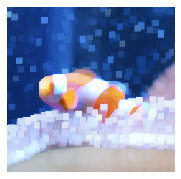

In [43]:
img_pooled = np.transpose(img_pooled, (0, 2, 3, 1))
img_pooled = img_pooled.astype(np.uint8)
plot_image_panel(img_pooled)